In [3]:
#Version Numbers Used to Generate this Pset:
#seaborn=0.11.2
#scipy==1.8.0
#numpy==1.22.2
#matplotlib==3.5.1

import scipy as sp
from pylab import *
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import seaborn as sns
import collections
from IPython.display import clear_output
import random
import openpyxl

sns.set_style("ticks")


In [4]:
Coalescence_data_path ="Analyzed/processed_CoalescenceEvent_synthetic.xlsx"
Communities_data_path ="Analyzed/processed_Communities_synthetic.xlsx"
Coalescence_recipe_path="Postprocessed/CoalescenceRecipe.xlsx"
Meta_data_path="Postprocessed/Metadata.xlsx"
Processed_sequences_path="Postprocessed/processed_Sequences.xlsx"

Coalescence_data=pd.read_excel(Coalescence_data_path)
Communities_data=pd.read_excel(Communities_data_path)
Coalescence_recipe=pd.read_excel(Coalescence_recipe_path)
Metadata=pd.read_excel(Meta_data_path)
Processed_sequences=pd.read_excel(Processed_sequences_path)
exception_list=['P4-23','P4-24']


In [5]:
def getIDX(data, IDX):
    O = np.flatnonzero([x == IDX for x in data['SampleIDX']])
    return O

def getAbundance(IDX):
    global Processed_sequences
    SampleIdx= np.flatnonzero([x == IDX for x in Processed_sequences['SampleIdx']])
    if not any(SampleIdx):
        return
    else:
        O=Processed_sequences.iloc[SampleIdx].values.tolist()[0][1:]
        return O

def CommunityPermutate(Timepoint, CommunityOrigin, Medium, CoalescenceType):
    global Metadata
    idx = np.where((Metadata['Timepoint'] == Timepoint) &
                   (Metadata['CommunityOrigin'] == CommunityOrigin) &
                   (Metadata['Medium'] == Medium) &
                   (Metadata['CoalescenceType'] == CoalescenceType))[0]
    O = np.concatenate(Metadata['SampleIDX'][idx])
    return O

def CommunityPermutate_withSpeciesPoolsize(Timepoint, CommunityOrigin, Medium, CoalescenceType, species_pool_num):
    global Metadata,exception_list
    idx = (Metadata['Timepoint'] == Timepoint) & \
          (Metadata['CommunityOrigin'] == CommunityOrigin) & \
          (Metadata['Medium'] == Medium) & \
          (Metadata['CoalescenceType'] == CoalescenceType)

    communityIDX = np.array([int(x) for x in Metadata['CommunityIDX']])
    if CoalescenceType == 'S':
        if species_pool_num == 6:
            idx = idx & (communityIDX <= 9)
        elif species_pool_num == 12:
            idx = idx & ((communityIDX > 9) & (communityIDX <= 18))
        elif species_pool_num == 24:
            idx = idx & ((communityIDX > 18) & (communityIDX <= 30))
    elif CoalescenceType == 'C':
        if species_pool_num == 6:
            idx = idx & (communityIDX <= 14)
        elif species_pool_num == 12:
            idx = idx & ((communityIDX > 14) & (communityIDX <= 41))
        elif species_pool_num == 24:
            idx = idx & ((communityIDX > 41) & (communityIDX <= 47))

    O = Metadata['SampleIDX'][idx]
    O = list(set(O) - set(exception_list))
    return O

In [6]:
mediums = ["LN", "MN", "HN"]
species_pools = [6, 12, 24]
Syn_Coal_IDX = {
    "LN_6": CommunityPermutate_withSpeciesPoolsize("F", "S", "L", "C", 6),
    "LN_12": CommunityPermutate_withSpeciesPoolsize("F", "S", "L", "C", 12),
    "LN_24": CommunityPermutate_withSpeciesPoolsize("F", "S", "L", "C", 24),
    "MN_6": CommunityPermutate_withSpeciesPoolsize("F", "S", "M", "C", 6),
    "MN_12": CommunityPermutate_withSpeciesPoolsize("F", "S", "M", "C", 12),
    "MN_24": CommunityPermutate_withSpeciesPoolsize("F", "S", "M", "C", 24),
    "HN_6": CommunityPermutate_withSpeciesPoolsize("F", "S", "H", "C", 6),
    "HN_12": CommunityPermutate_withSpeciesPoolsize("F", "S", "H", "C", 12),
    "HN_24": CommunityPermutate_withSpeciesPoolsize("F", "S", "H", "C", 24)
}
Syn_Sub_IDX = Syn_Sub_IDX = {
    "LN_6": CommunityPermutate_withSpeciesPoolsize("F", "S", "L", "S", 6),
    "LN_12": CommunityPermutate_withSpeciesPoolsize("F", "S", "L", "S", 12),
    "LN_24": CommunityPermutate_withSpeciesPoolsize("F", "S", "L", "S", 24),
    "MN_6": CommunityPermutate_withSpeciesPoolsize("F", "S", "M", "S", 6),
    "MN_12": CommunityPermutate_withSpeciesPoolsize("F", "S", "M", "S", 12),
    "MN_24": CommunityPermutate_withSpeciesPoolsize("F", "S", "M", "S", 24),
    "HN_6": CommunityPermutate_withSpeciesPoolsize("F", "S", "H", "S", 6),
    "HN_12": CommunityPermutate_withSpeciesPoolsize("F", "S", "H", "S", 12),
    "HN_24": CommunityPermutate_withSpeciesPoolsize("F", "S", "H", "S", 24)
}

Index(['SampleIDX', 'IDX', 'Timepoint', 'CommunityOrigin', 'Medium',
       'CoalescenceType', 'Replicate', 'CommunityIDX', 'fieldOD1', 'fieldOD2',
       'fieldOD3', 'fieldOD4', 'fieldOD5', 'fieldOD6', 'fieldOD7', 'fieldPH1',
       'fieldPH2', 'fieldPH3', 'fieldPH4', 'fieldPH5', 'fieldPH6', 'fieldPH7',
       'fieldGC1', 'fieldGC2', 'fieldGC3', 'Threshold_num',
       'Threshold_level_1', 'DiversityR_1', 'DiversitySN_1', 'DiversitySS_1',
       'Threshold_level_2', 'DiversityR_2', 'DiversitySN_2', 'DiversitySS_2',
       'Threshold_level_3', 'DiversityR_3', 'DiversitySN_3', 'DiversitySS_3',
       'Threshold_level_4', 'DiversityR_4', 'DiversitySN_4', 'DiversitySS_4',
       'Threshold_level_5', 'DiversityR_5', 'DiversitySN_5', 'DiversitySS_5'],
      dtype='object')

In [8]:
def getAbundance(Processed_sequences,IDX_list):
    IDX_list_=np.squeeze([np.where(Processed_sequences['SampleIDX']==x) for x in IDX_list.values.tolist()])
    return (np.array(Processed_sequences.iloc[IDX_list_].values)[:,1:]).astype(float)

def getCommunities(Communities_data,IDX_list):
    IDX_list_=np.squeeze([np.where(Communities_data['SampleIDX']==x) for x in IDX_list])
    return (Communities_data.iloc[IDX_list_])

def getCoalescence(Coalescence_data,IDX_list):
    IDX_list_=np.squeeze([np.where(Coalescence_data['SampleIDX']==x) for x in IDX_list])#IDX_list_
    return (Coalescence_data.iloc[IDX_list_])

In [66]:
i

2

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


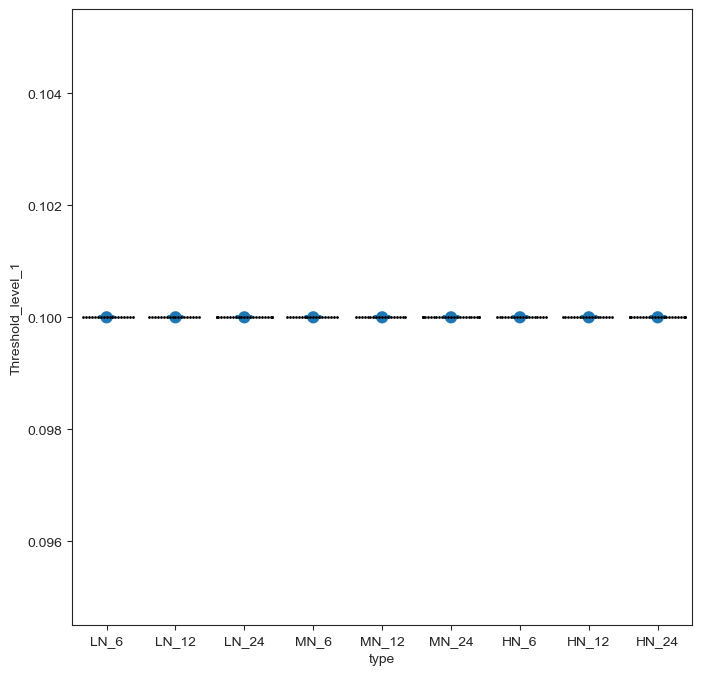

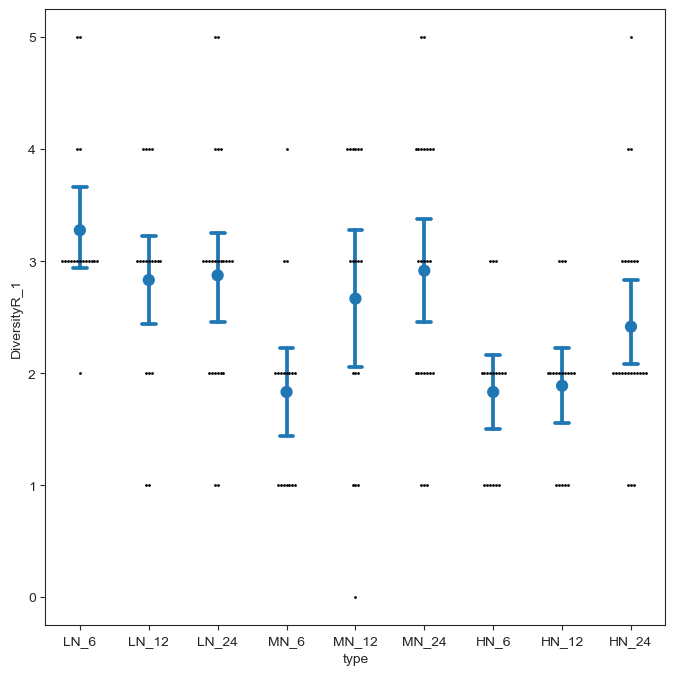

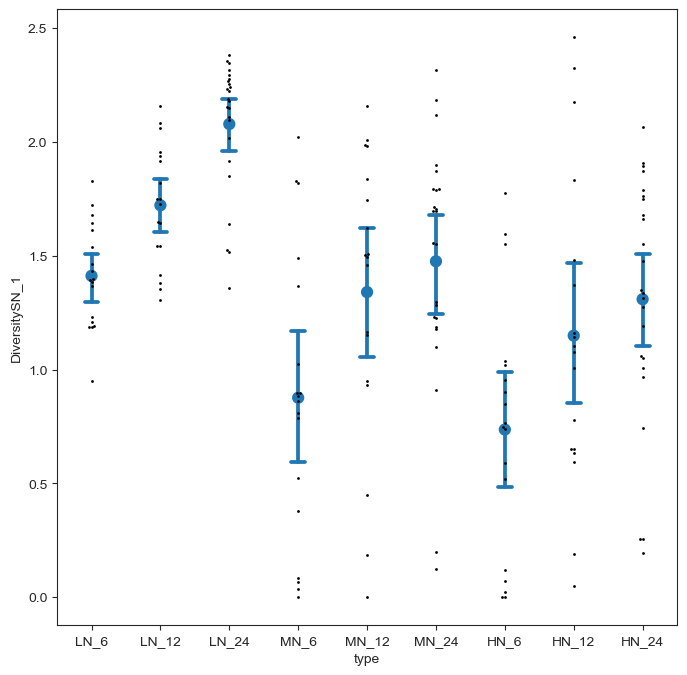

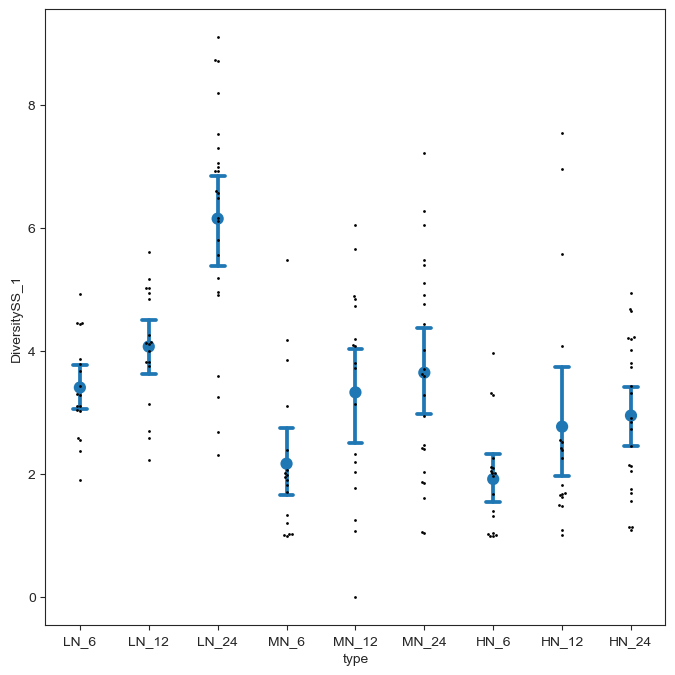

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


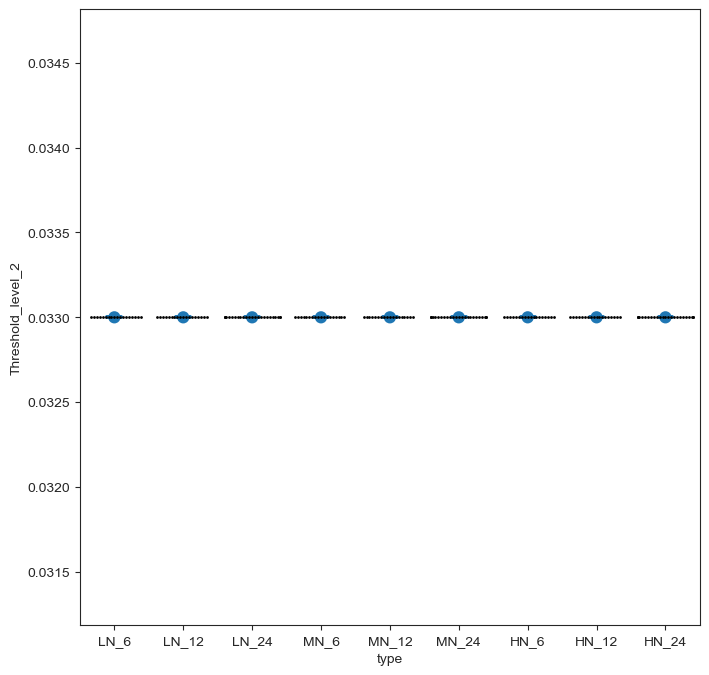

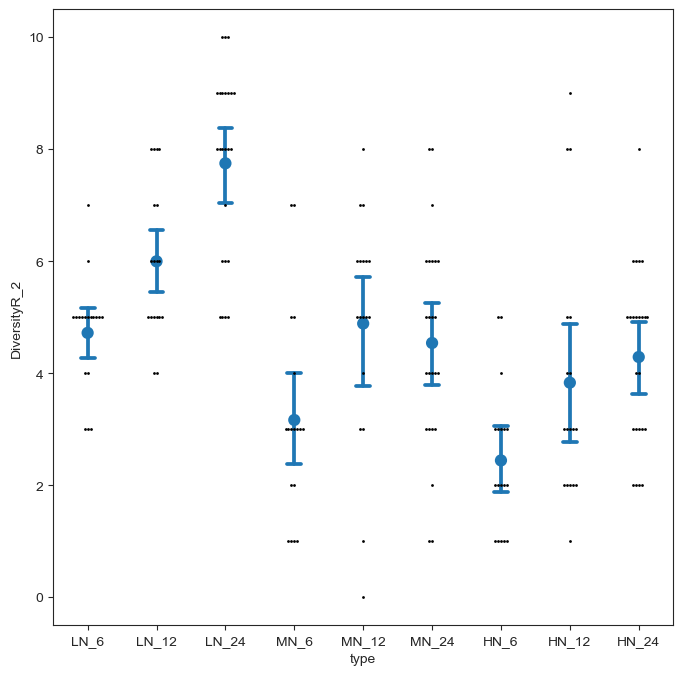

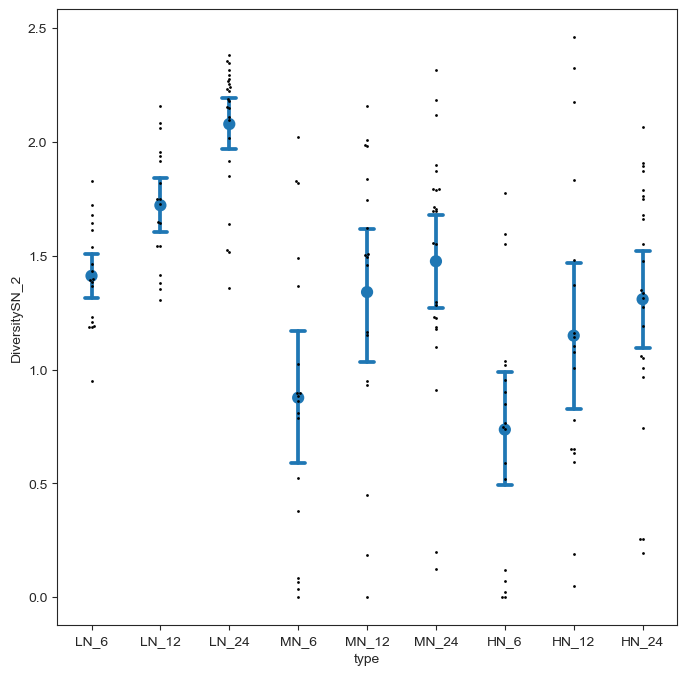

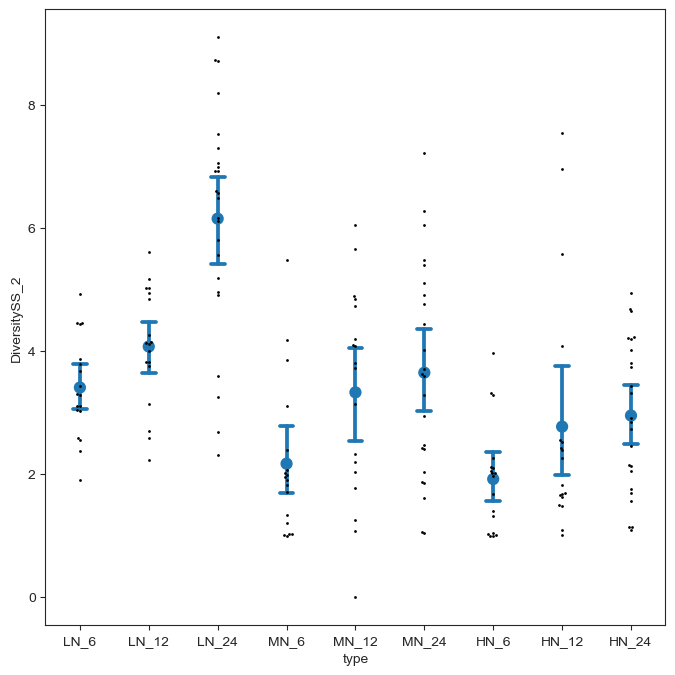

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


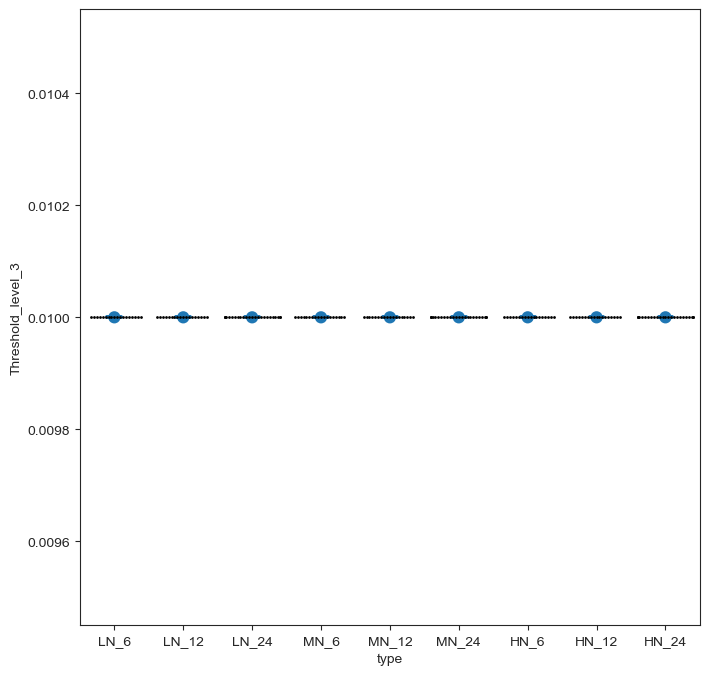

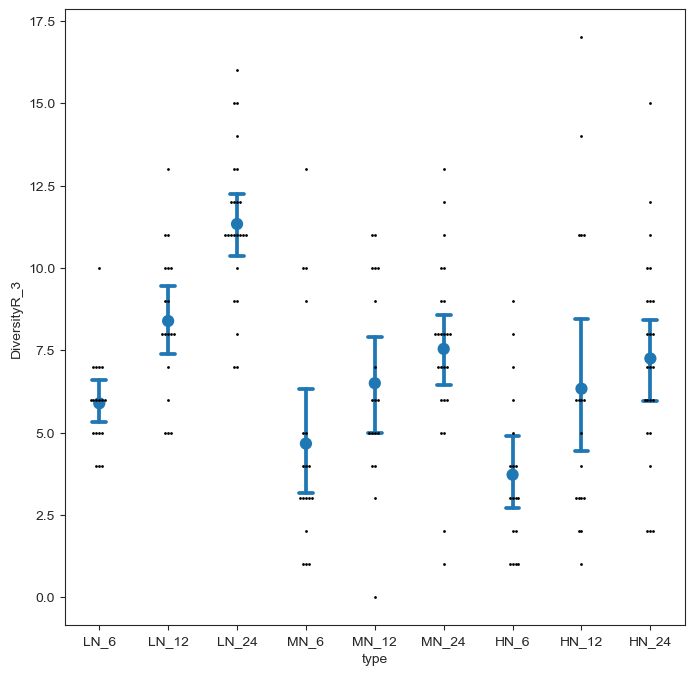

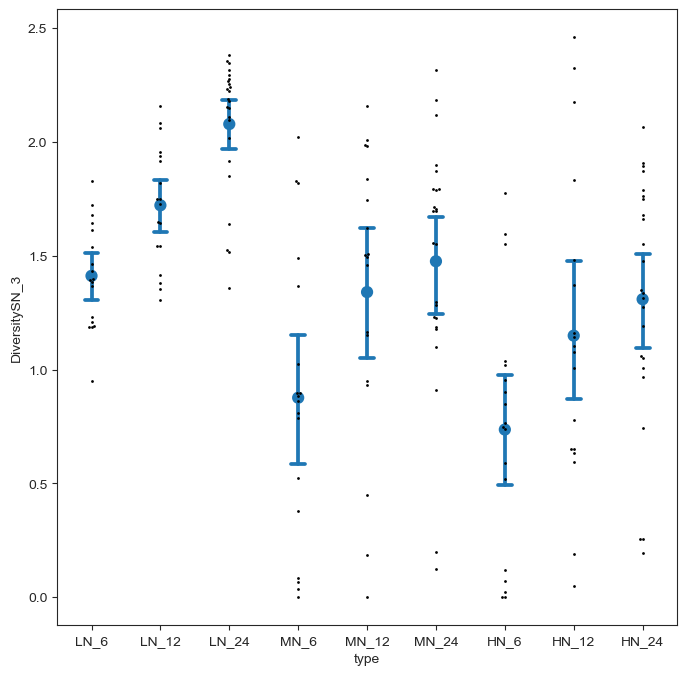

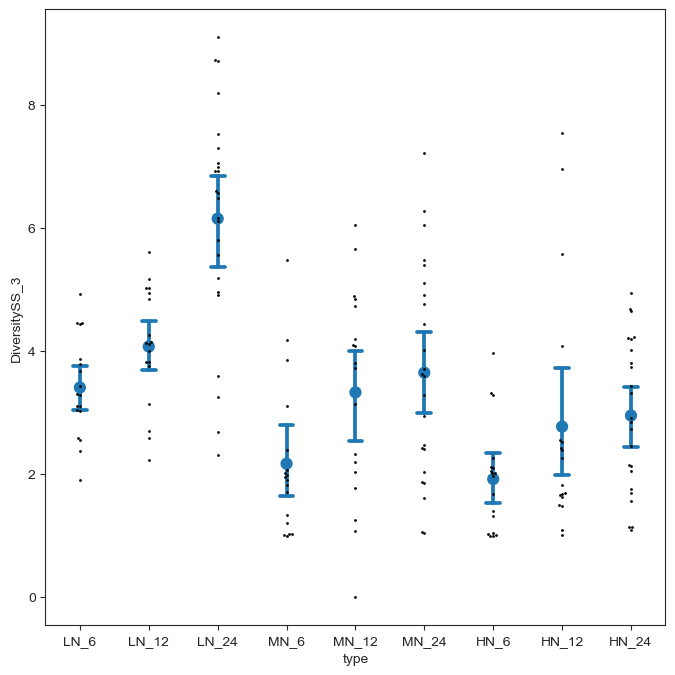

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


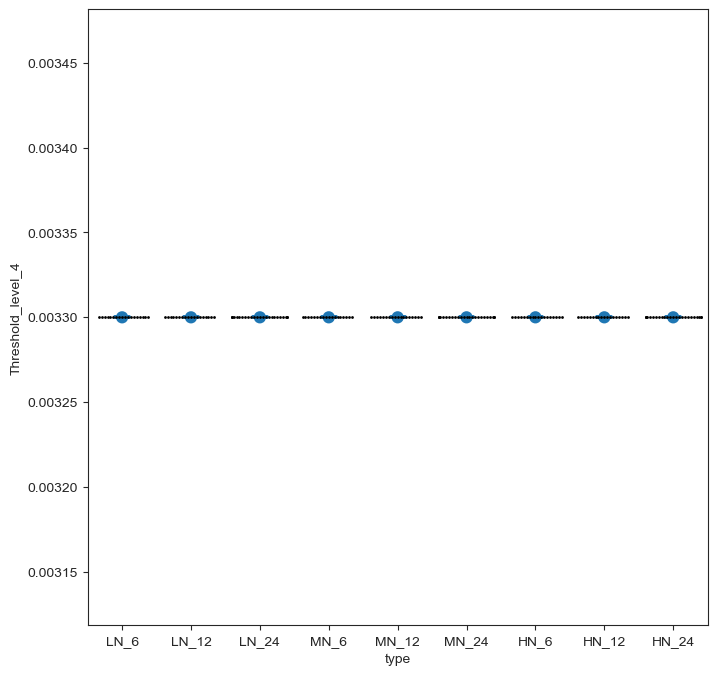

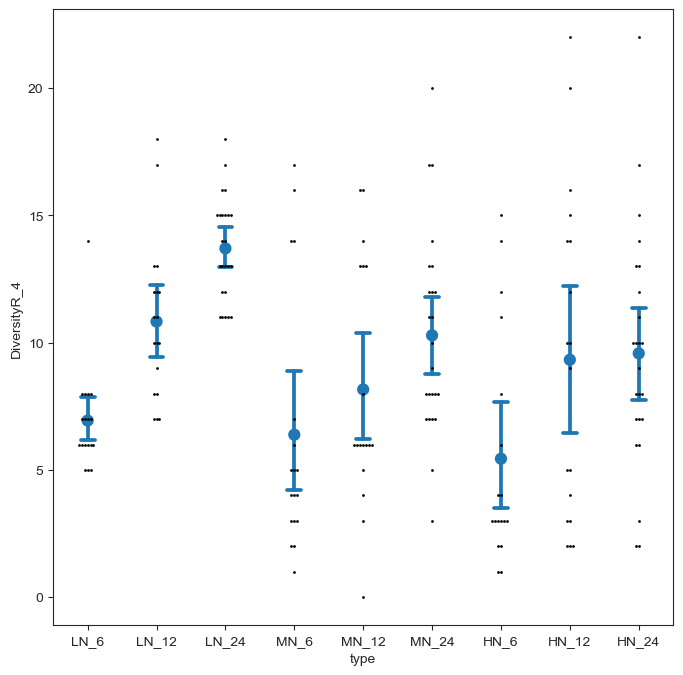

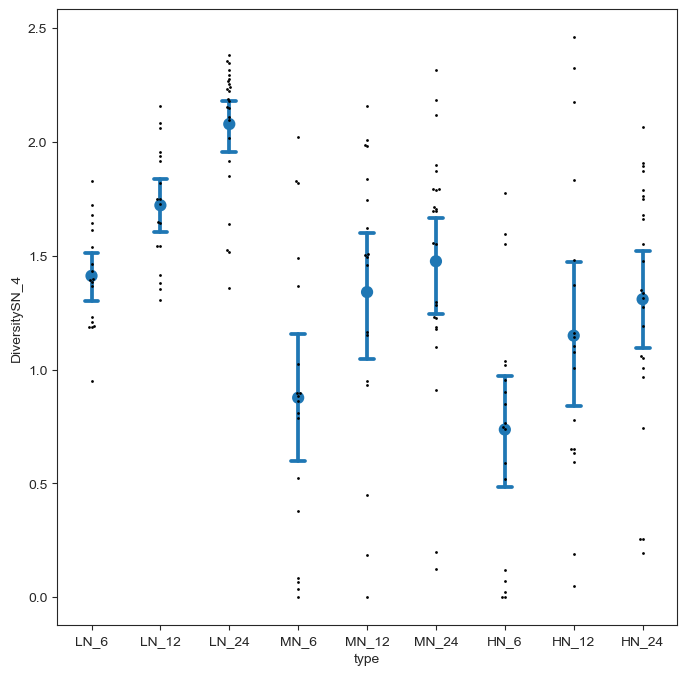

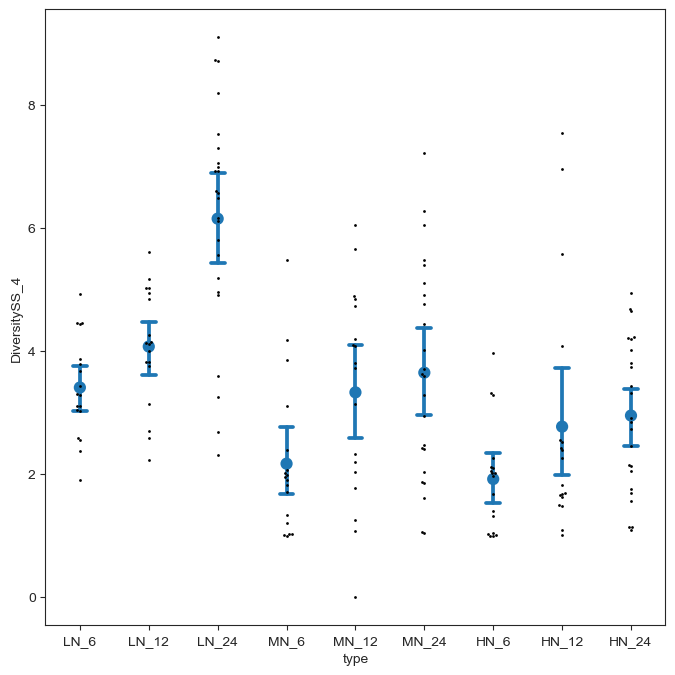

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


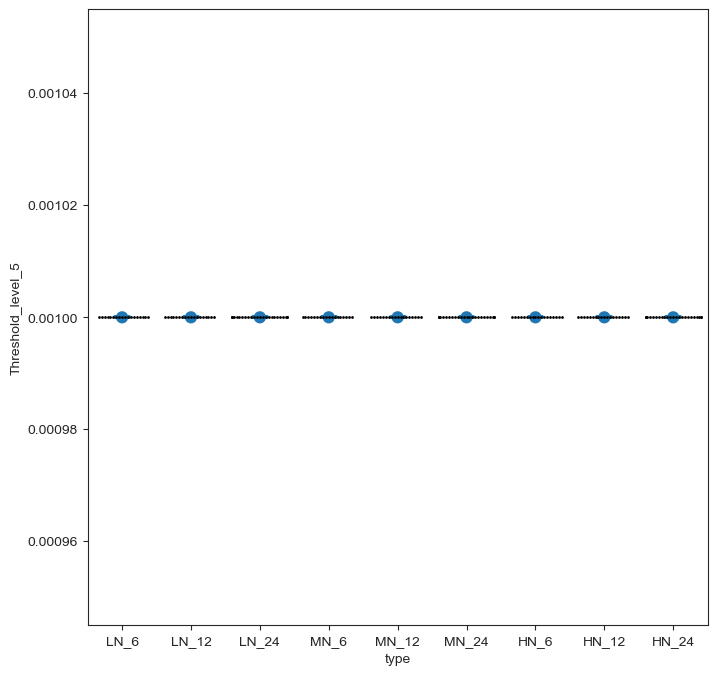

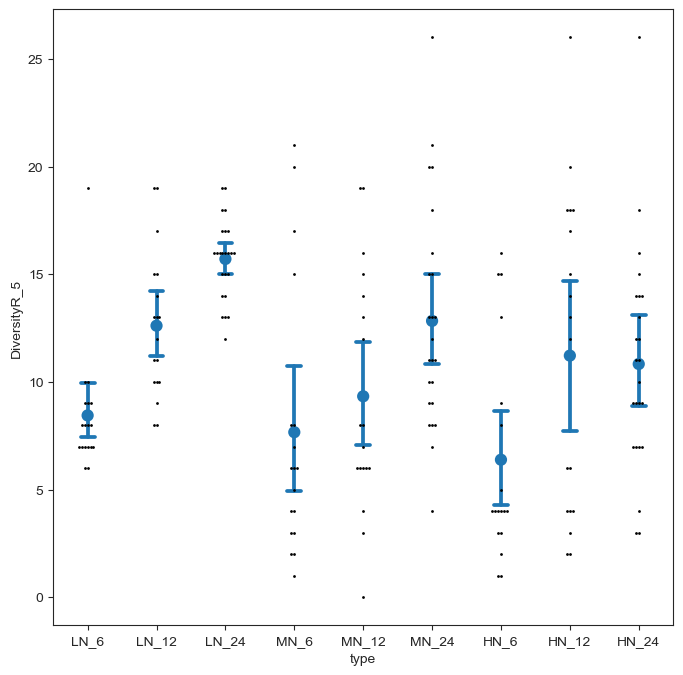

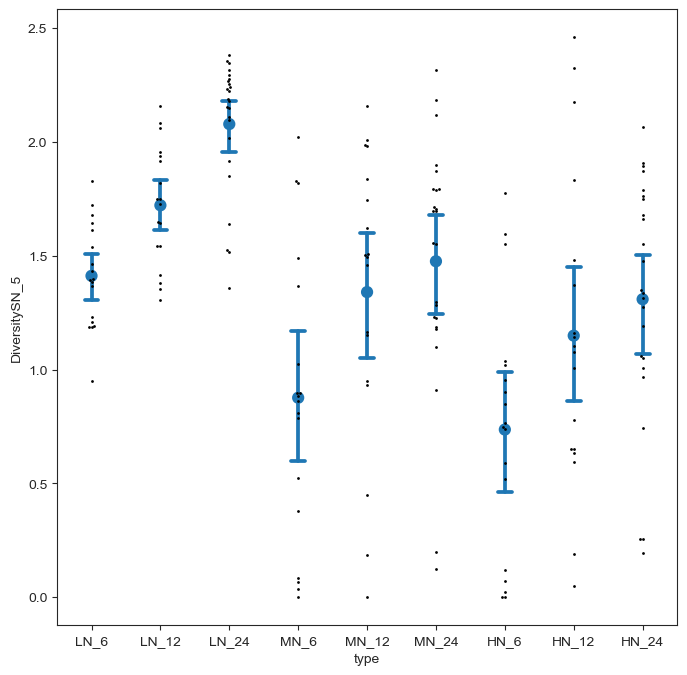

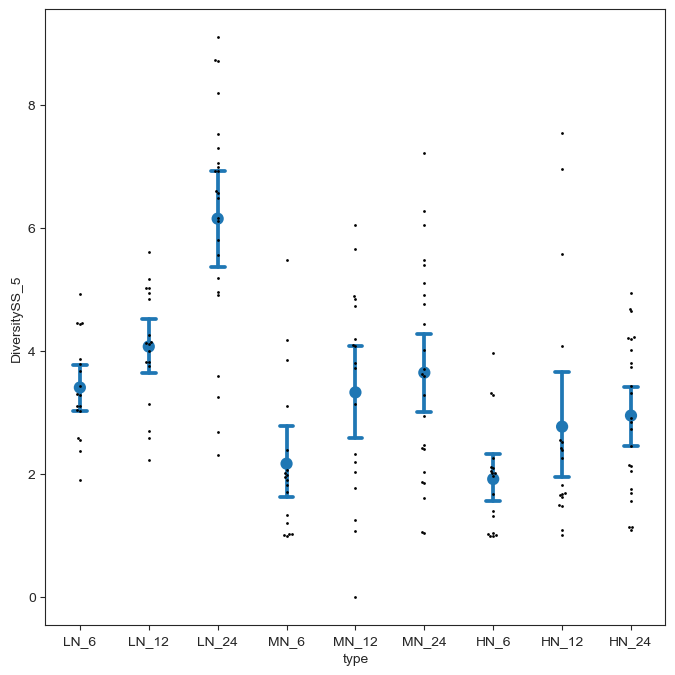

In [67]:
## Figure-Communities-PlotDefault-swarm&point

Variable2plot_list=['Threshold_level_1', 'DiversityR_1', 'DiversitySN_1', 'DiversitySS_1',
       'Threshold_level_2', 'DiversityR_2', 'DiversitySN_2', 'DiversitySS_2',
       'Threshold_level_3', 'DiversityR_3', 'DiversitySN_3', 'DiversitySS_3',
       'Threshold_level_4', 'DiversityR_4', 'DiversitySN_4', 'DiversitySS_4',
       'Threshold_level_5', 'DiversityR_5', 'DiversitySN_5', 'DiversitySS_5']

for Variable2plot in Variable2plot_list:
    data_list = []
    type_list = []
    df=pd.DataFrame()
    Name2show = Variable2plot
    fig=figure(num=None, figsize=(8, 8), dpi=100, facecolor='w', edgecolor='k')
    for j in range(len(mediums)):
        for i in  range(len(species_pools)):
            M = mediums[j]
            S = species_pools[i]
            type_name = M + "_" + str(S)
            IDX_list = Syn_Sub_IDX[type_name]
            data = getCommunities(Communities_data,IDX_list)
            data = data[Variable2plot]
            #data_list.extend(data)
            #type_list.extend([type_name] * len(data))
            df_temp=pd.DataFrame({'data':data, 'type':[type_name] * len(data)})
            df=pd.concat([df,df_temp])


    sns.swarmplot(x='type',y='data', data=df, color='black', size=2)
    sns.pointplot(x='type',y='data', data=df, dodge=True, join=False,  capsize=.2)
    plt.ylabel(Name2show)
    
    #plt.xlabel(("Coalescence Type, Medium, and Number of Species"))
    plt.show()
    fig.savefig("Figures/Comm_Analysis_subcommunities_swarmpoint"+Variable2plot+".png", bbox_inches='tight')
    plt.close(fig)
    
    


#AllAbudnaces=getAbundance(Metadata['SampleIDX'])


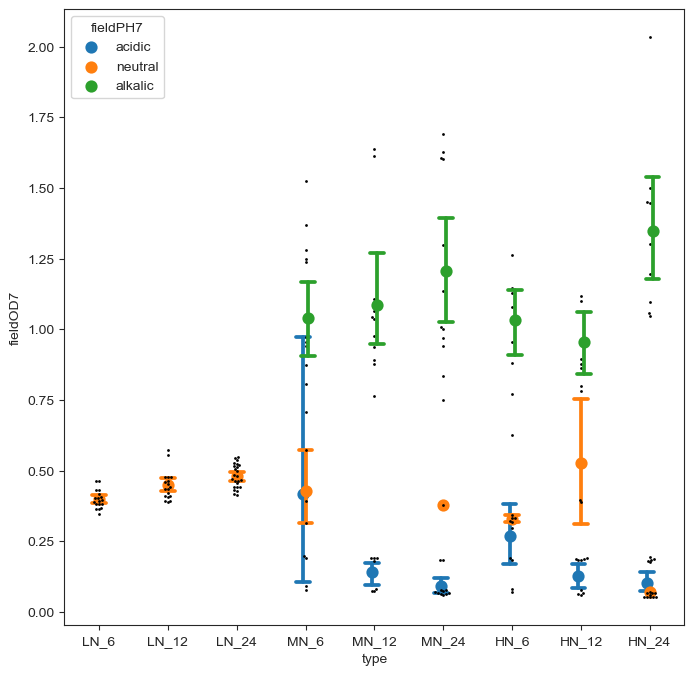

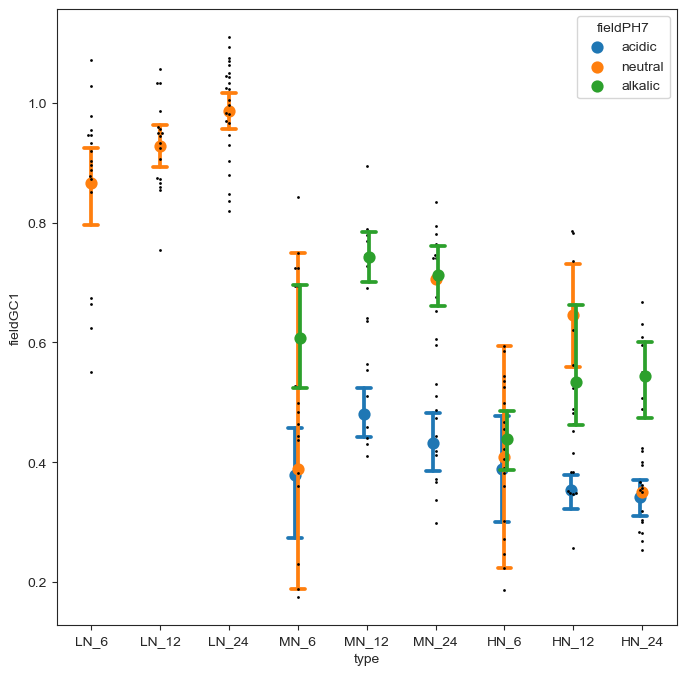

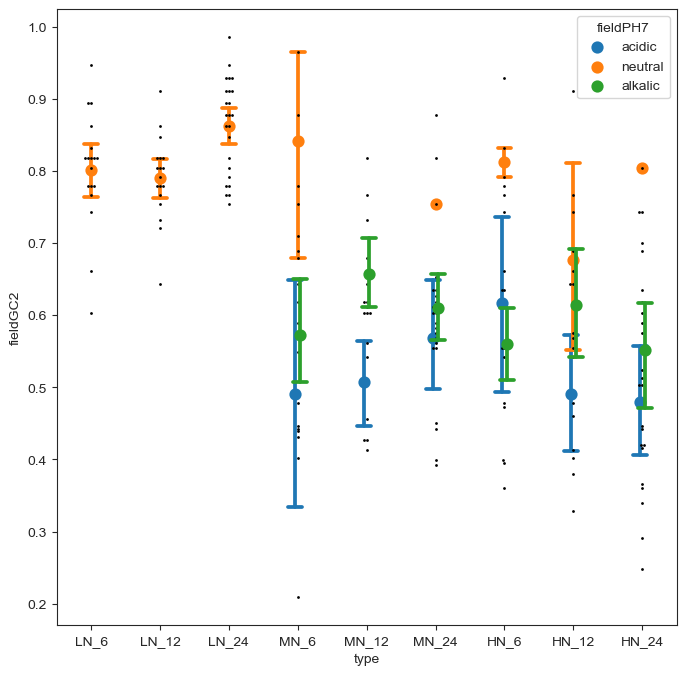

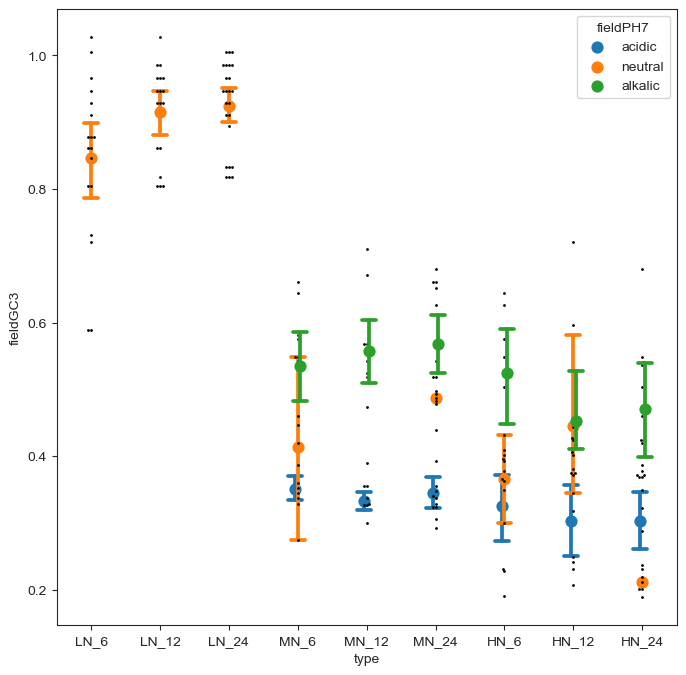

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


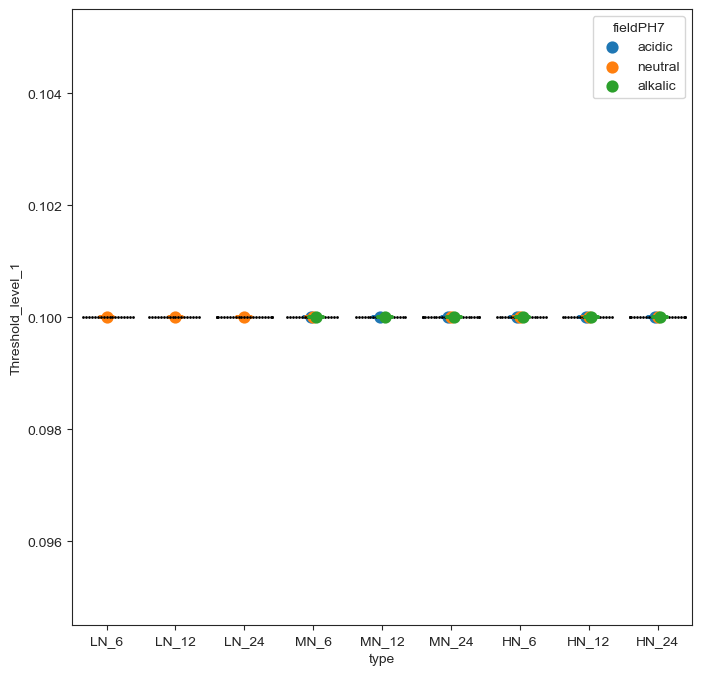

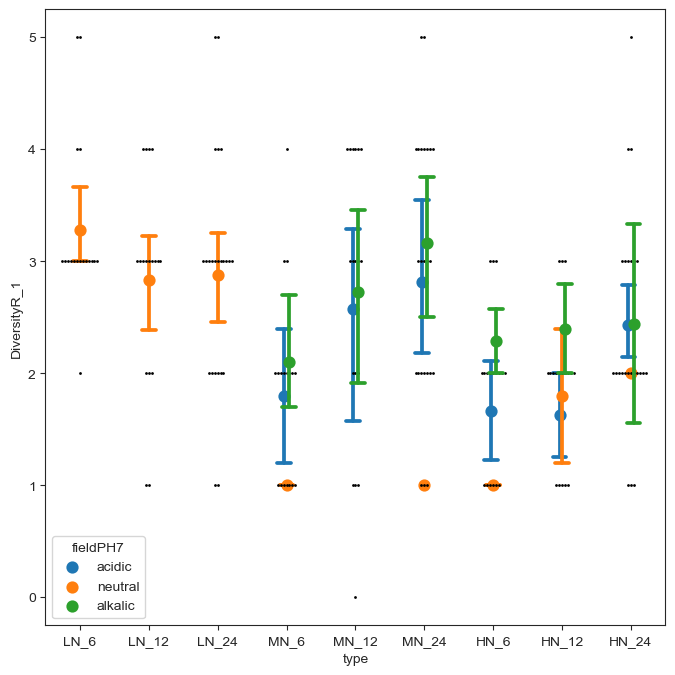

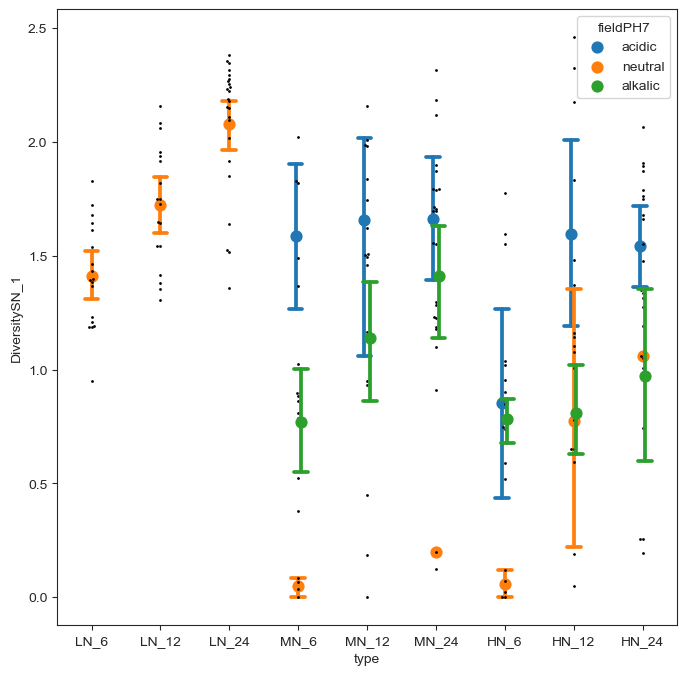

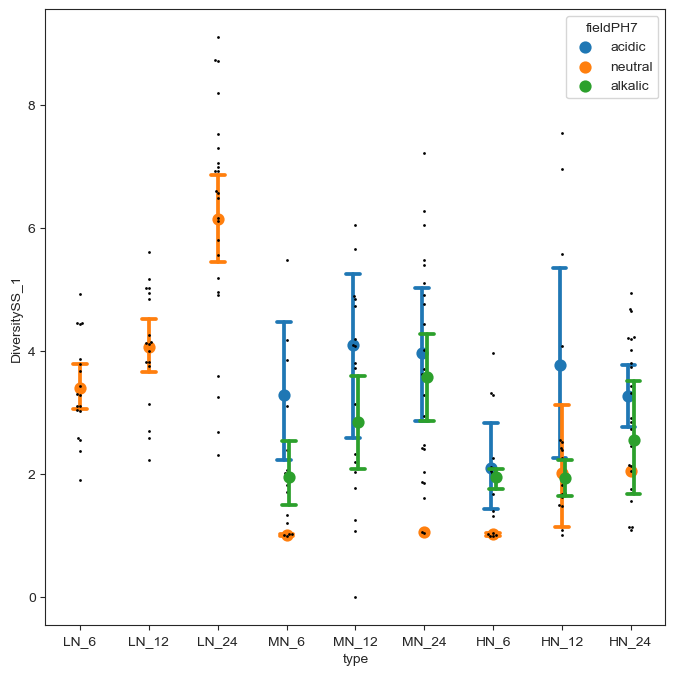

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


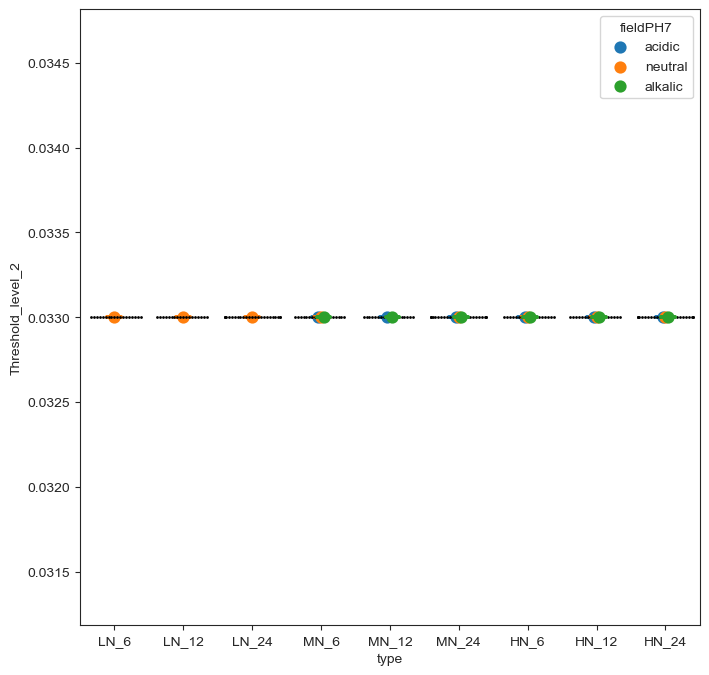

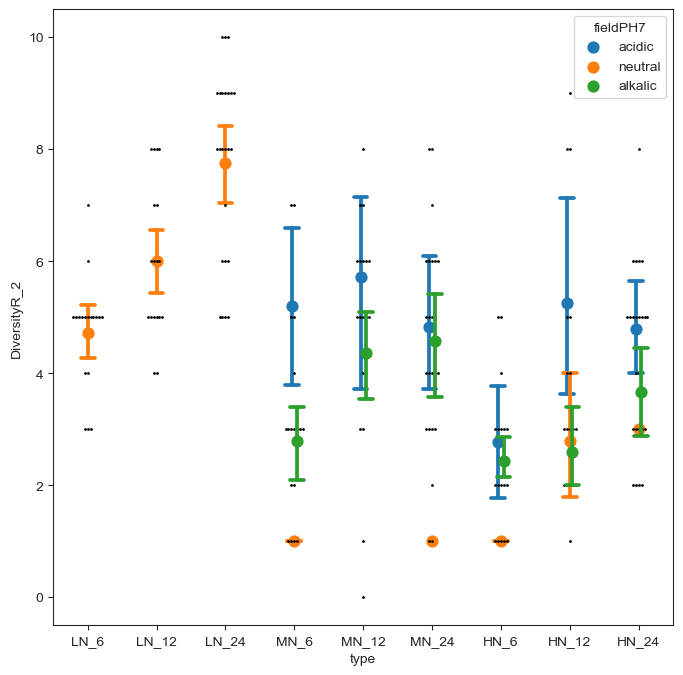

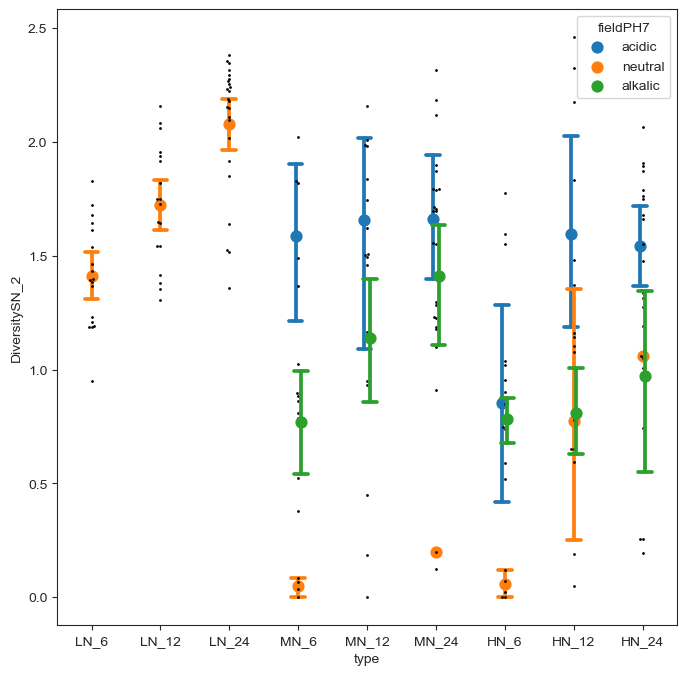

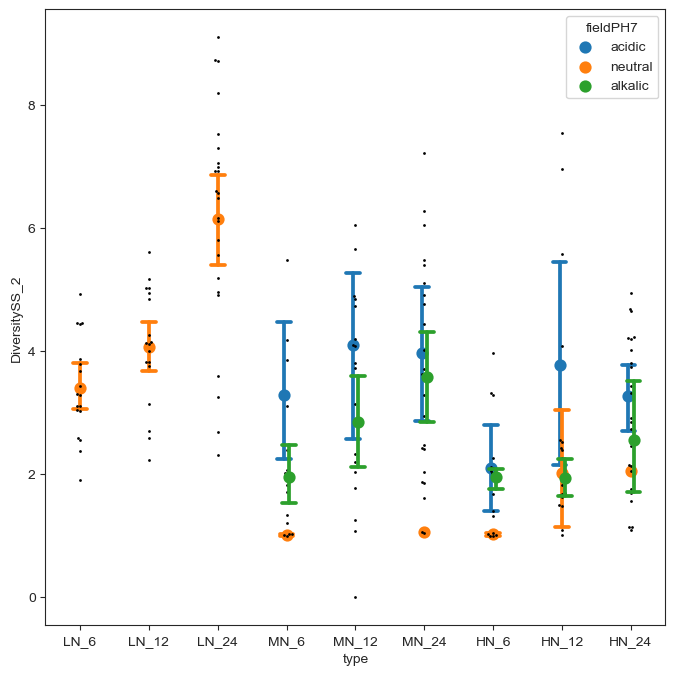

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


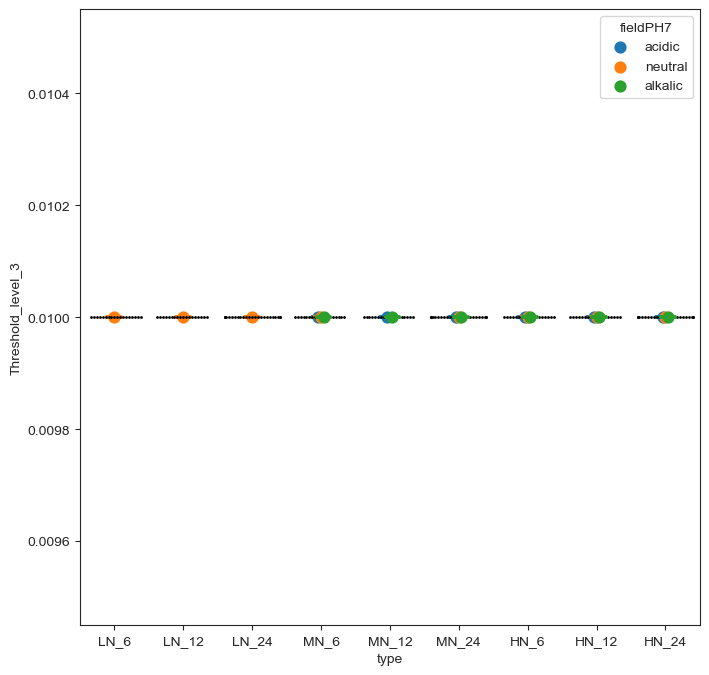

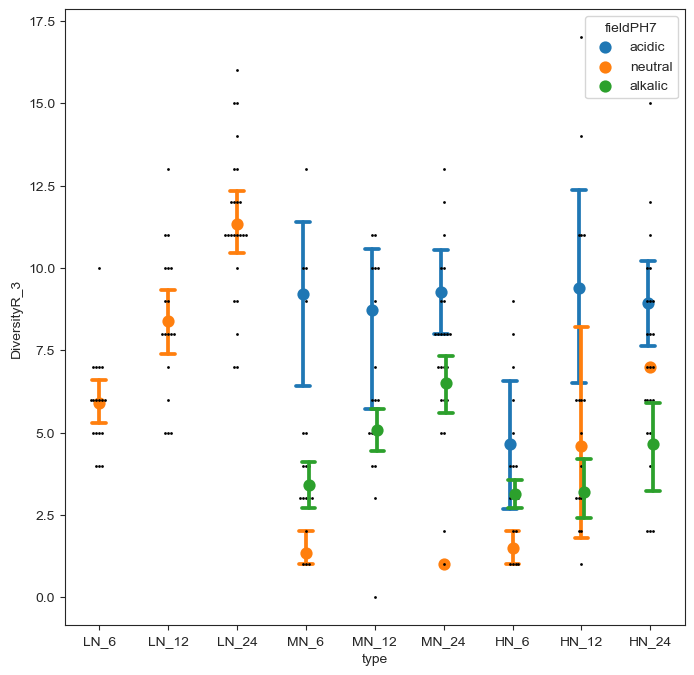

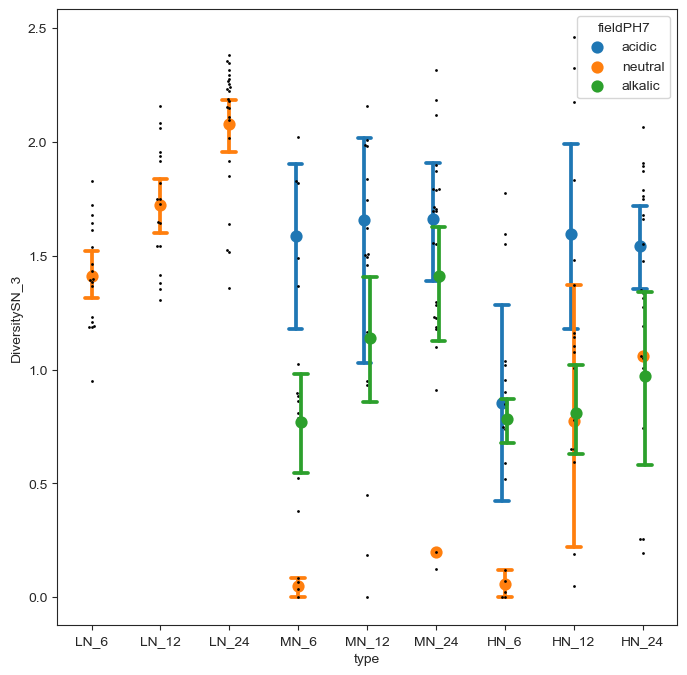

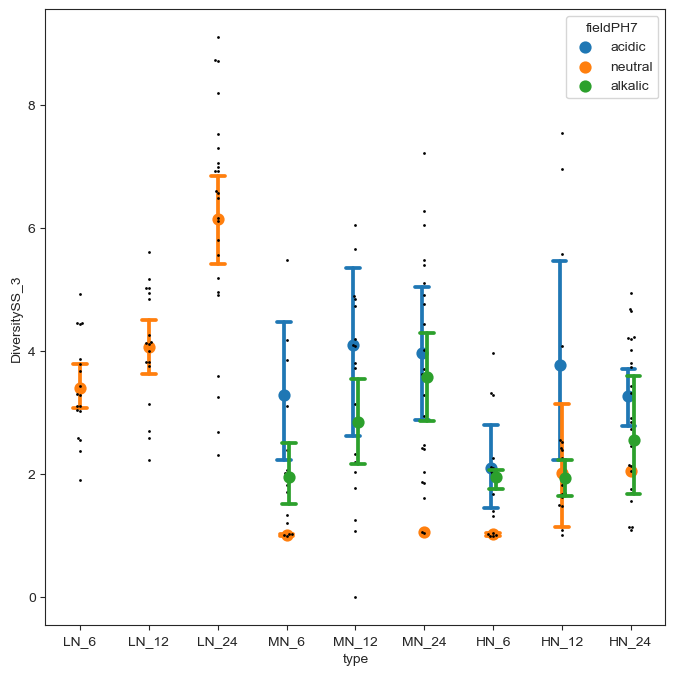

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


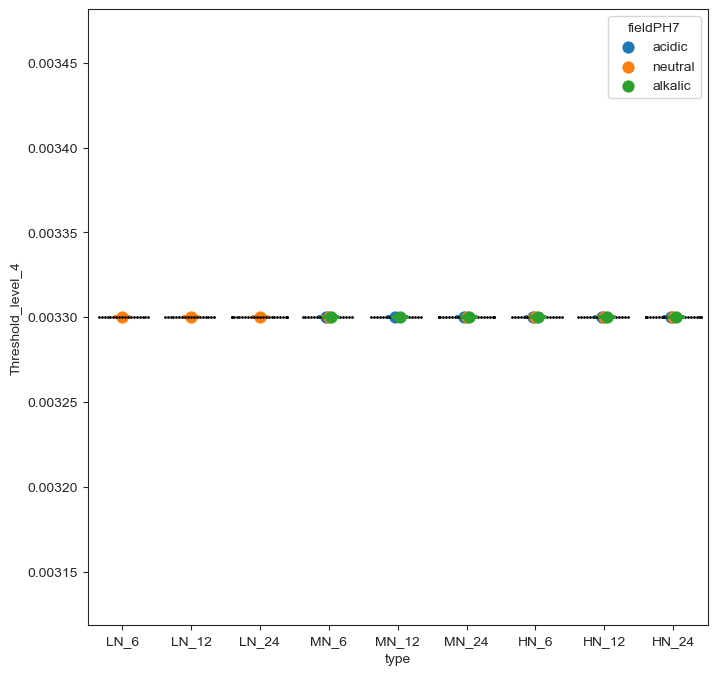

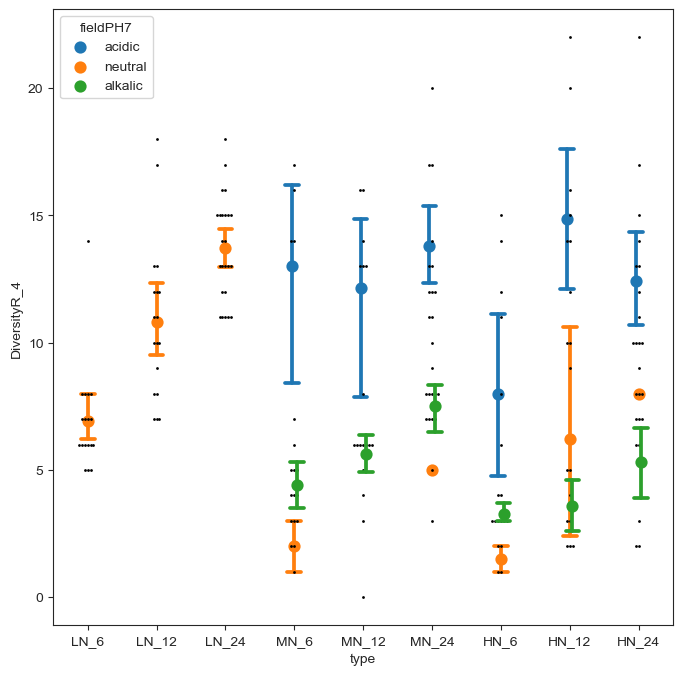

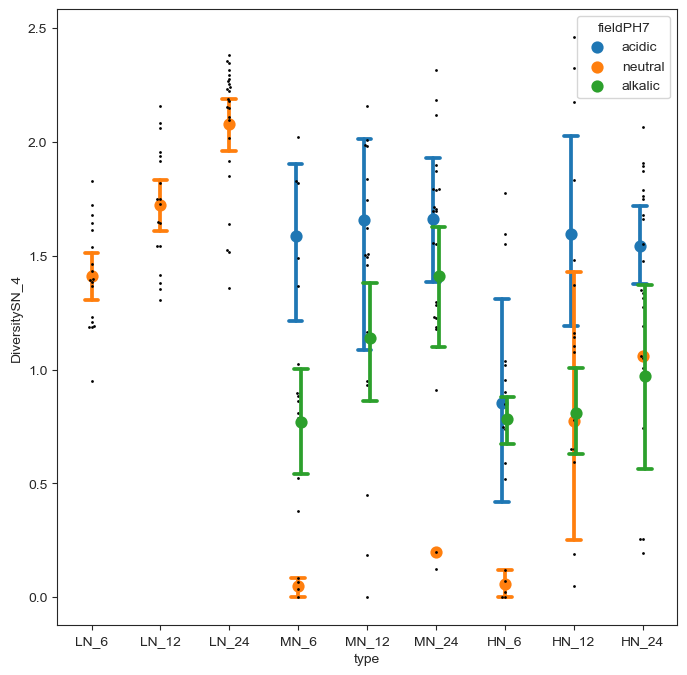

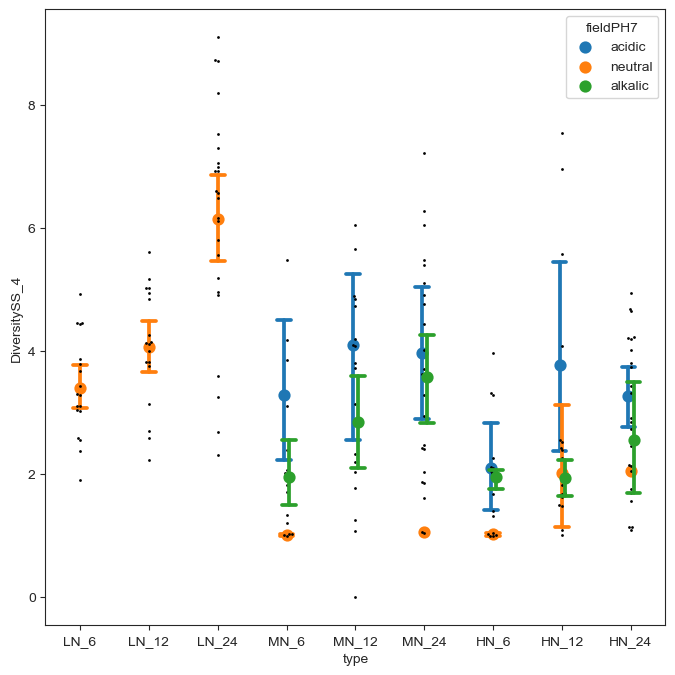

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


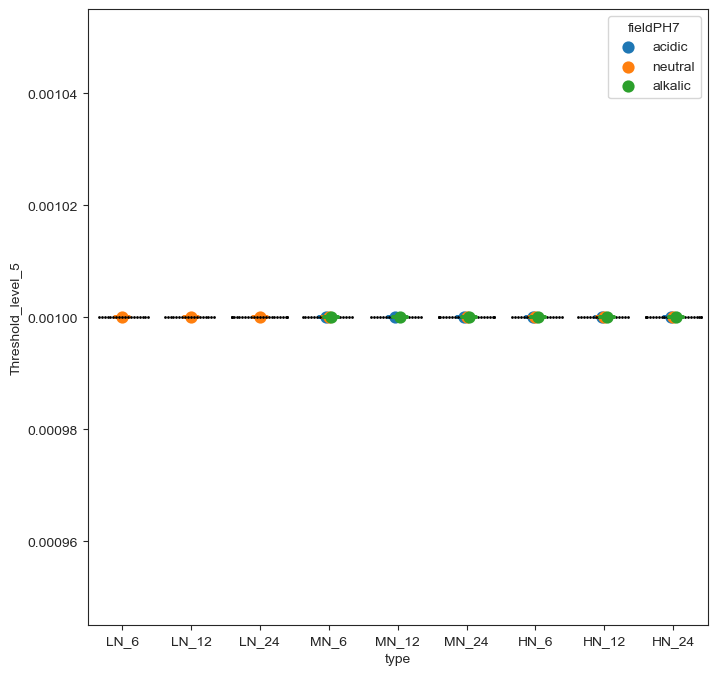

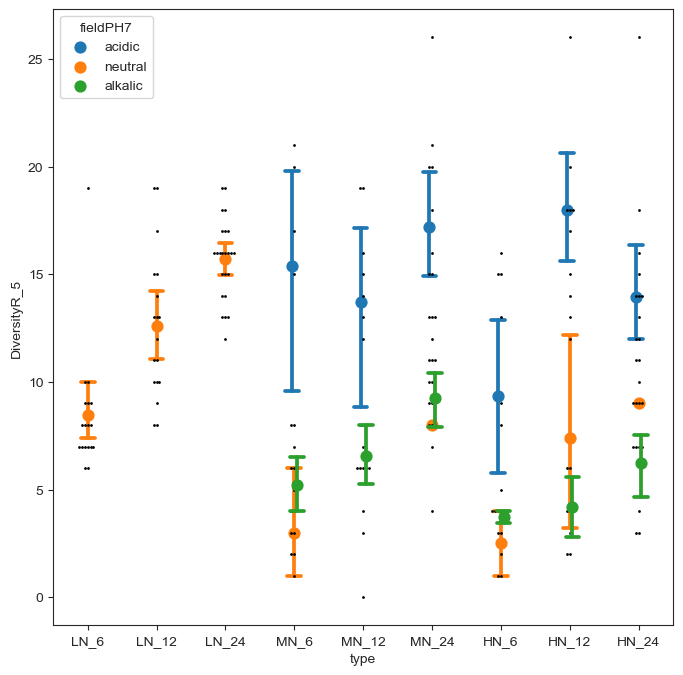

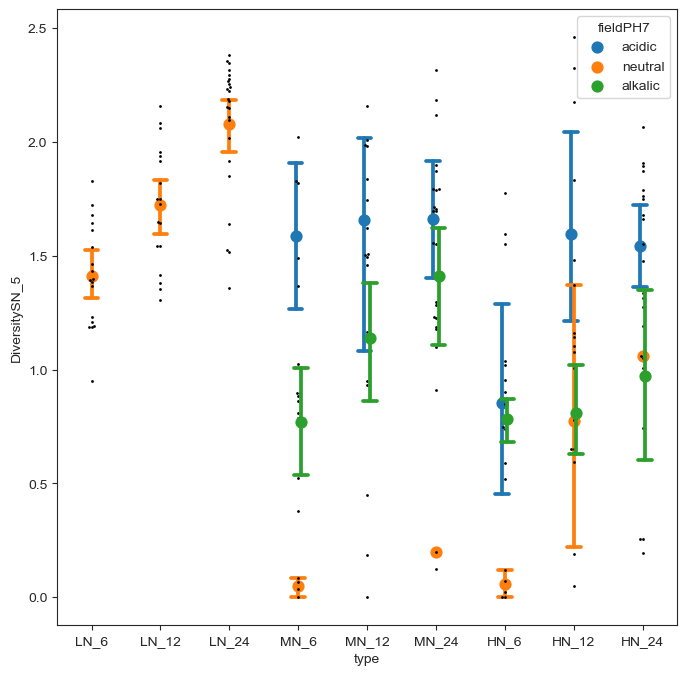

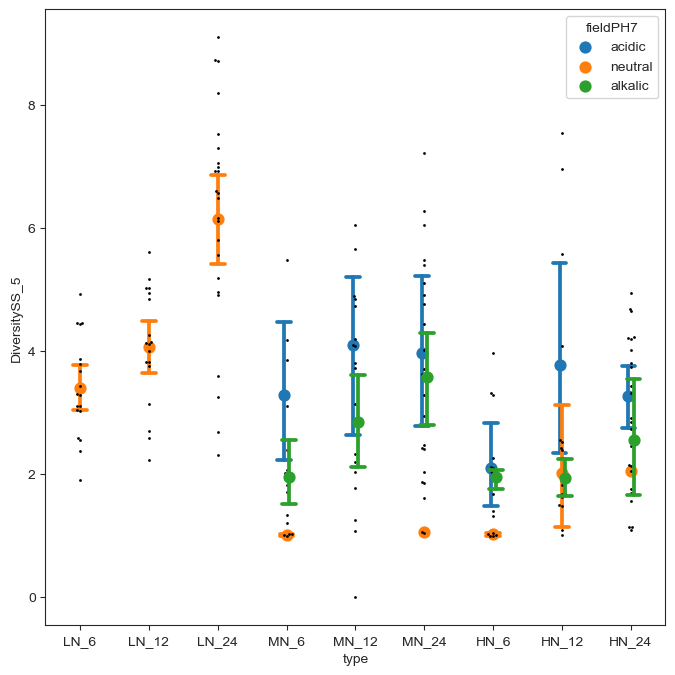

In [102]:
## Figure-SubCommunities-PlotByPH-swarm&point

Variable2plot_list=['fieldOD7', 'fieldGC1', 'fieldGC2', 'fieldGC3', 'Threshold_level_1', 'DiversityR_1', 'DiversitySN_1', 'DiversitySS_1',
       'Threshold_level_2', 'DiversityR_2', 'DiversitySN_2', 'DiversitySS_2',
       'Threshold_level_3', 'DiversityR_3', 'DiversitySN_3', 'DiversitySS_3',
       'Threshold_level_4', 'DiversityR_4', 'DiversitySN_4', 'DiversitySS_4',
       'Threshold_level_5', 'DiversityR_5', 'DiversitySN_5', 'DiversitySS_5']


HueVariable='fieldPH7'
hue_order = ['acidic','neutral','alkalic']
def pHcriteria(pH_list):
    O=1*(pH_list>6)+1*(pH_list>8)
    word_list=['acidic','neutral','alkalic']
    O=[word_list[x] for x in O]
    return O
    
for Variable2plot in Variable2plot_list:
    data_list = []
    type_list = []
    df=pd.DataFrame()
    Name2show = Variable2plot
    fig=figure(num=None, figsize=(8, 8), dpi=100, facecolor='w', edgecolor='k')
    for j in range(len(mediums)):
        for i in  range(len(species_pools)):
            M = mediums[j]
            S = species_pools[i]
            type_name = M + "_" + str(S)
            IDX_list = Syn_Sub_IDX[type_name]
            data = getCommunities(Communities_data,IDX_list)
            hues = data[HueVariable]
            hues = pHcriteria(hues)
            data = data[Variable2plot]
            #data_list.extend(data)
            #type_list.extend([type_name] * len(data))
            df_temp=pd.DataFrame({'data':data, 'type':[type_name] * len(data), HueVariable :hues})
            df=pd.concat([df,df_temp])


    sns.swarmplot(x='type',y='data', data=df,color='black',size=2)
    sns.pointplot(x='type',y='data', data=df, dodge=True,  hue=HueVariable,hue_order=hue_order, join=False,  capsize=.2)
    plt.ylabel(Name2show)
    
    #plt.xlabel(("Coalescence Type, Medium, and Number of Species"))
    plt.show()
    fig.savefig("Figures/Comm_Analysis_subcommunities_byPH_swarmpoint"+Variable2plot+".png", bbox_inches='tight')
    plt.close(fig)
    
    


#AllAbudnaces=getAbundance(Metadata['SampleIDX'])


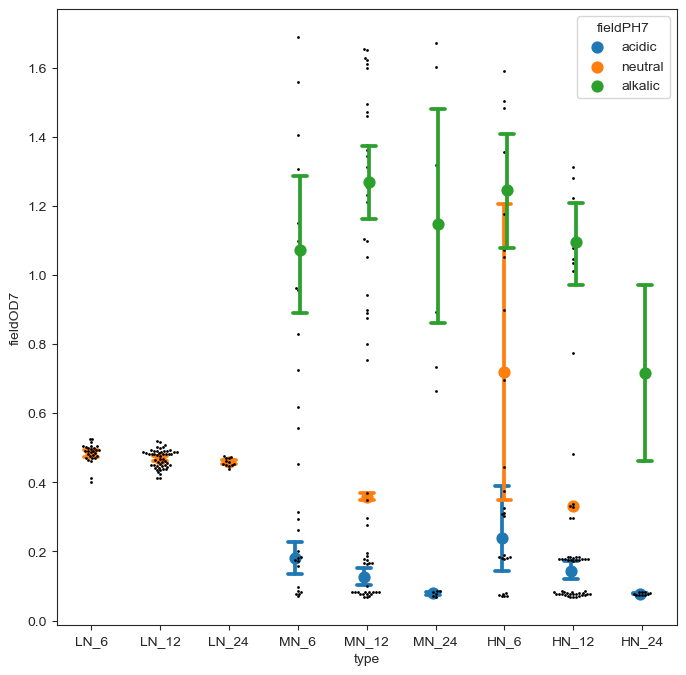

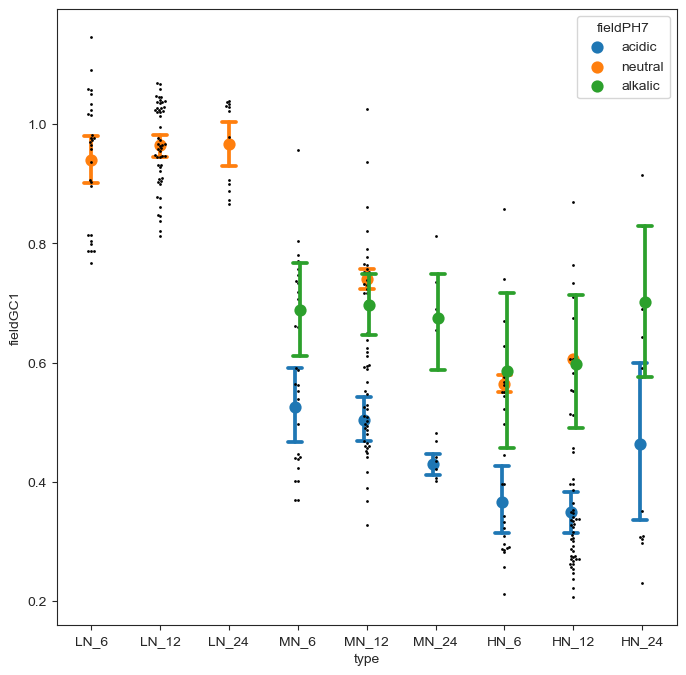

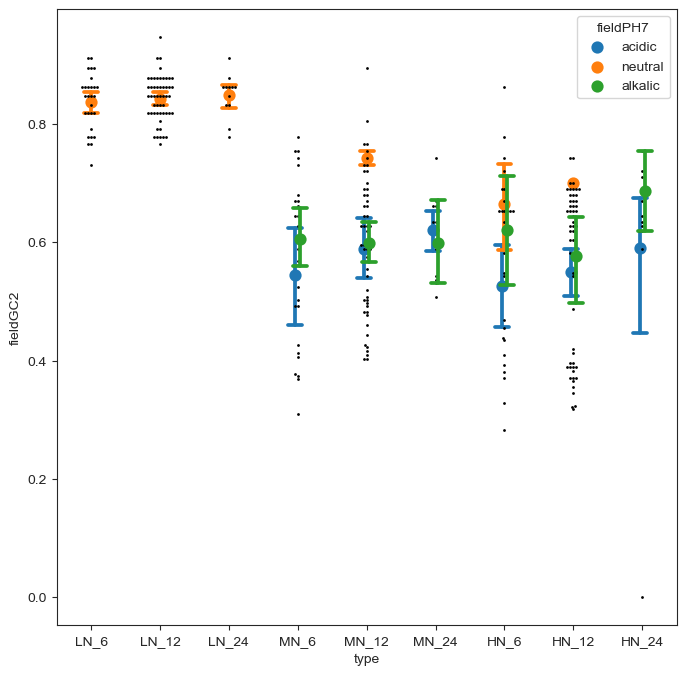

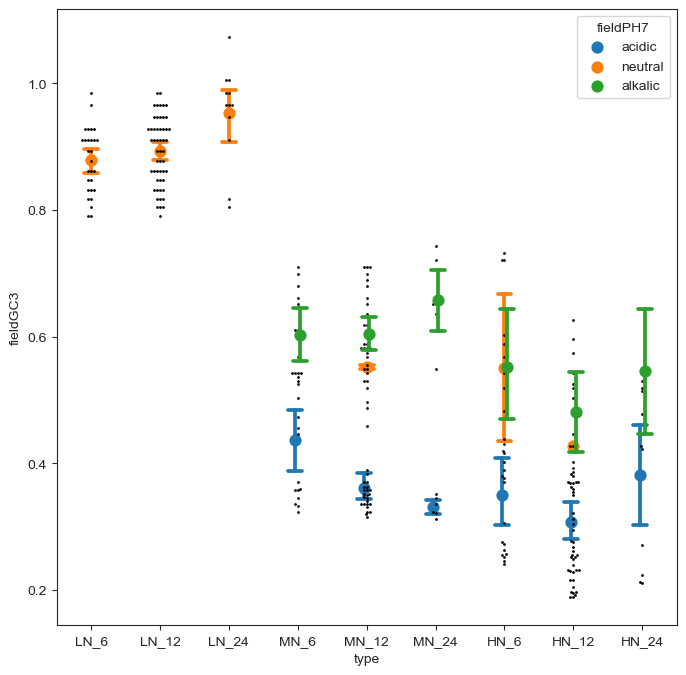

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 63.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 64.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

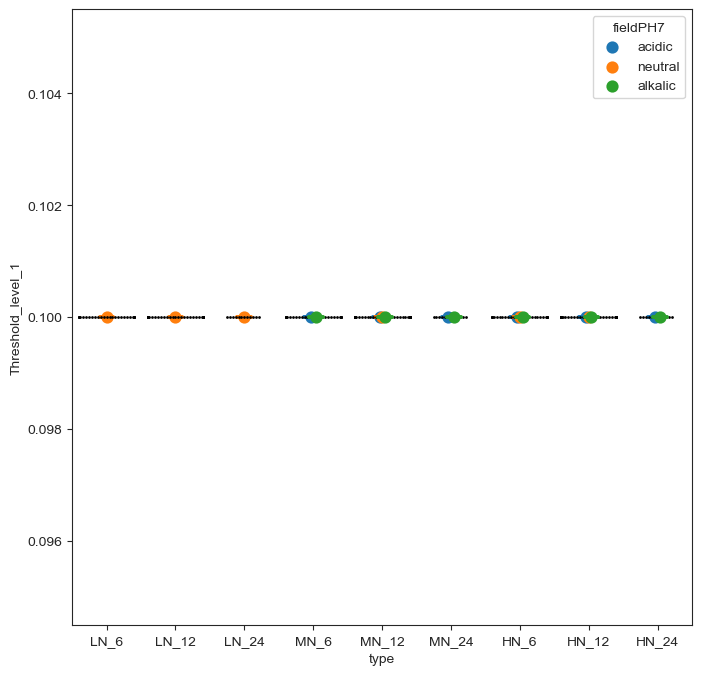

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 11.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 11.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


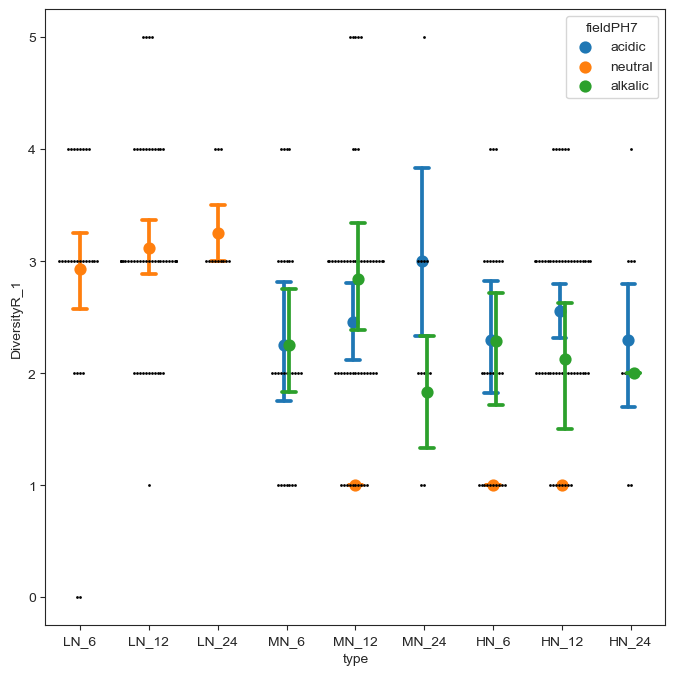

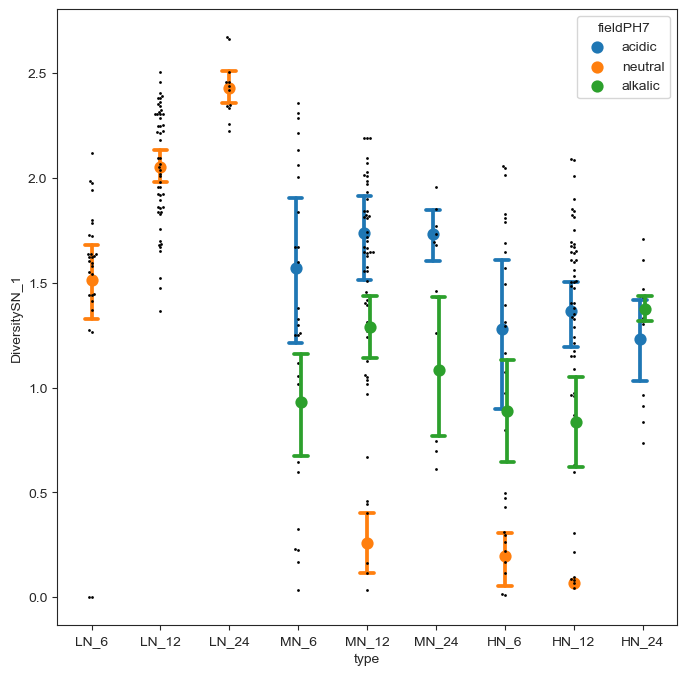

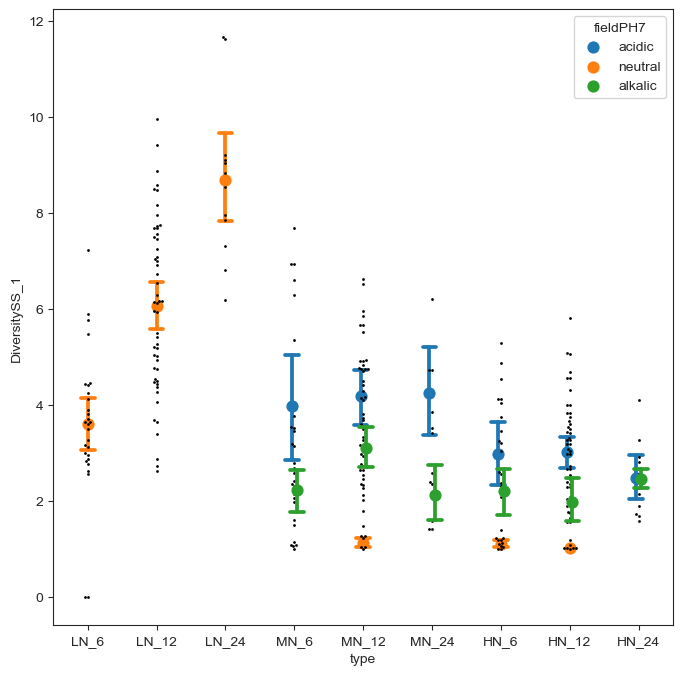

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 63.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 64.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

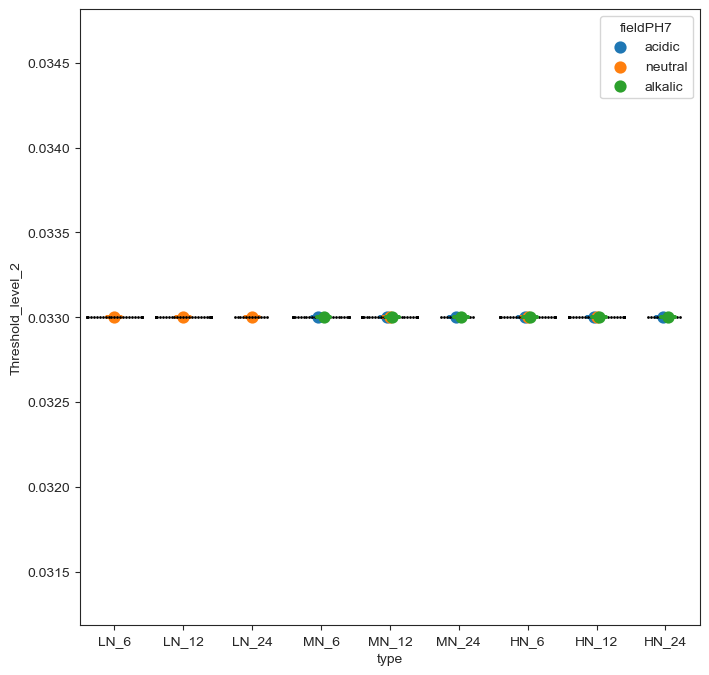

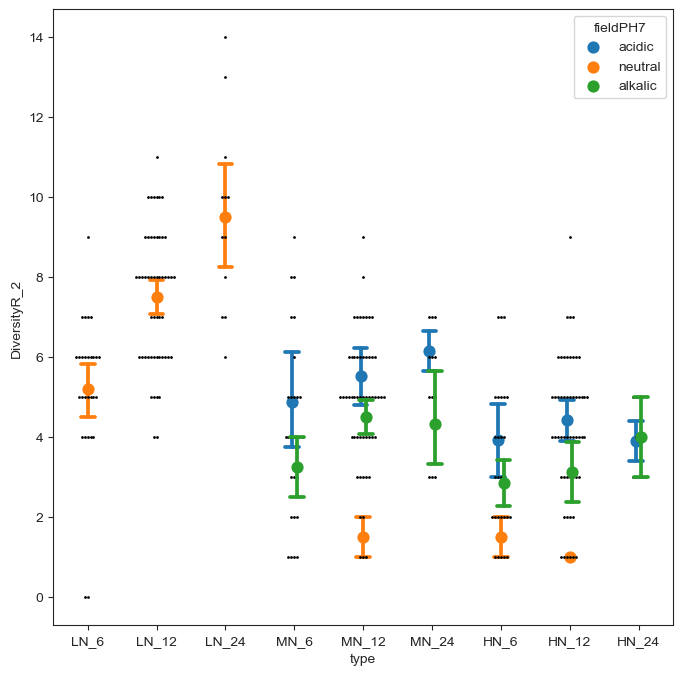

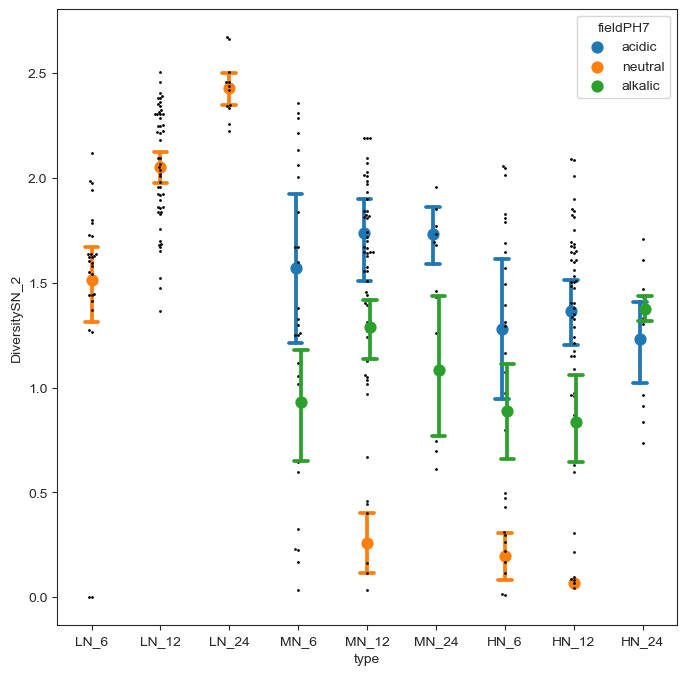

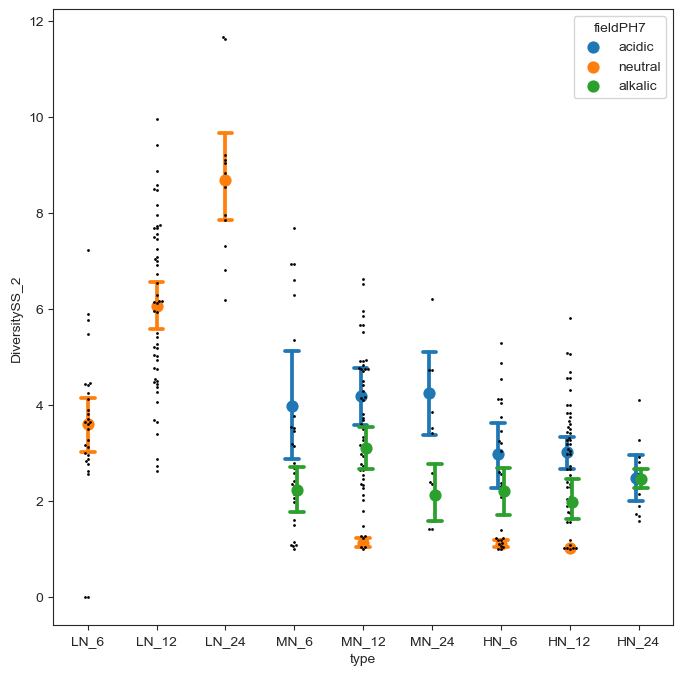

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 63.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 64.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

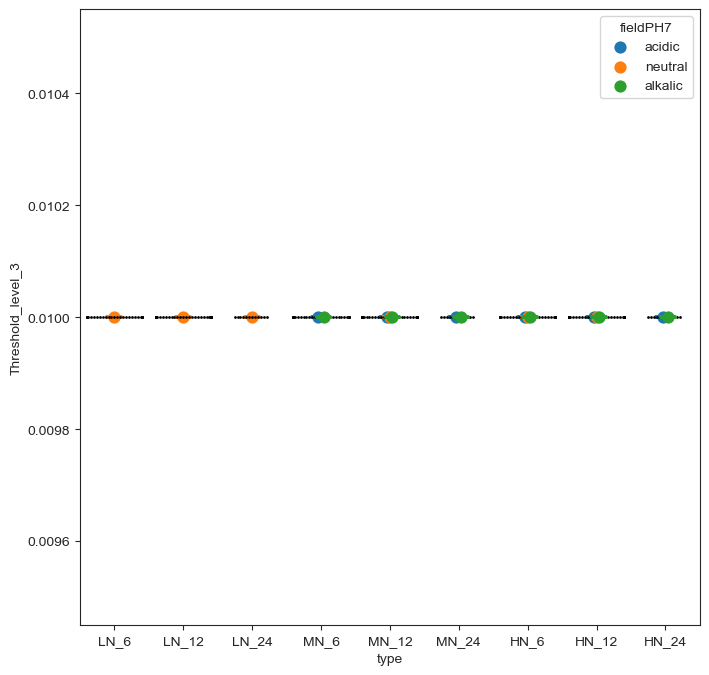

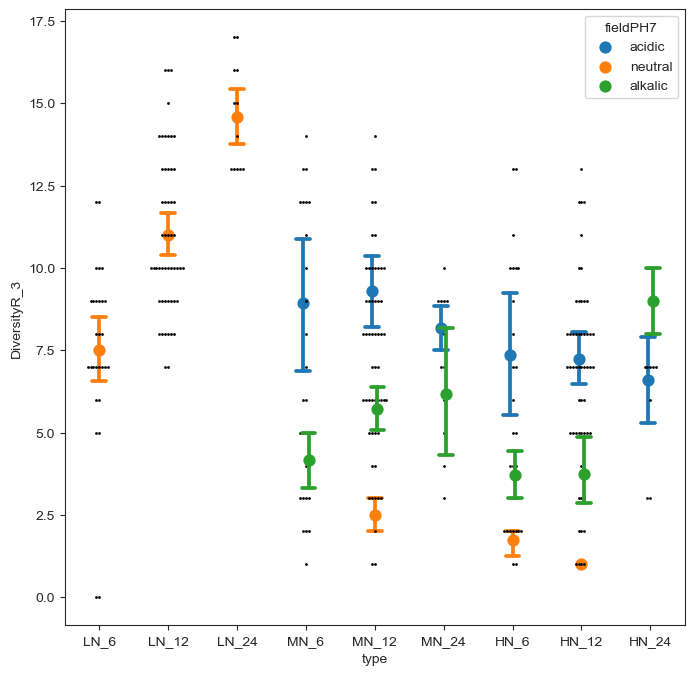

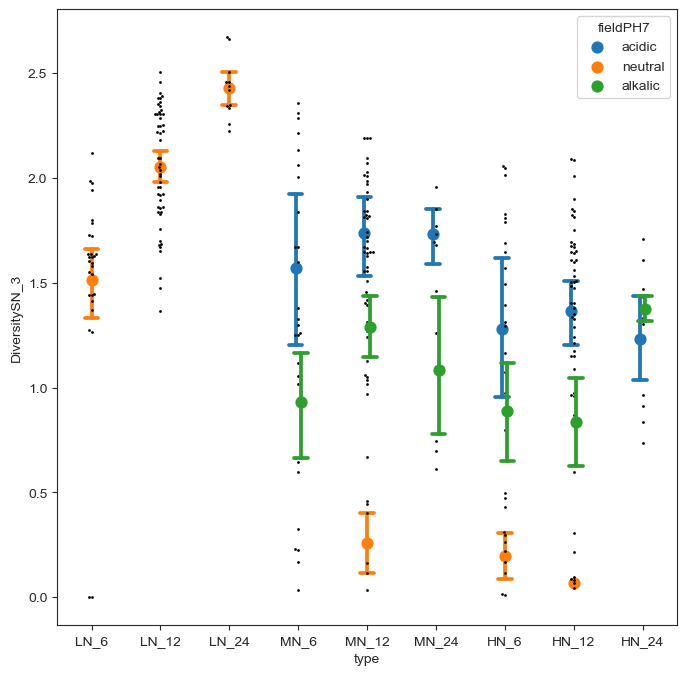

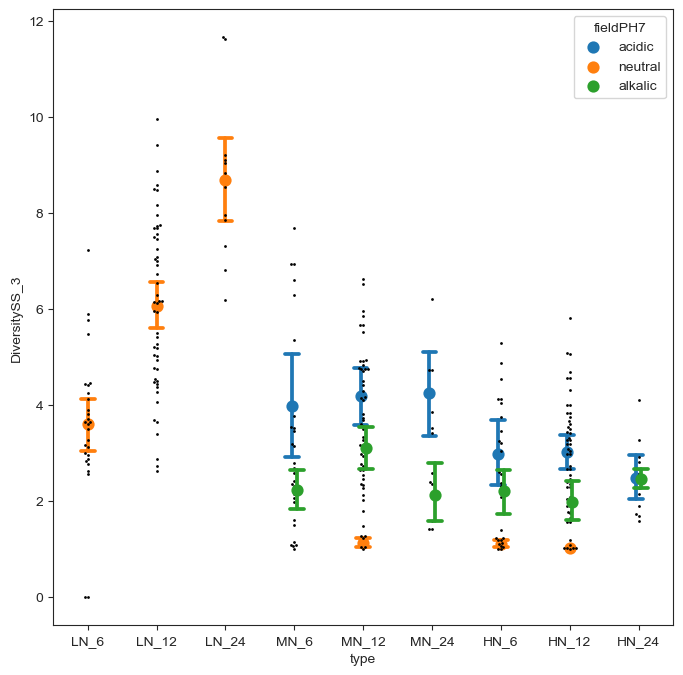

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 63.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 64.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

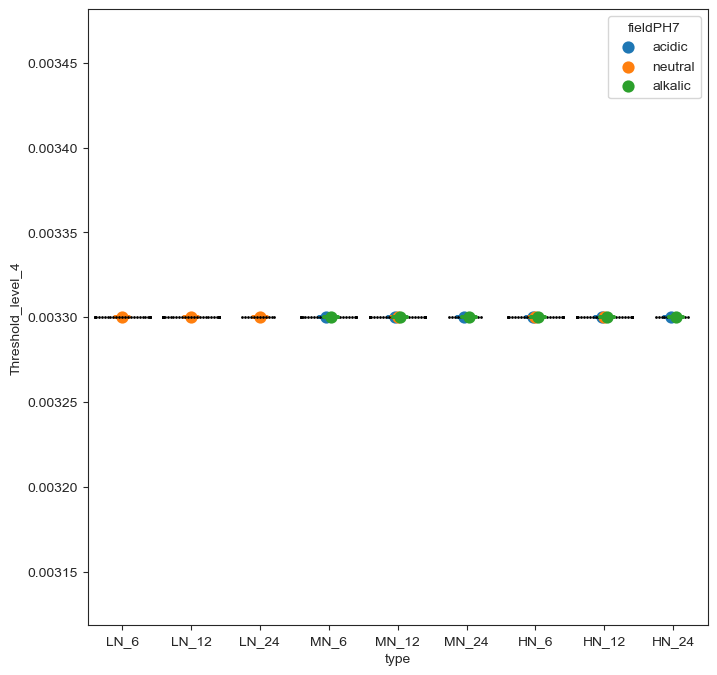

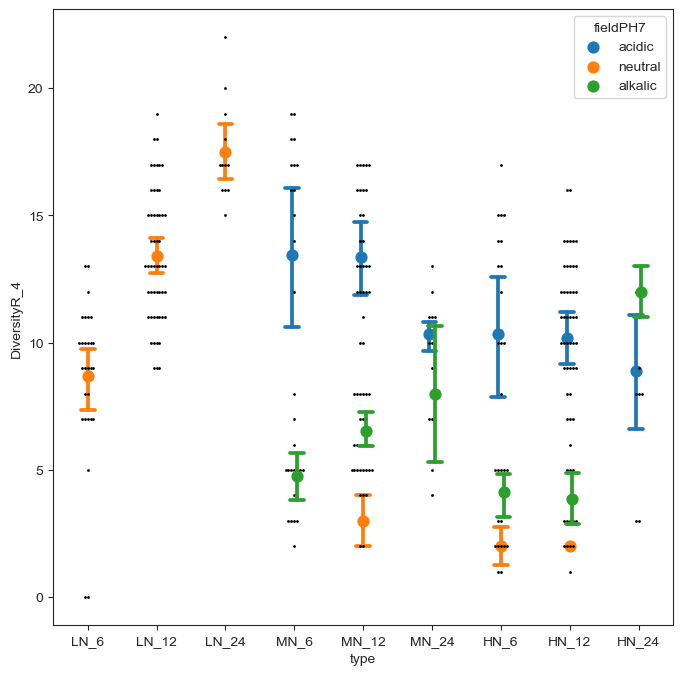

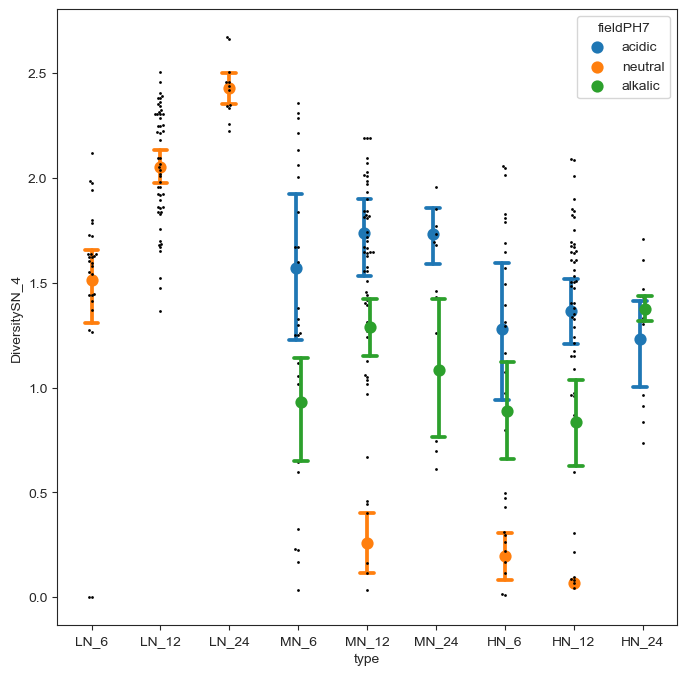

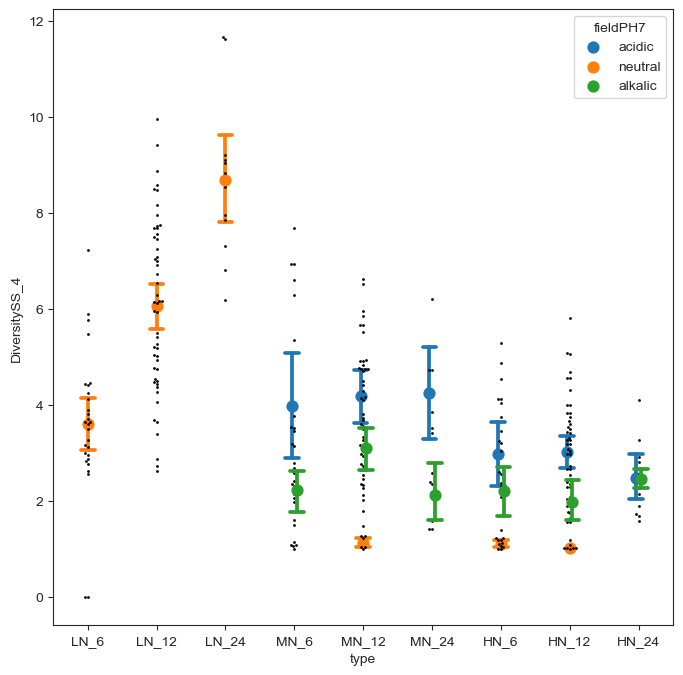

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 63.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 64.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

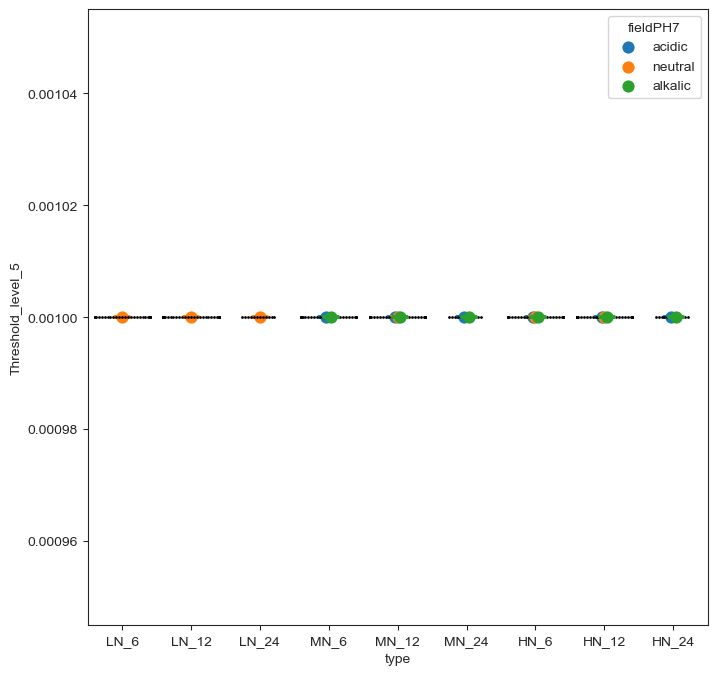

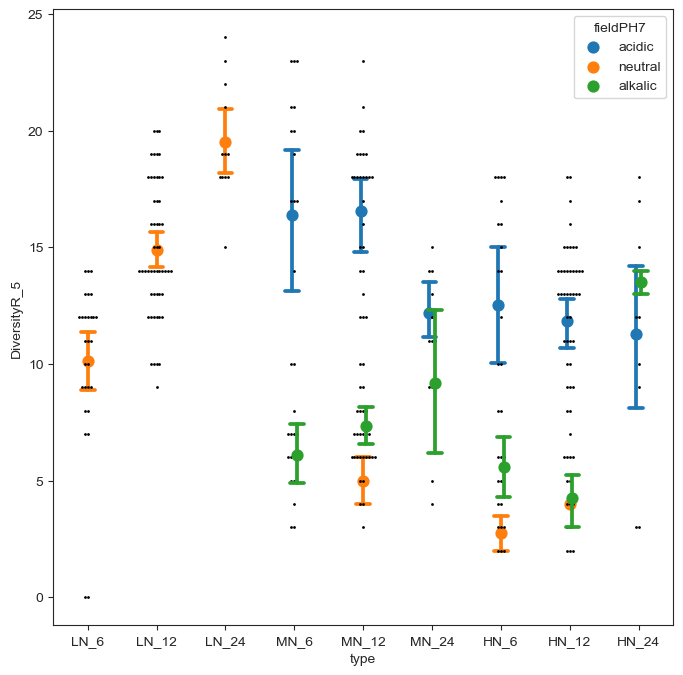

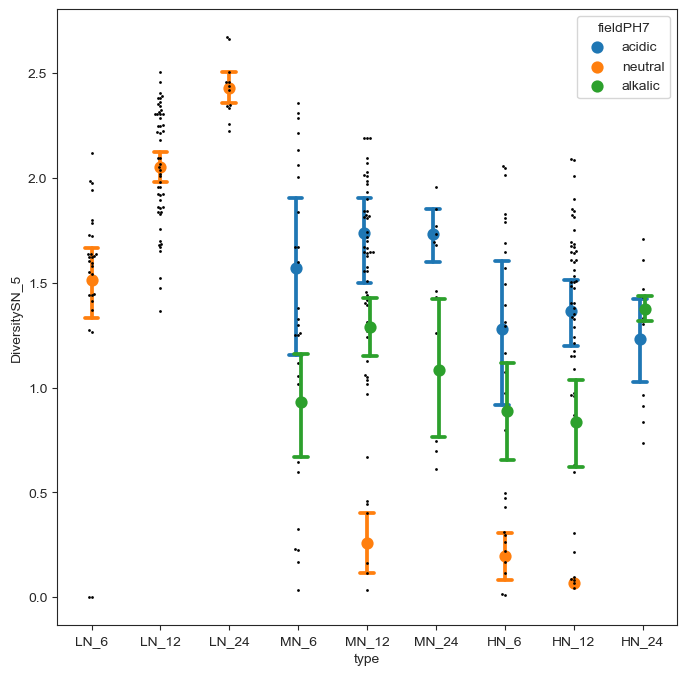

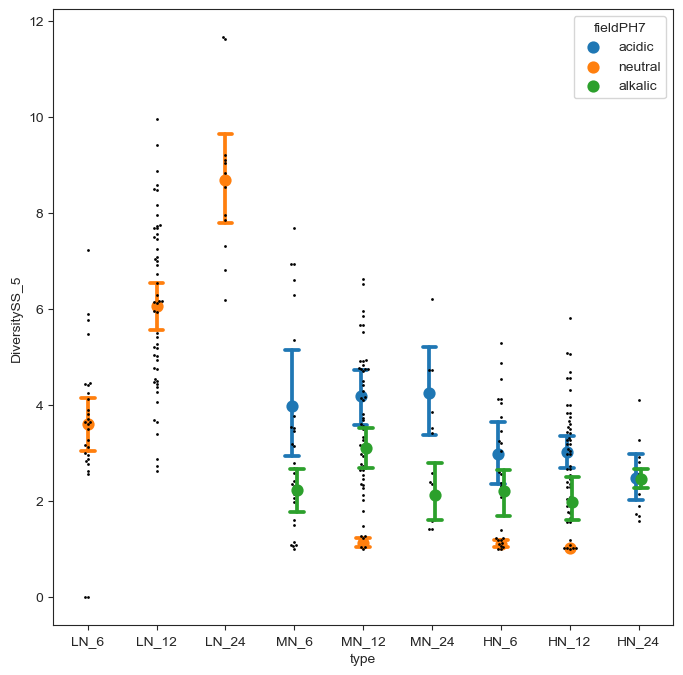

In [103]:
## Figure-CoalCommunities-PlotByPH-swarm&point
## Comm Figure 1. Plot every variable - swarm&point, For coalcommunities

Variable2plot_list=['fieldOD7', 'fieldGC1', 'fieldGC2', 'fieldGC3', 'Threshold_level_1', 'DiversityR_1', 'DiversitySN_1', 'DiversitySS_1',
       'Threshold_level_2', 'DiversityR_2', 'DiversitySN_2', 'DiversitySS_2',
       'Threshold_level_3', 'DiversityR_3', 'DiversitySN_3', 'DiversitySS_3',
       'Threshold_level_4', 'DiversityR_4', 'DiversitySN_4', 'DiversitySS_4',
       'Threshold_level_5', 'DiversityR_5', 'DiversitySN_5', 'DiversitySS_5']

HueVariable='fieldPH7'
hue_order = ['acidic','neutral','alkalic']
def pHcriteria(pH_list):
    O=1*(pH_list>6)+1*(pH_list>8)
    word_list=['acidic','neutral','alkalic']
    O=[word_list[x] for x in O]
    return O
    
for Variable2plot in Variable2plot_list:
    data_list = []
    type_list = []
    df=pd.DataFrame()
    Name2show = Variable2plot
    fig=figure(num=None, figsize=(8, 8), dpi=100, facecolor='w', edgecolor='k')
    for j in range(len(mediums)):
        for i in  range(len(species_pools)):
            M = mediums[j]
            S = species_pools[i]
            type_name = M + "_" + str(S)
            IDX_list = Syn_Coal_IDX[type_name]
            data = getCommunities(Communities_data,IDX_list)
            hues = data[HueVariable]
            hues = pHcriteria(hues)
            data = data[Variable2plot]
            #data_list.extend(data)
            #type_list.extend([type_name] * len(data))
            df_temp=pd.DataFrame({'data':data, 'type':[type_name] * len(data), HueVariable :hues})
            df=pd.concat([df,df_temp])


    sns.swarmplot(x='type',y='data', data=df,color='black',size=2)
    sns.pointplot(x='type',y='data', data=df, dodge=True,  hue=HueVariable,hue_order=hue_order, join=False,  capsize=.2)
    plt.ylabel(Name2show)
    
    #plt.xlabel(("Coalescence Type, Medium, and Number of Species"))
    plt.show()
    fig.savefig("Figures/Comm_Analysis_coalcommunities_byPH_swarmpoint"+Variable2plot+".png", bbox_inches='tight')
    plt.close(fig)
    
    


#AllAbudnaces=getAbundance(Metadata['SampleIDX'])


<Figure size 800x800 with 0 Axes>

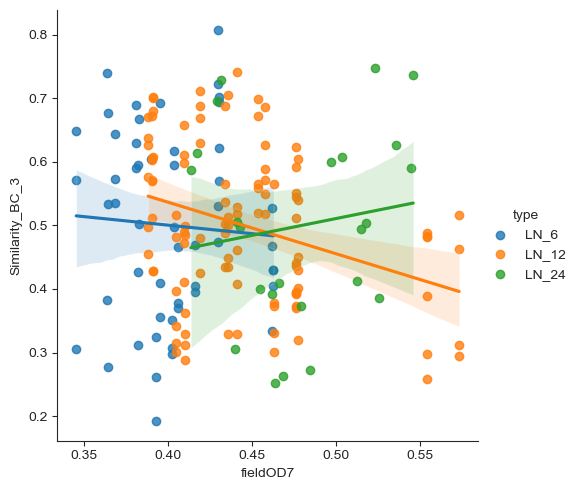

<Figure size 800x800 with 0 Axes>

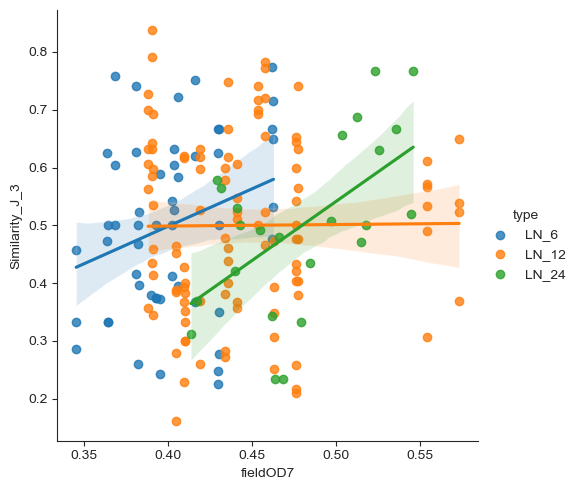

<Figure size 800x800 with 0 Axes>

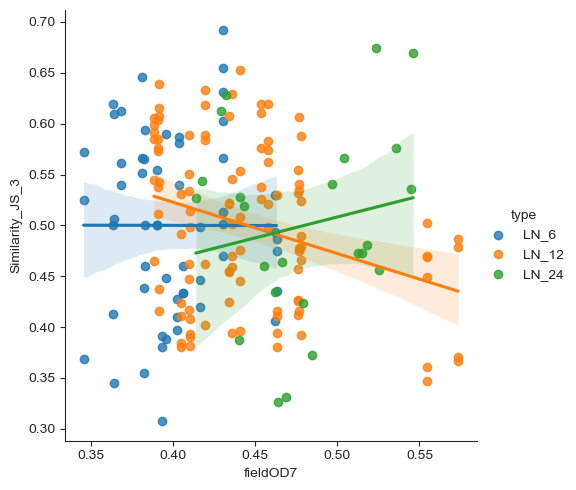

<Figure size 800x800 with 0 Axes>

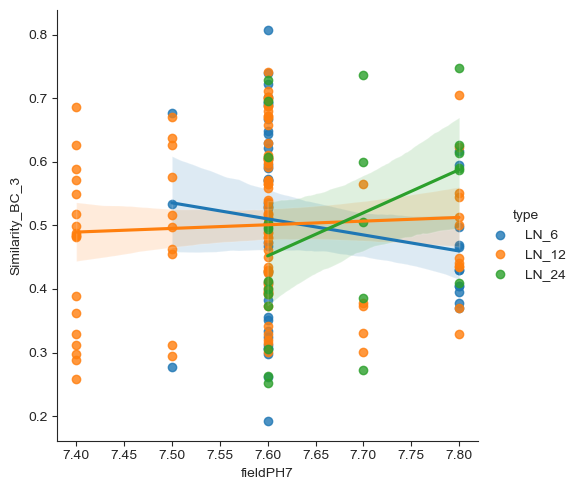

<Figure size 800x800 with 0 Axes>

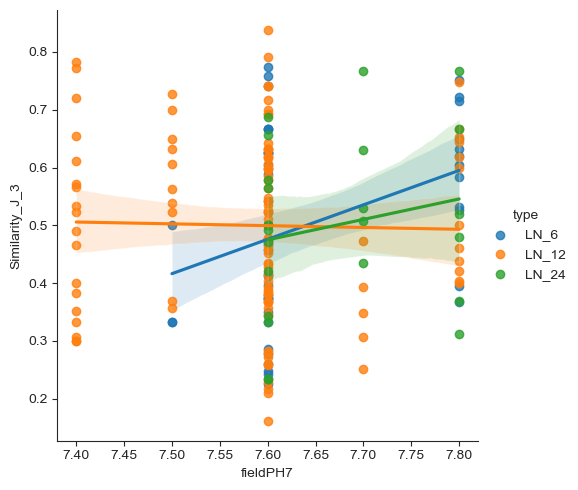

<Figure size 800x800 with 0 Axes>

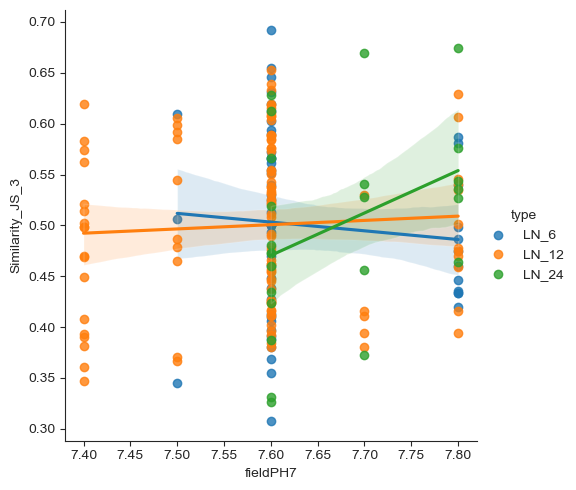

<Figure size 800x800 with 0 Axes>

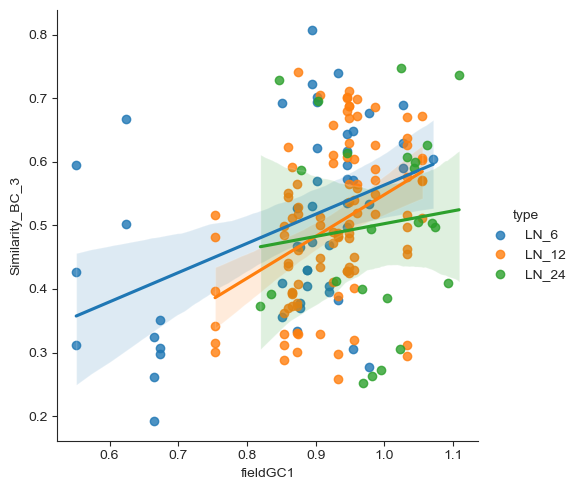

<Figure size 800x800 with 0 Axes>

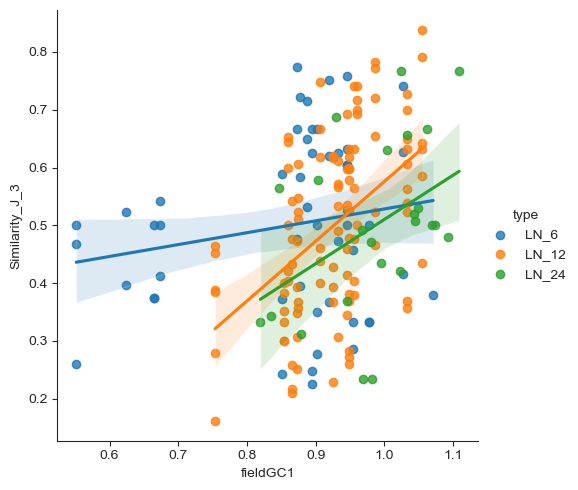

<Figure size 800x800 with 0 Axes>

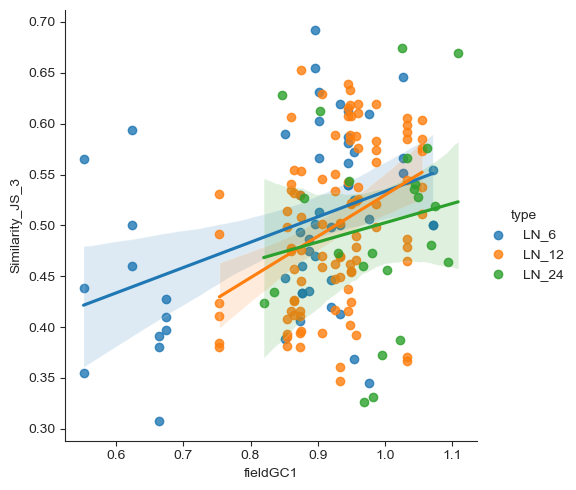

<Figure size 800x800 with 0 Axes>

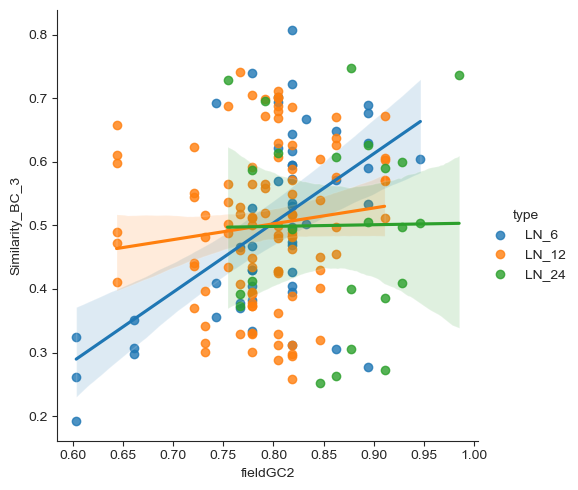

<Figure size 800x800 with 0 Axes>

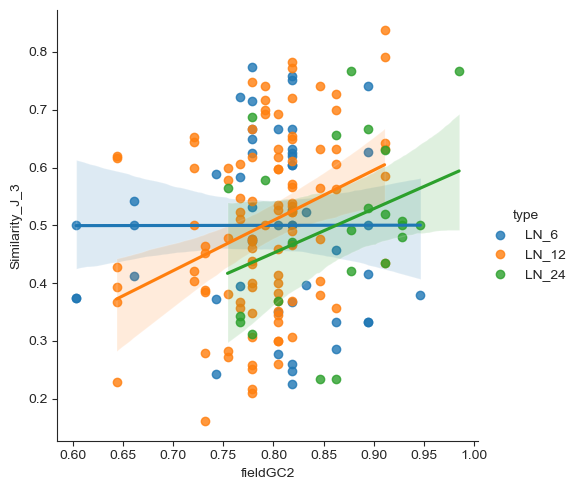

<Figure size 800x800 with 0 Axes>

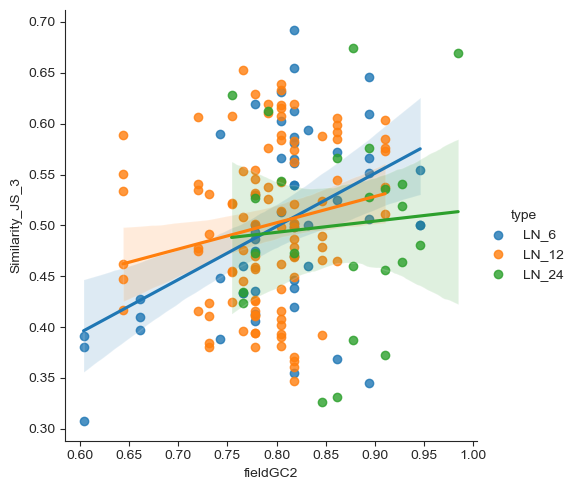

<Figure size 800x800 with 0 Axes>

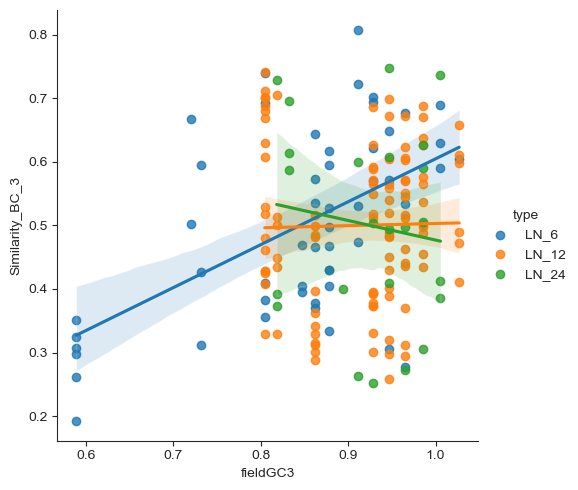

<Figure size 800x800 with 0 Axes>

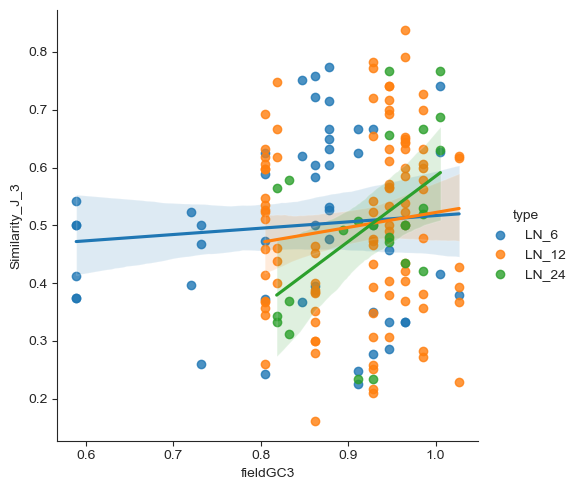

<Figure size 800x800 with 0 Axes>

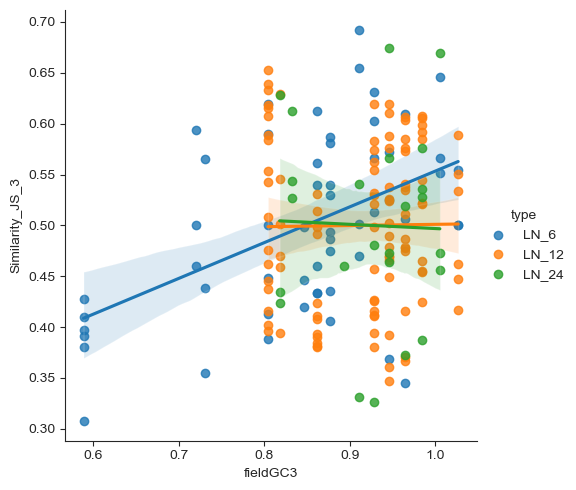

<Figure size 800x800 with 0 Axes>

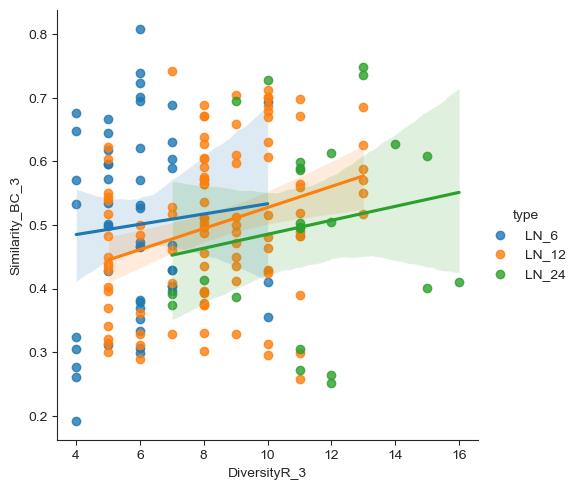

<Figure size 800x800 with 0 Axes>

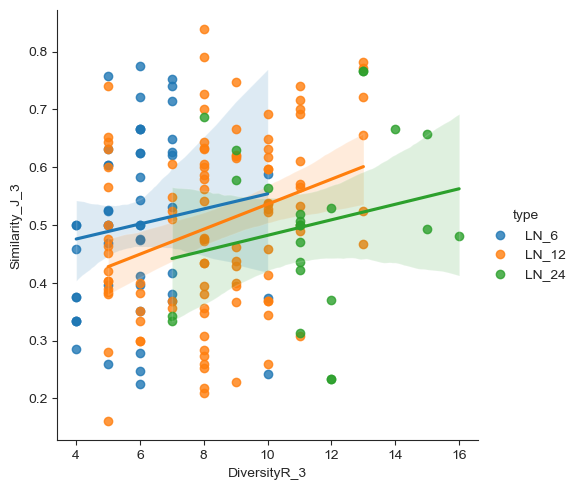

<Figure size 800x800 with 0 Axes>

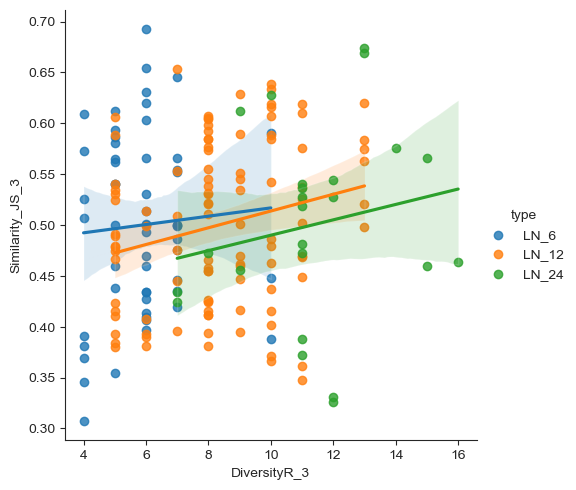

<Figure size 800x800 with 0 Axes>

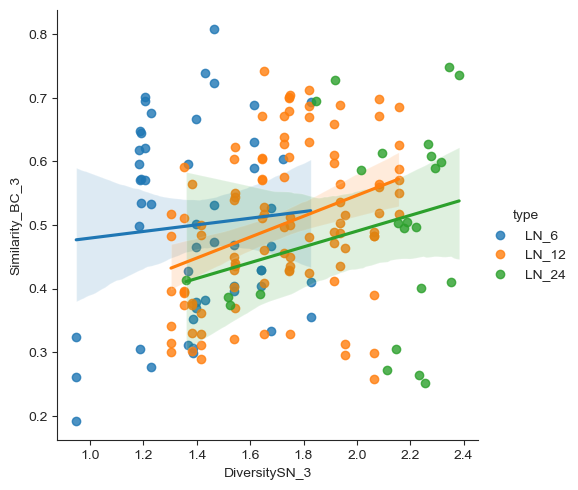

<Figure size 800x800 with 0 Axes>

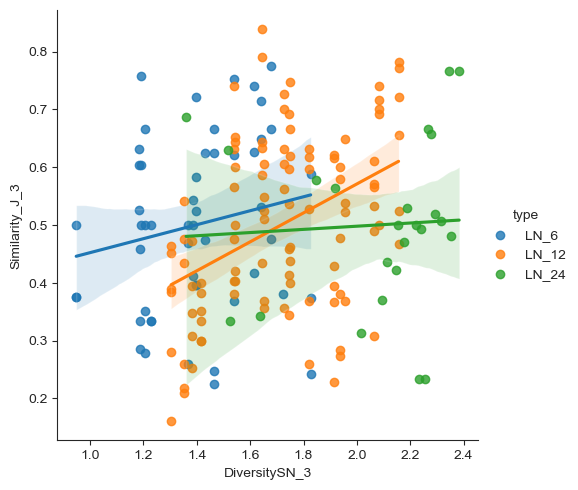

<Figure size 800x800 with 0 Axes>

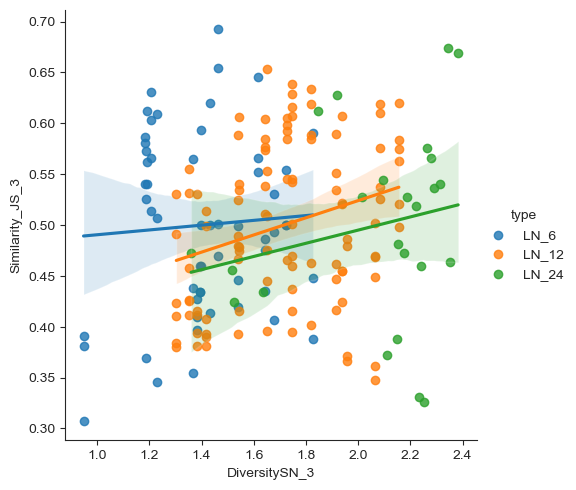

<Figure size 800x800 with 0 Axes>

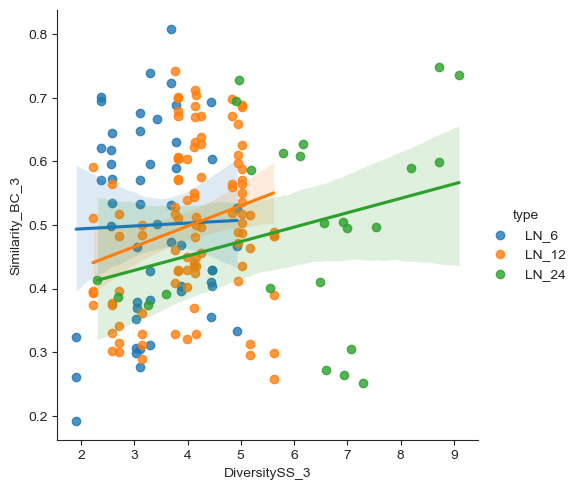

<Figure size 800x800 with 0 Axes>

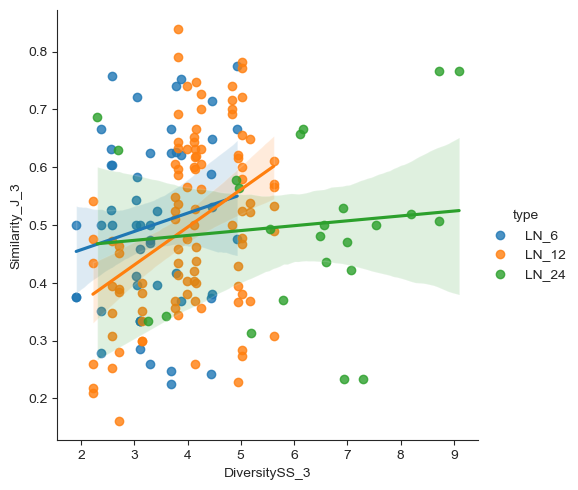

<Figure size 800x800 with 0 Axes>

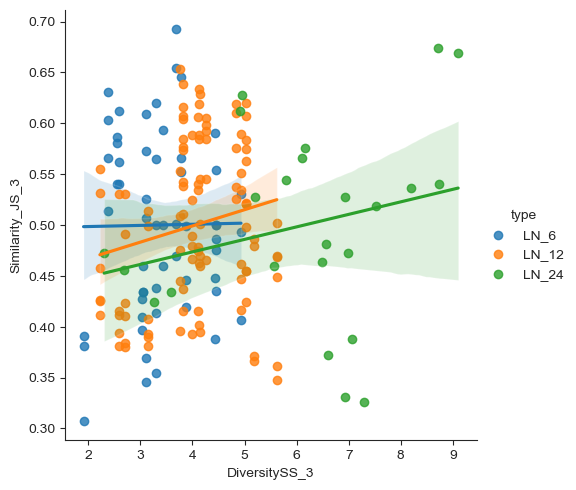

In [206]:
## Figure-SimilarityWithsubCommunitiesProperties-PlotByPH-swarm&point

Variable2plot_x_list=['fieldOD7','fieldPH7','fieldGC1','fieldGC2','fieldGC3','DiversityR_3','DiversitySN_3','DiversitySS_3']
Variable2plot_y_list=['_BC_3','_J_3','_JS_3']
S.columns.tolist()

for Variable2plot_x in Variable2plot_x_list:
    for Variable2plot_y in Variable2plot_y_list:       
        data_list = []
        type_list = []
        df=pd.DataFrame()
        Name2show = Variable2plot
        fig=figure(num=None, figsize=(8, 8), dpi=100, facecolor='w', edgecolor='k')
        for j in [0]: #range(len(mediums)):
            for i in range(len(species_pools)):
                M = mediums[j]
                S = species_pools[i]
                type_name = M + "_" + str(S)
                IDX_list = Syn_Coal_IDX[type_name]
                coal=getCoalescence(Coalescence_data,IDX_list)
                sub1=coal['SampleIDX_Sub1']
                sub2=coal['SampleIDX_Sub2']
                S=getCommunities(Communities_data,IDX_list)
                S1=getCommunities(Communities_data,sub1)
                S2=getCommunities(Communities_data,sub2)
                
                x = pd.concat((S1[Variable2plot_x],S2[Variable2plot_x]))
                y = pd.concat((coal['SimilarityTo1'+Variable2plot_y],coal['SimilarityTo2'+Variable2plot_y]))

                #data_list.extend(data)
                #type_list.extend([type_name] * len(data))
                df_temp=pd.DataFrame({'x':x.values, 'y':y.values, 'type':[type_name] * len(x)})
                df=pd.concat([df,df_temp])

        #sns.scatterplot(x='x',y='y', data=df,hue='type', size=3)
        sns.lmplot(x='x',y='y',hue='type', data=df);
        #sns.swarmplot(x='type',y='data', data=df,color='black',size=2)
        #sns.pointplot(x='type',y='data', data=df, dodge=True,  hue=HueVariable,hue_order=hue_order, join=False,  capsize=.2)
        plt.xlabel(Variable2plot_x)
        plt.ylabel('Similarity'+Variable2plot_y)
        plt.show()
        fig.savefig("Figures/SimilaritybysubCommunitiesProperties_Analysis_"+Variable2plot_x+"_Similarity"+Variable2plot_y+".png", bbox_inches='tight')
        plt.close(fig)
   

In [ ]:
Communities_data.columns

## Comm Figure 1. Plot every variable - swarm&point, For coalcommunities

Variable2plot_list=['fieldOD7', 'fieldGC1', 'fieldGC2', 'fieldGC3', 'Threshold_level_1', 'DiversityR_1', 'DiversitySN_1', 'DiversitySS_1',
       'Threshold_level_2', 'DiversityR_2', 'DiversitySN_2', 'DiversitySS_2',
       'Threshold_level_3', 'DiversityR_3', 'DiversitySN_3', 'DiversitySS_3',
       'Threshold_level_4', 'DiversityR_4', 'DiversitySN_4', 'DiversitySS_4',
       'Threshold_level_5', 'DiversityR_5', 'DiversitySN_5', 'DiversitySS_5']

HueVariable='fieldPH7'
hue_order = ['acidic','neutral','alkalic']
def pHcriteria(pH_list):
    O=1*(pH_list>6)+1*(pH_list>8)
    word_list=['acidic','neutral','alkalic']
    O=[word_list[x] for x in O]
    return O
    
for Variable2plot in Variable2plot_list:
    data_list = []
    type_list = []
    df=pd.DataFrame()
    Name2show = Variable2plot
    fig=figure(num=None, figsize=(8, 8), dpi=100, facecolor='w', edgecolor='k')
    for j in range(len(mediums)):
        for i in  range(len(species_pools)):
            M = mediums[j]
            S = species_pools[i]
            type_name = M + "_" + str(S)
            IDX_list = Syn_Coal_IDX[type_name]
            data = getCommunities(Communities_data,IDX_list)
            hues = data[HueVariable]
            hues = pHcriteria(hues)
            data = data[Variable2plot]
            #data_list.extend(data)
            #type_list.extend([type_name] * len(data))
            df_temp=pd.DataFrame({'data':data, 'type':[type_name] * len(data), HueVariable :hues})
            df=pd.concat([df,df_temp])


    sns.swarmplot(x='type',y='data', data=df,color='black',size=2)
    sns.pointplot(x='type',y='data', data=df, dodge=True,  hue=HueVariable,hue_order=hue_order, join=False,  capsize=.2)
    plt.ylabel(Name2show)d
    
    #plt.xlabel(("Coalescence Type, Medium, and Number of Species"))
    plt.show()
    fig.savefig("Figures/Comm_Analysis_coalcommunities_byPH_swarmpoint"+Variable2plot+".png", bbox_inches='tight')
    plt.close(fig)
    
    


#AllAbudnaces=getAbundance(Metadata['SampleIDX'])


/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 63.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 64.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

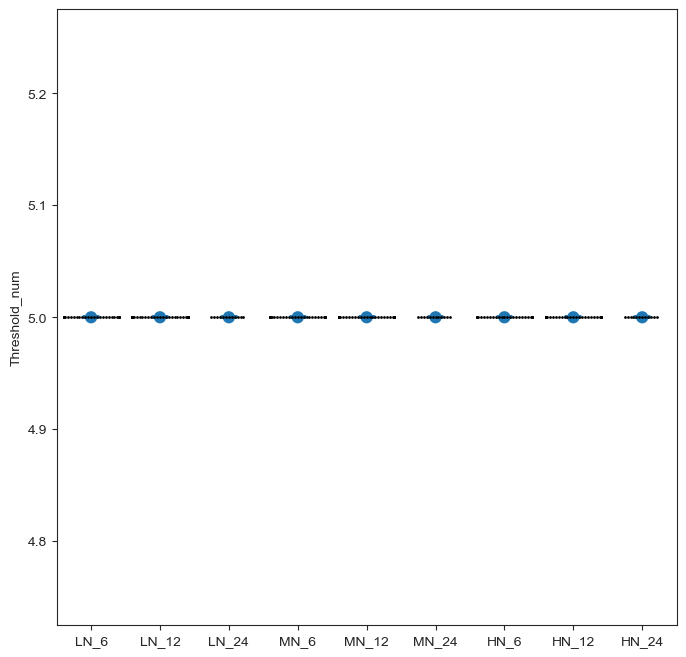

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 63.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 64.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

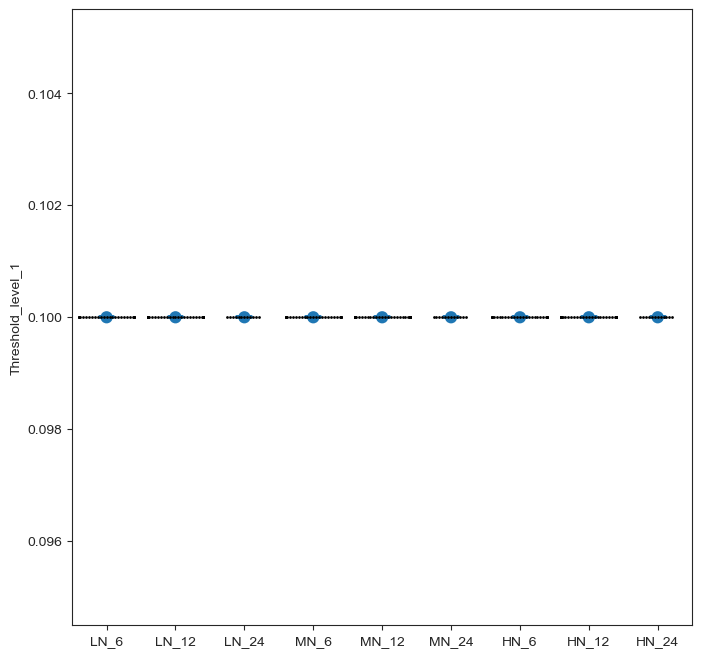

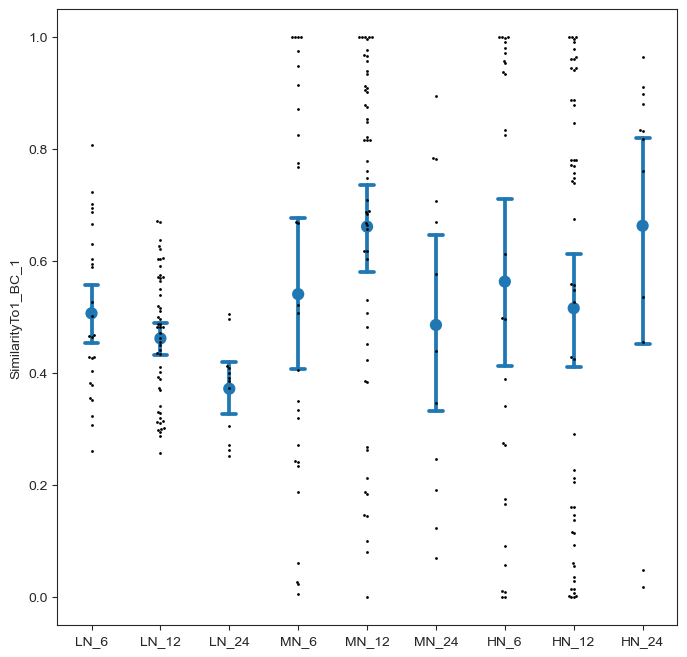

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 8.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 8.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


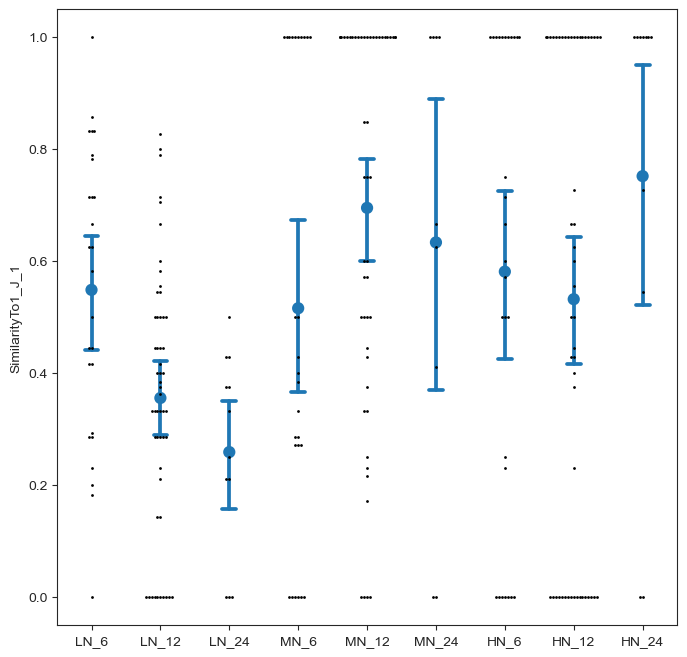

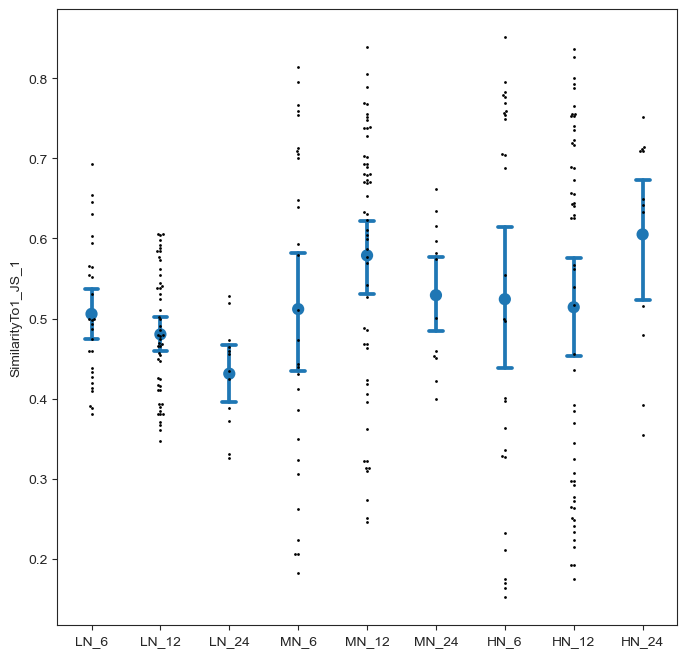

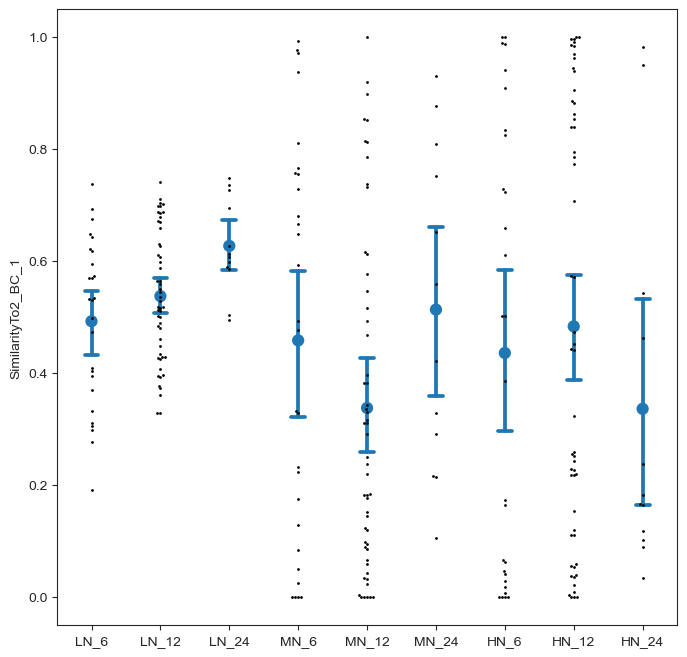

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 8.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 8.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


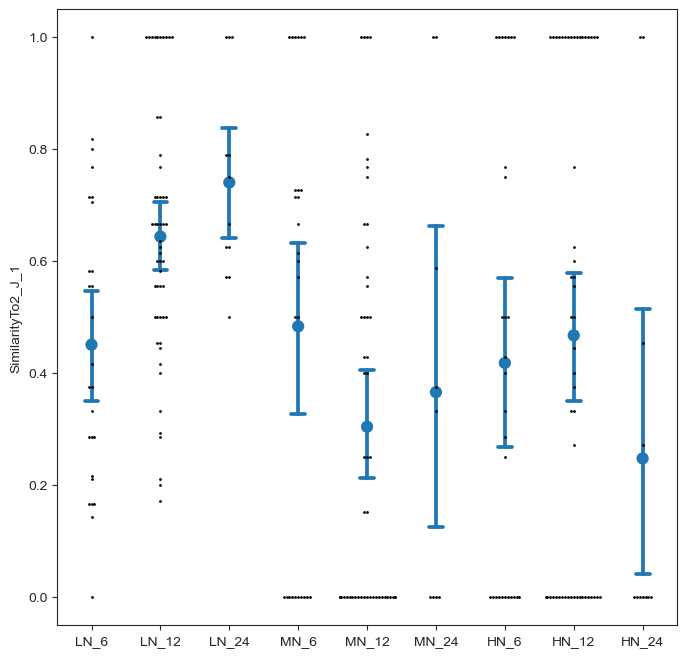

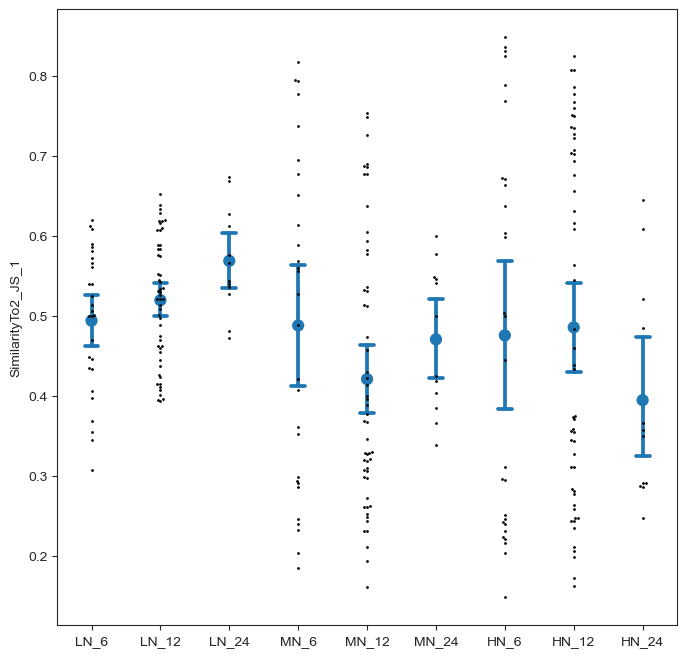

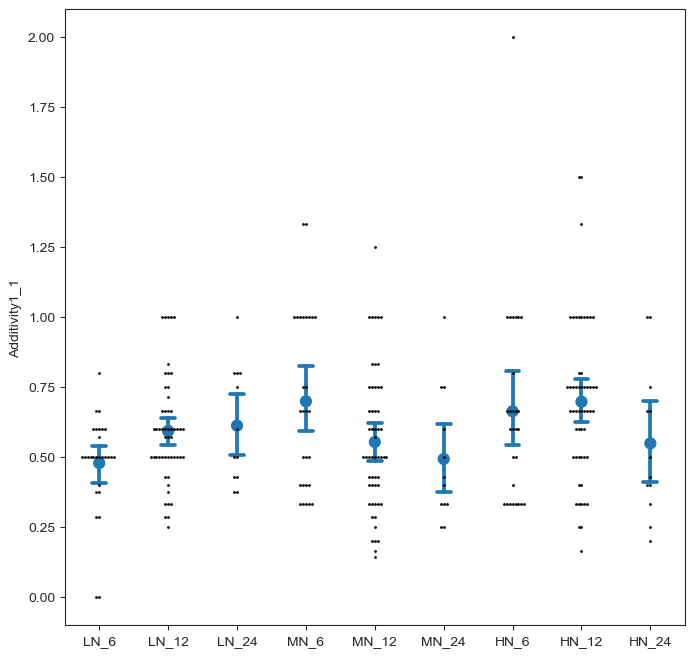

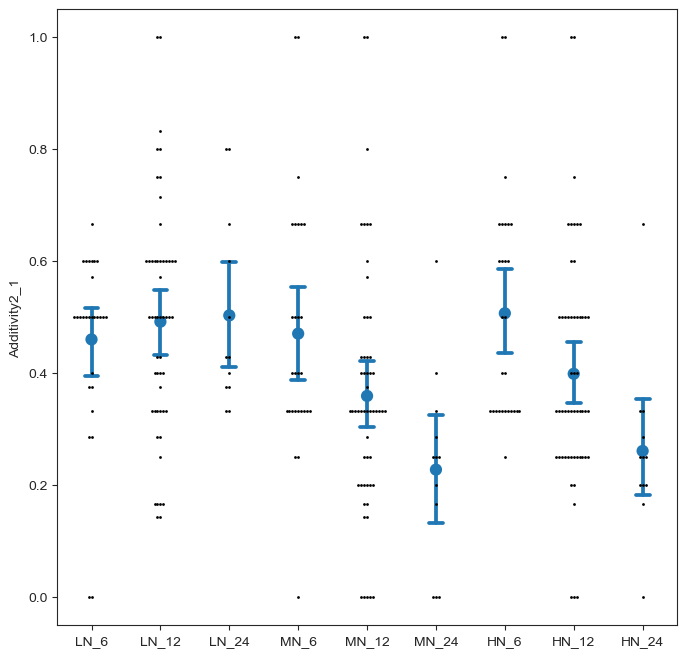

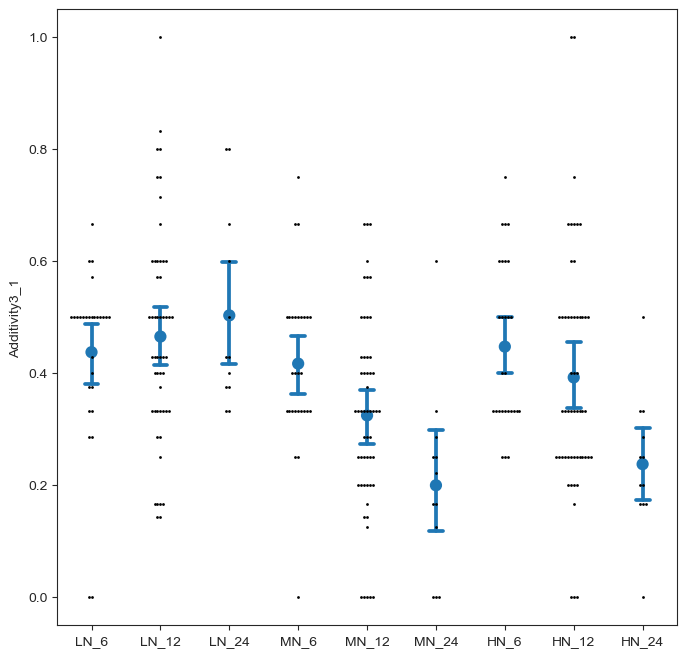

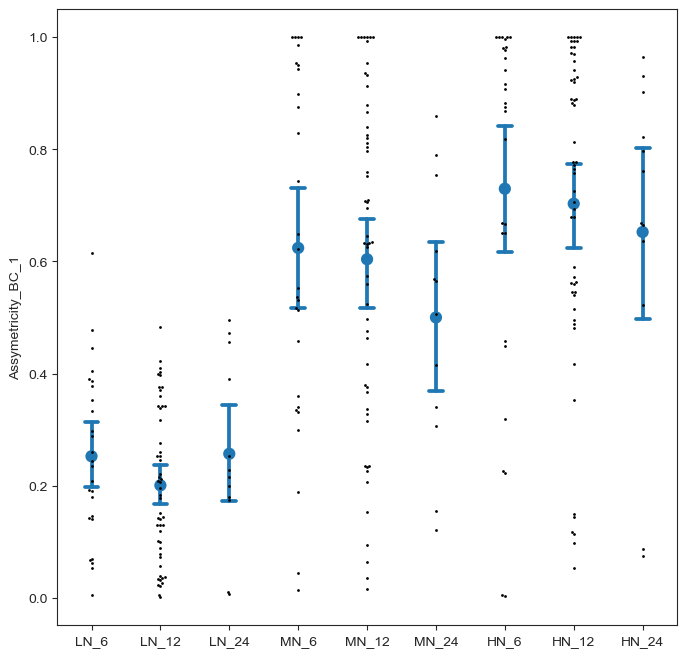

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 16.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 35.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 16.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 35.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


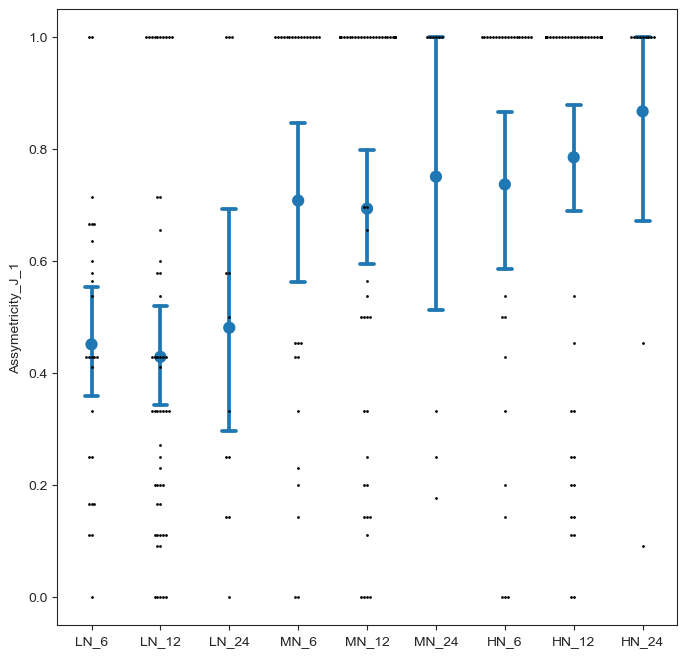

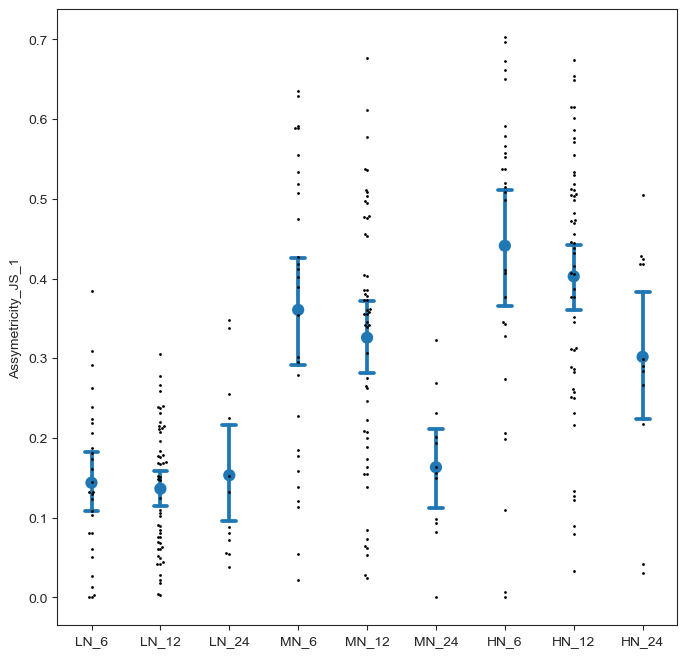

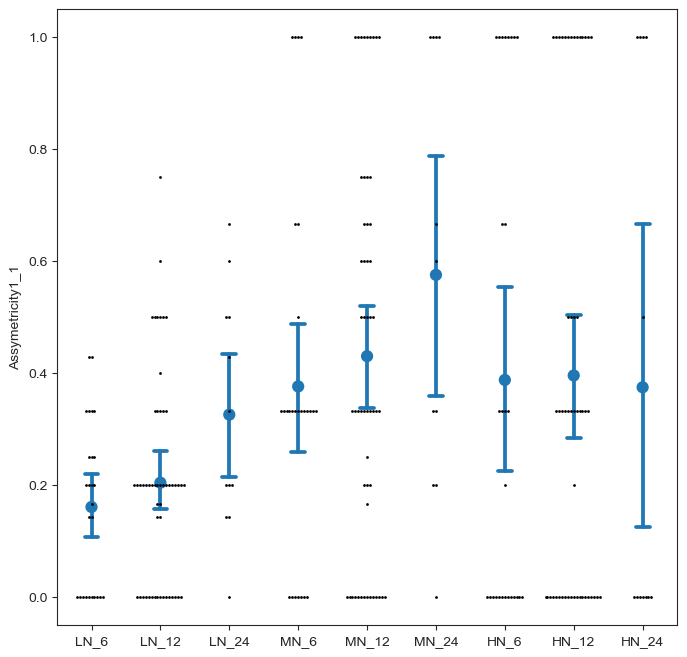

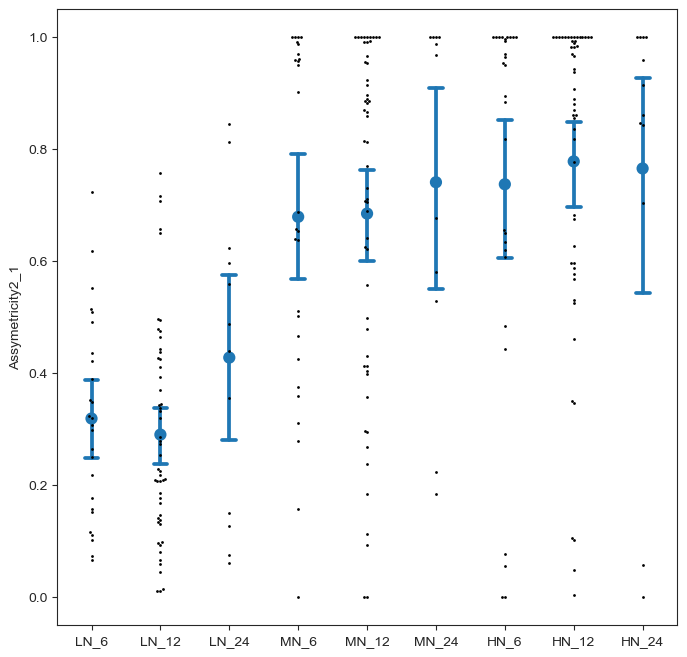

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 21.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 28.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 5.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 21.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

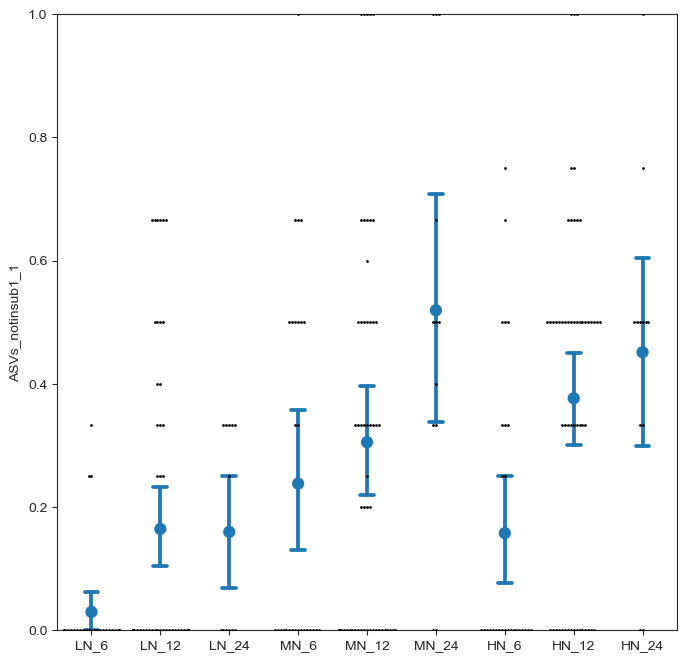

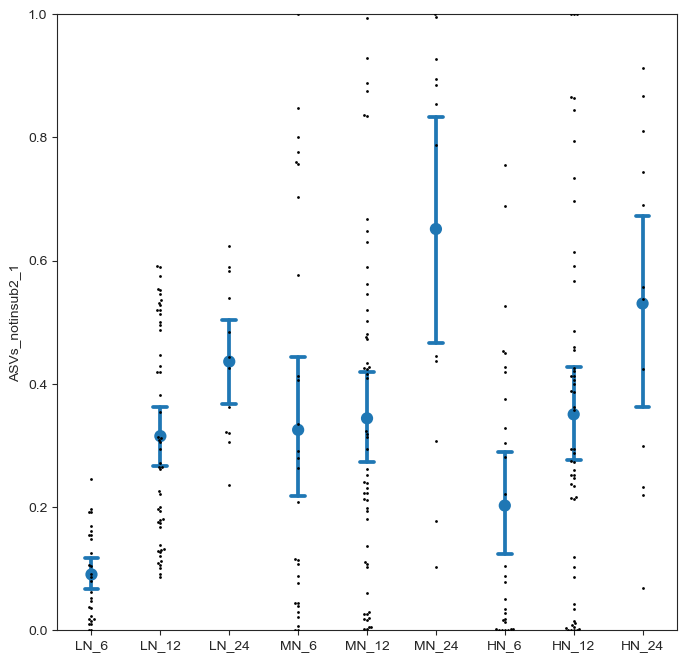

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 10.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 14.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 51.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

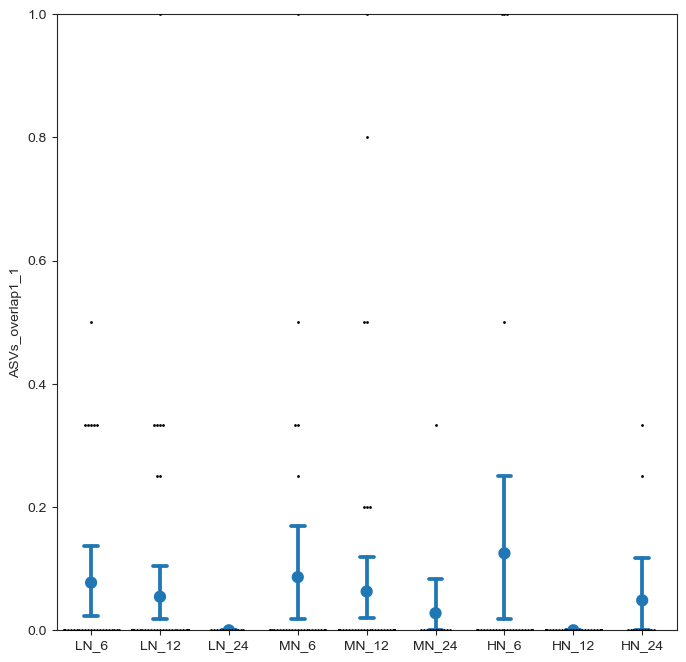

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 42.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 10.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 40.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

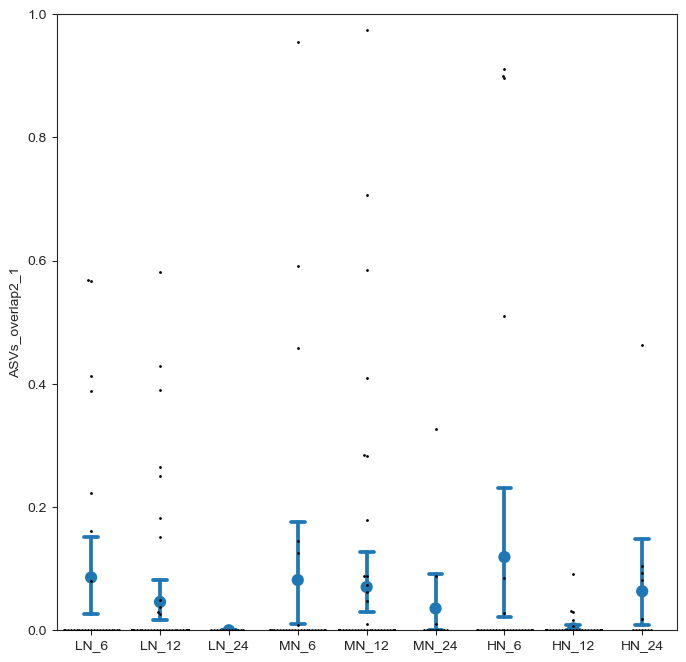

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 63.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 64.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

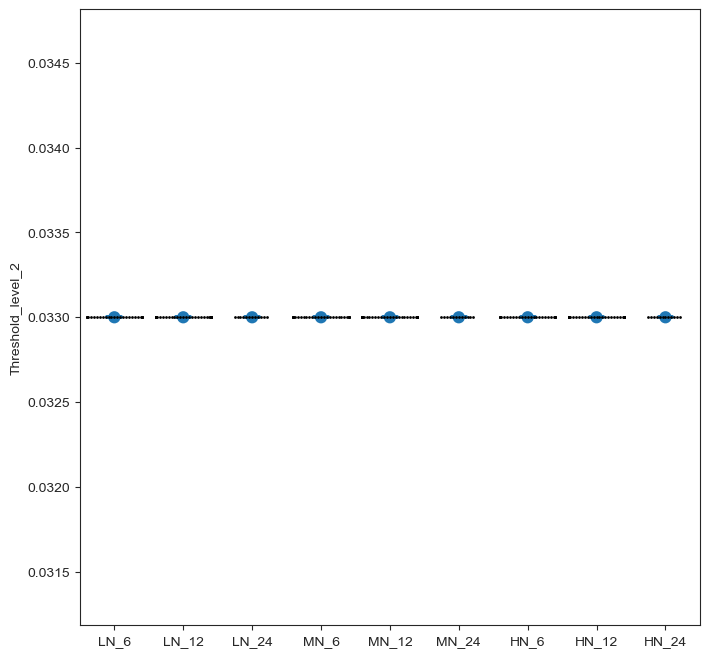

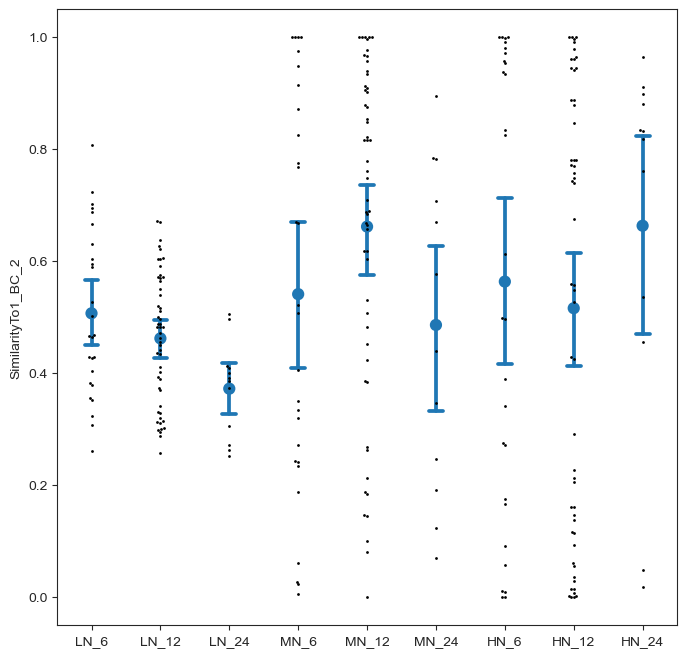

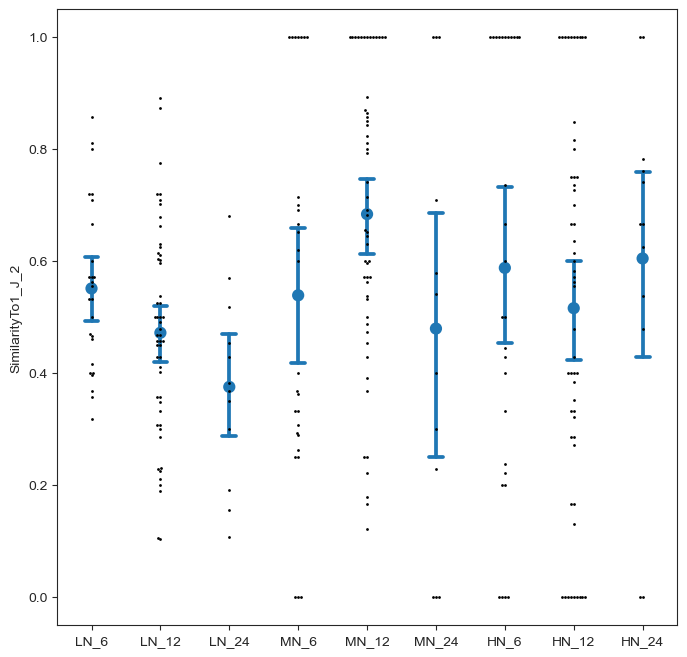

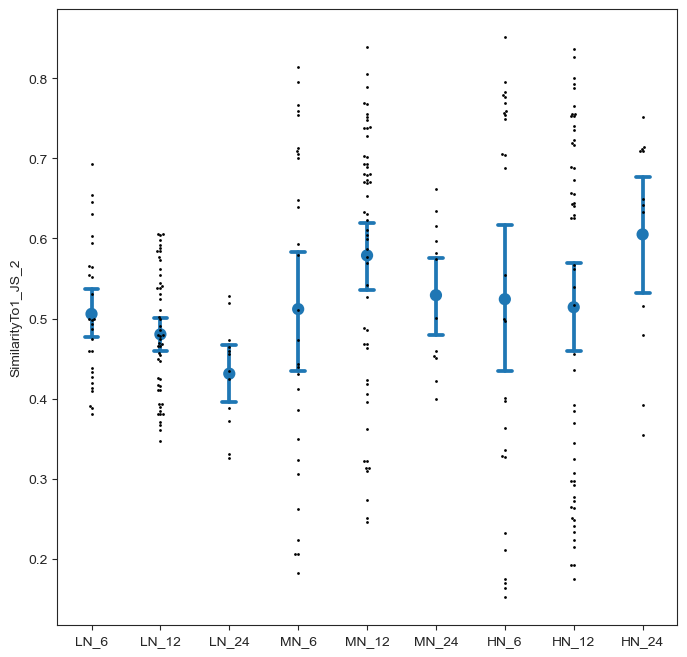

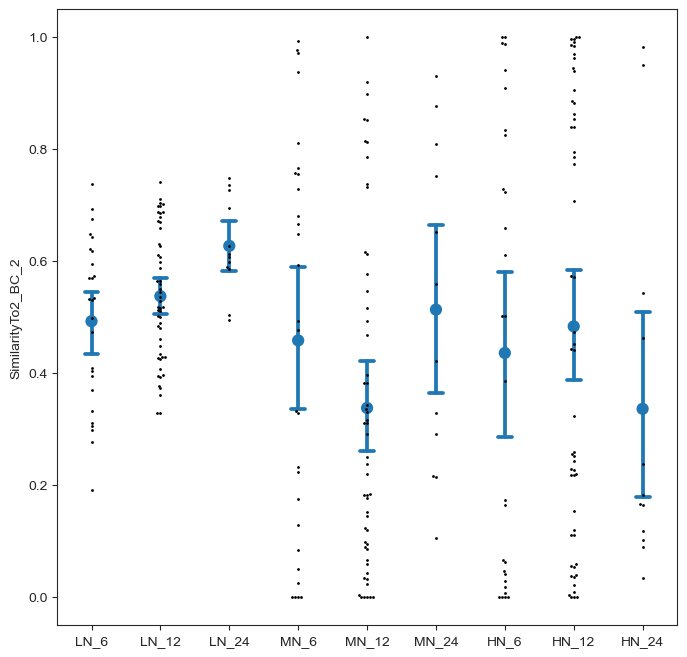

...

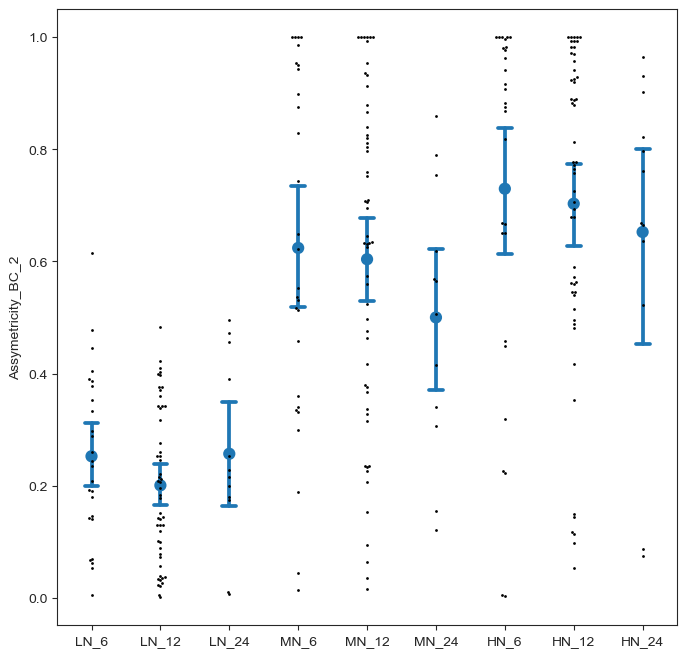

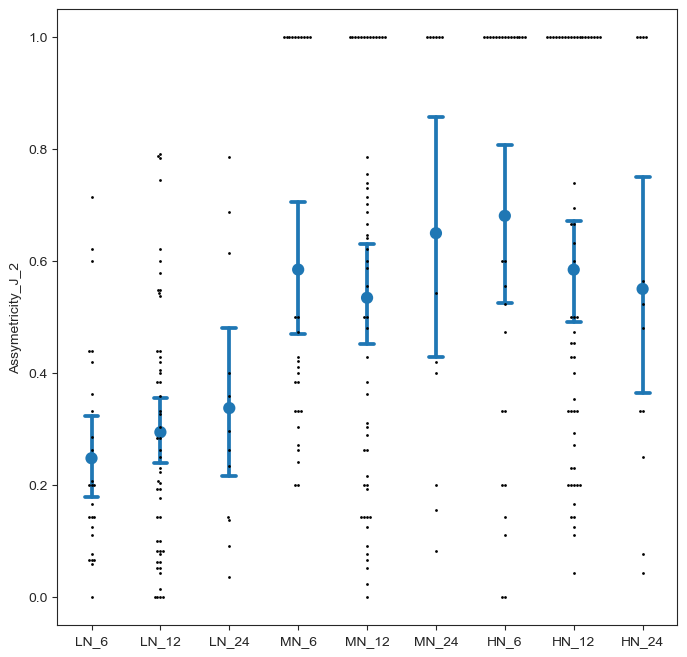

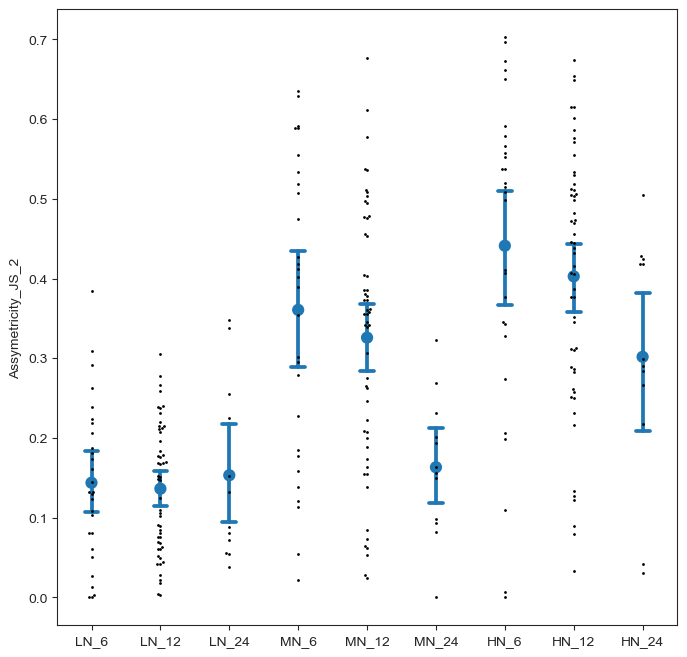

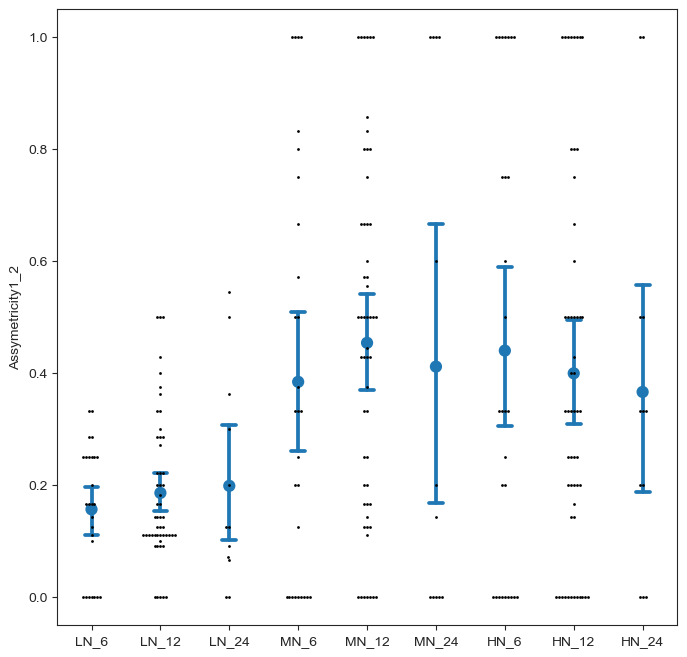

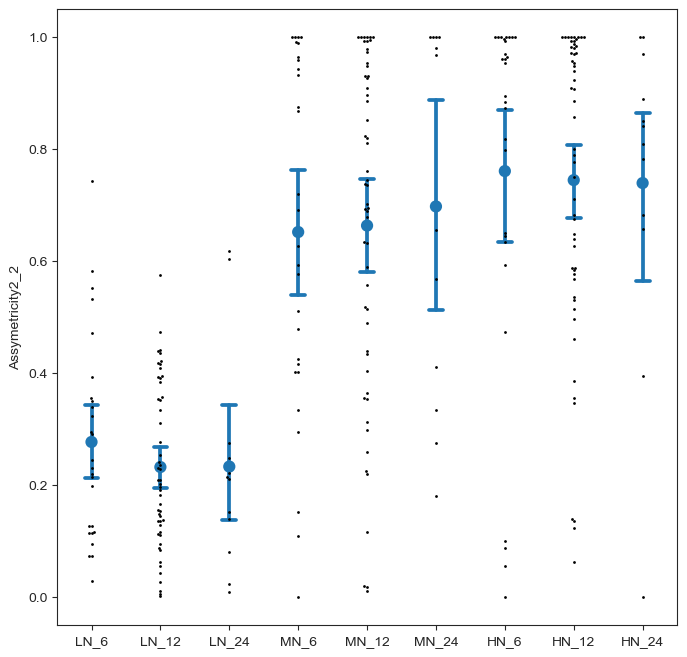

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 28.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 7.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 18.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 28.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

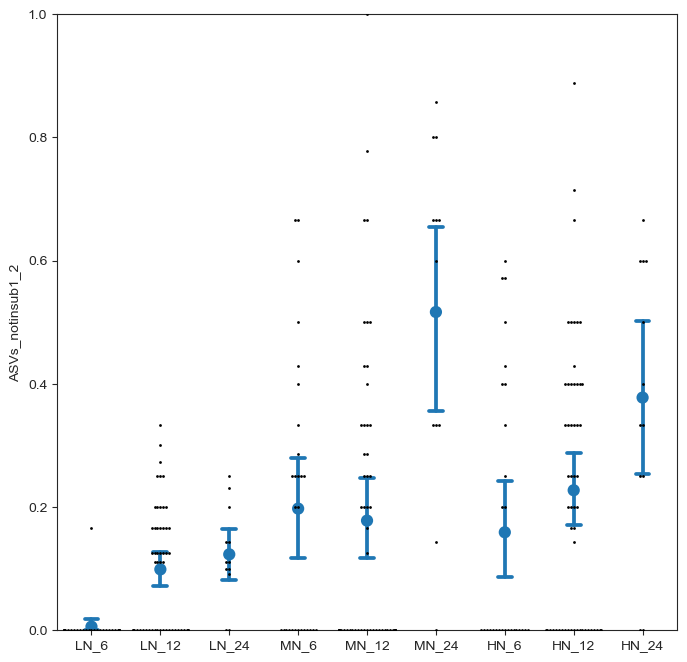

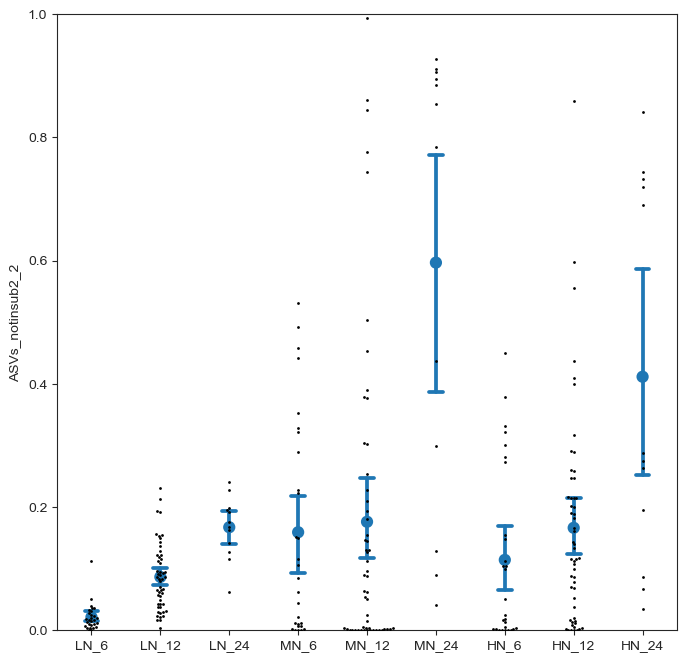

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 25.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 13.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 10.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

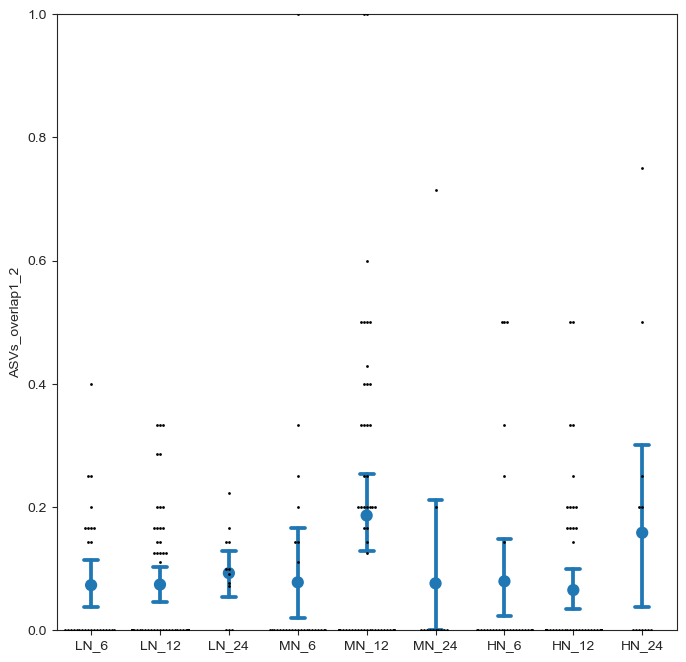

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 13.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 24.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 13.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

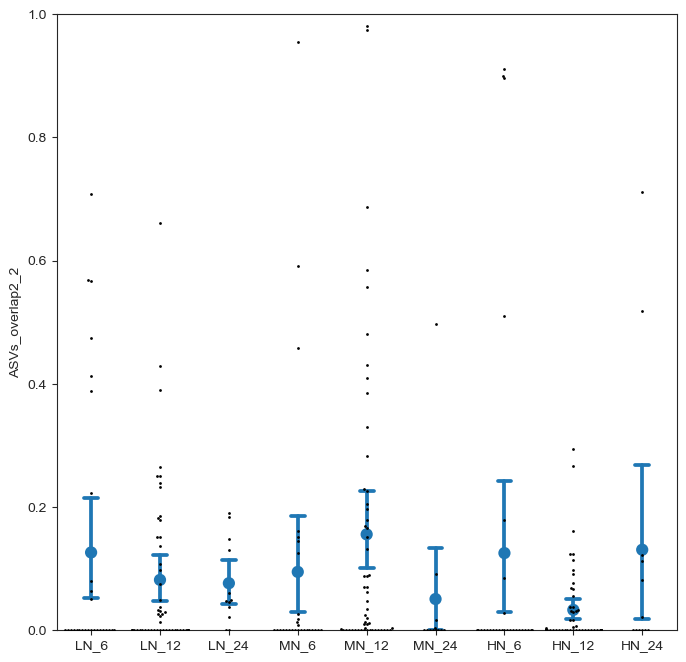

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 63.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 64.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

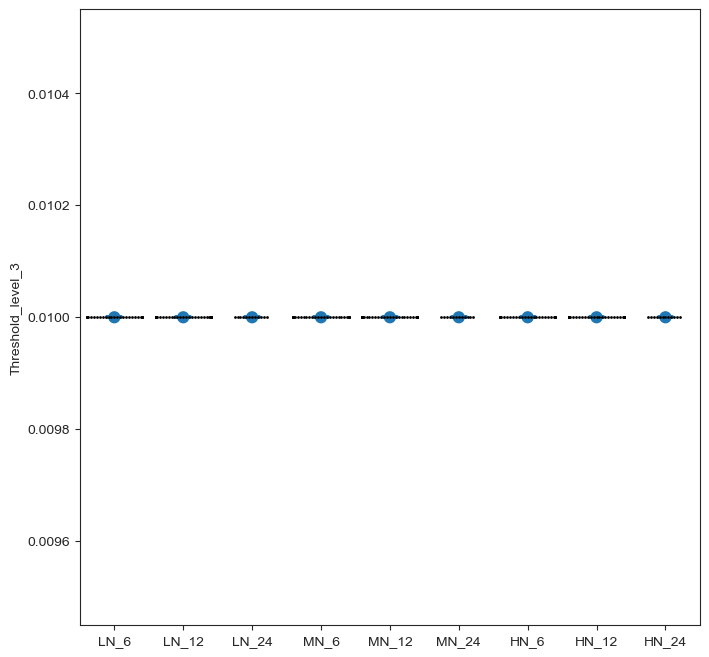

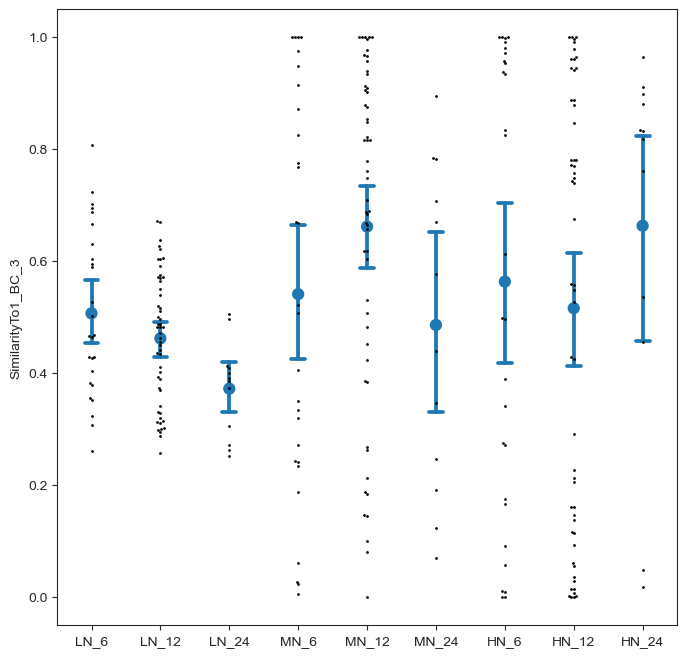

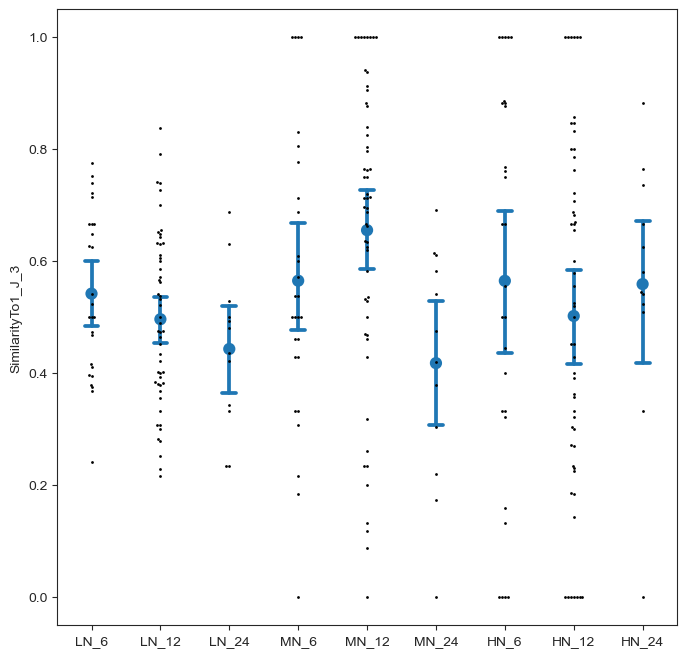

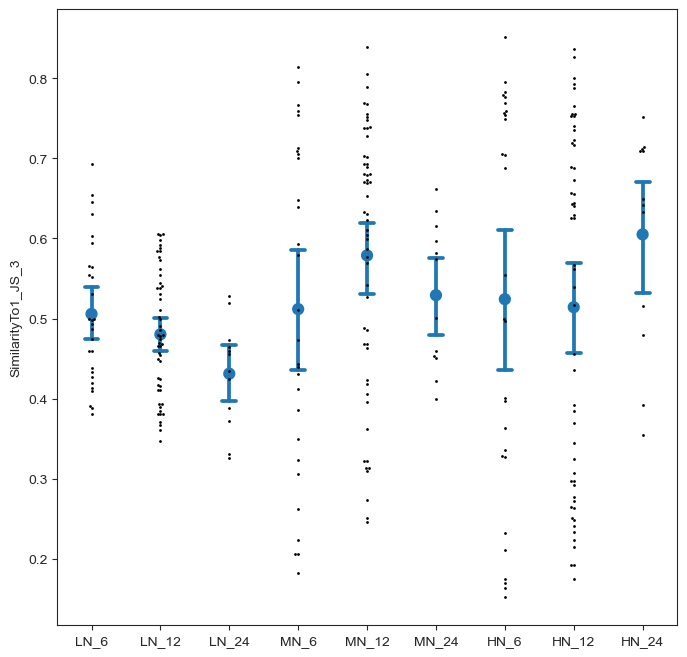

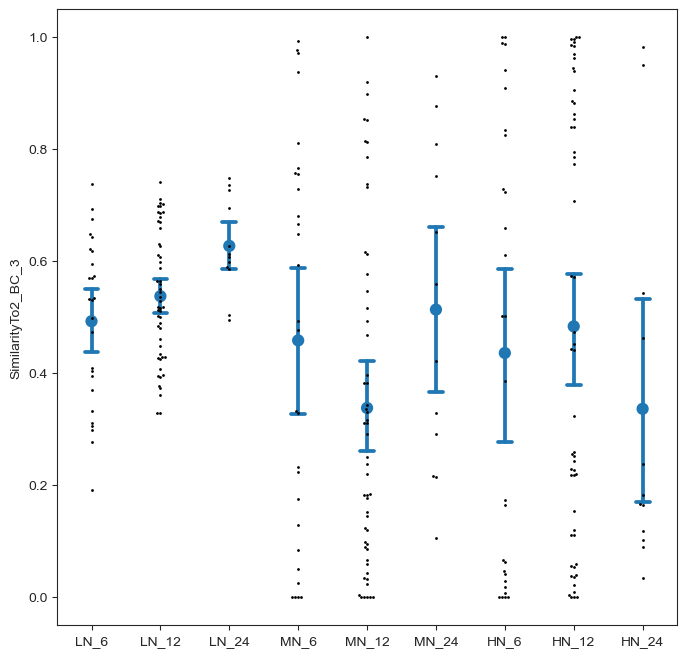

...

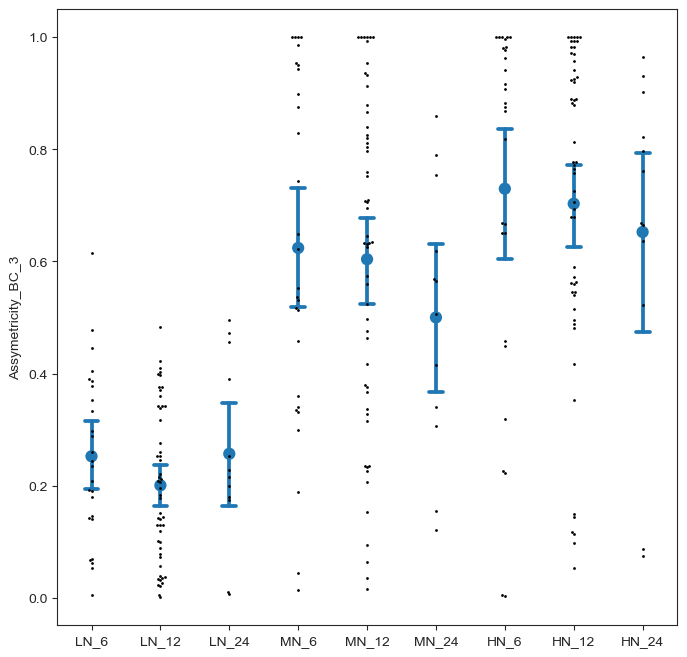

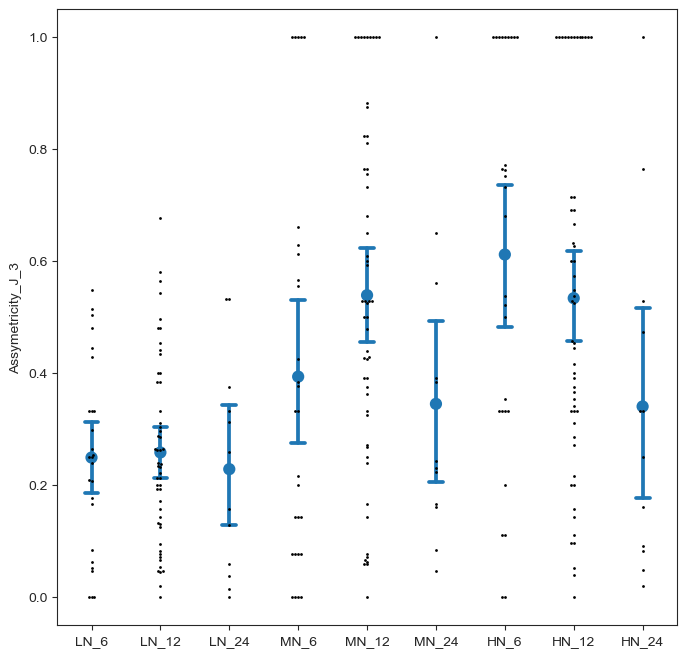

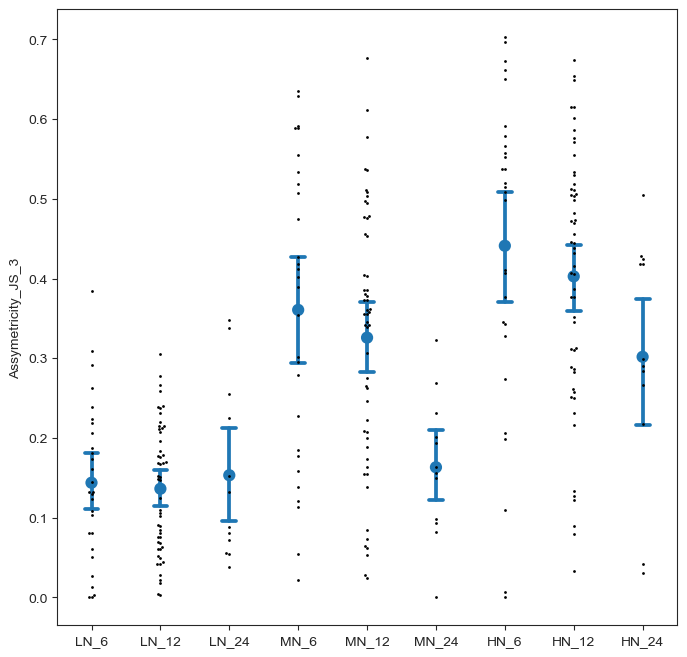

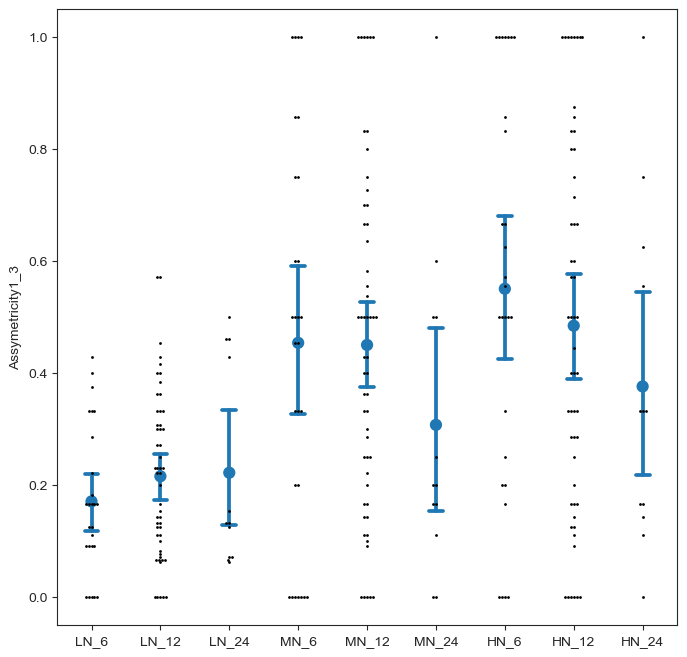

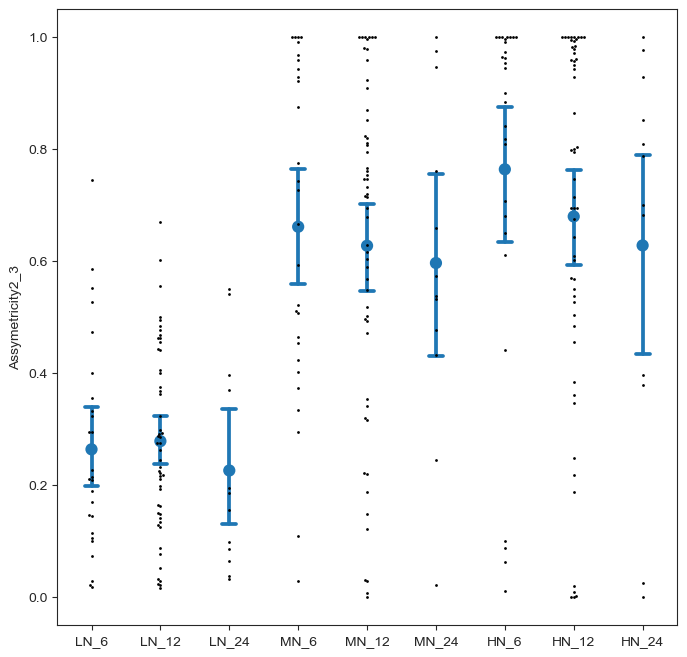

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 30.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 16.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 30.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 16.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


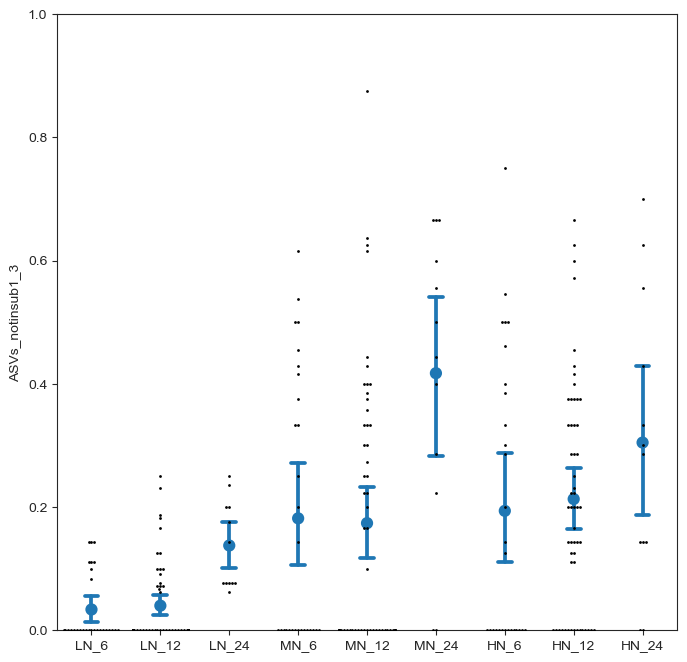

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 7.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 7.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


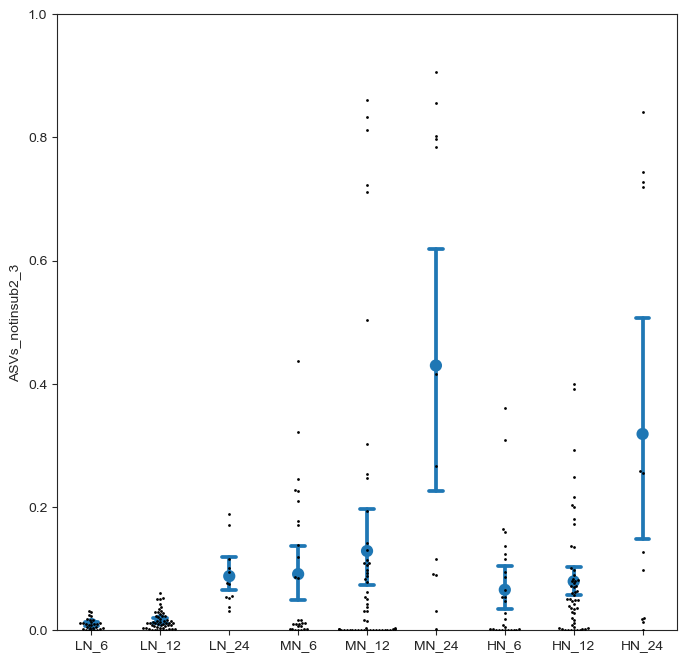

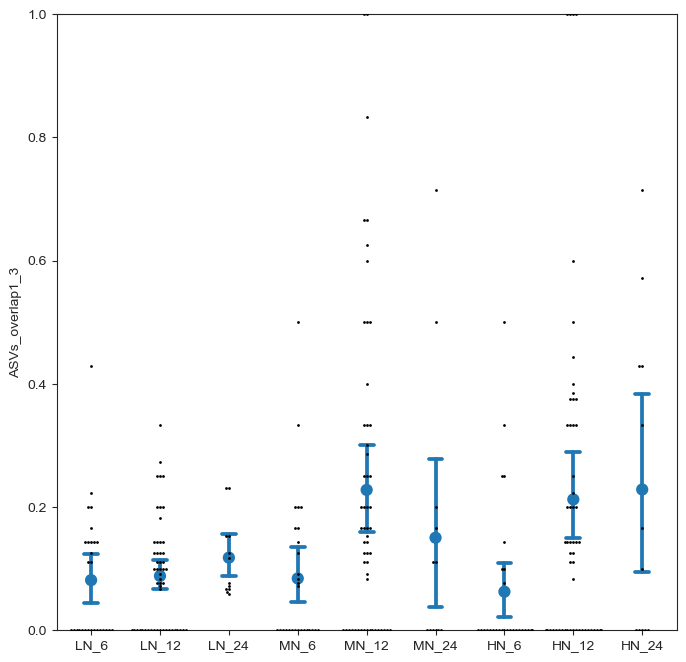

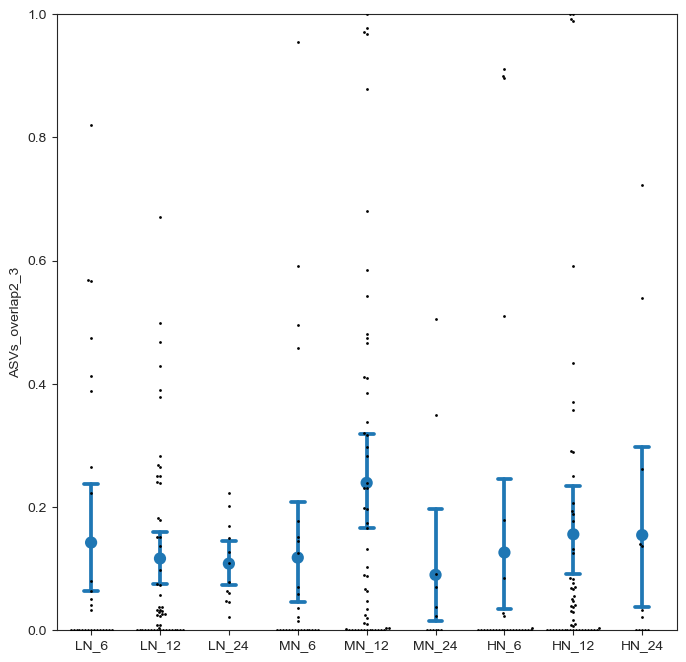

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 63.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 64.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

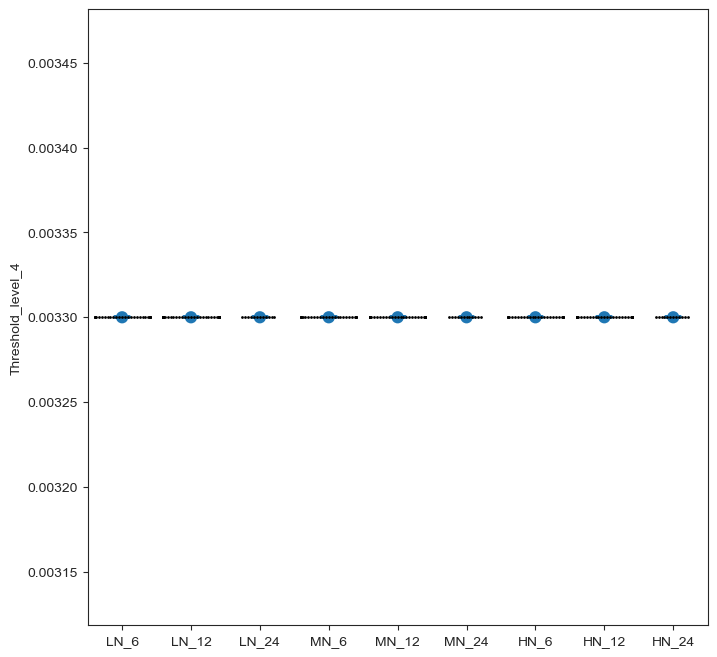

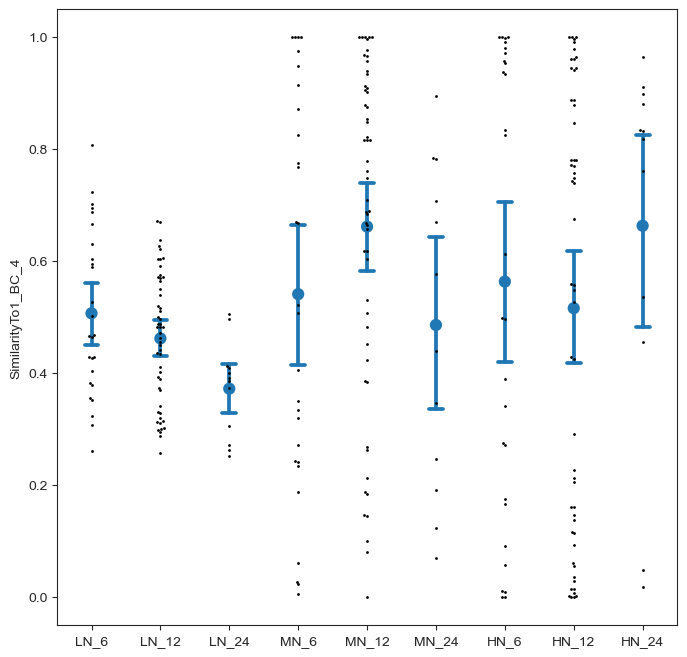

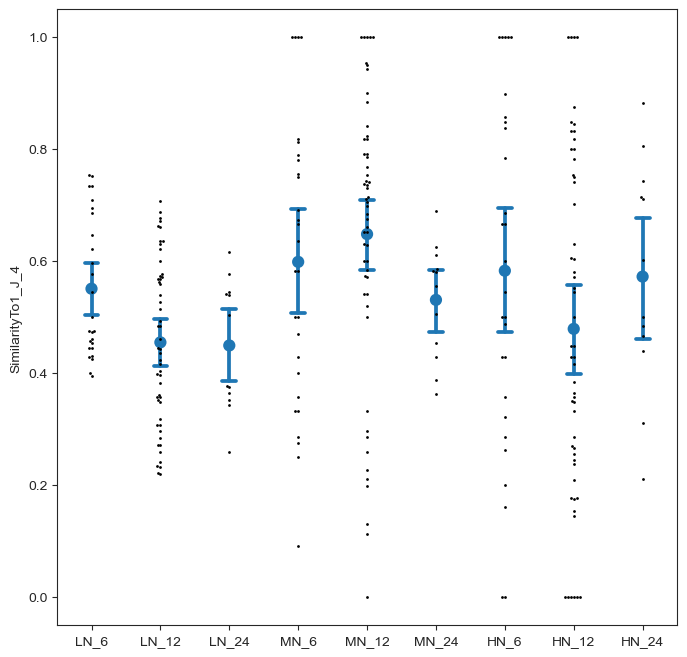

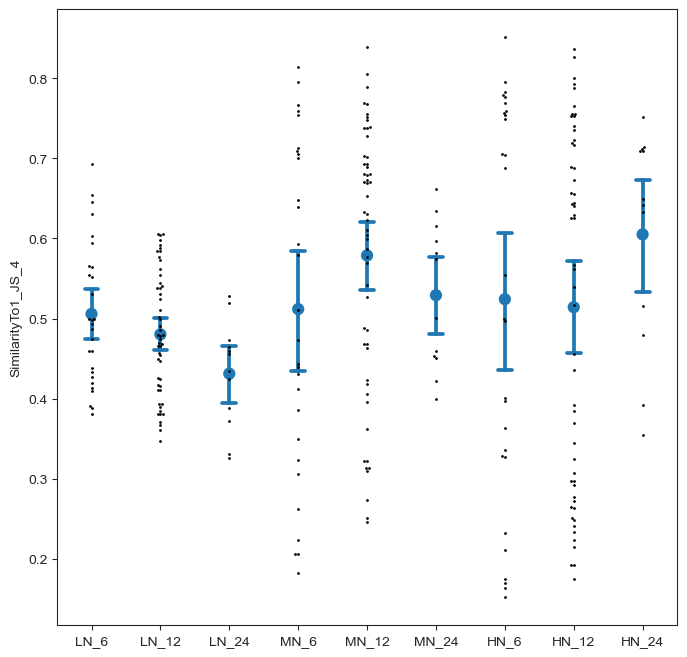

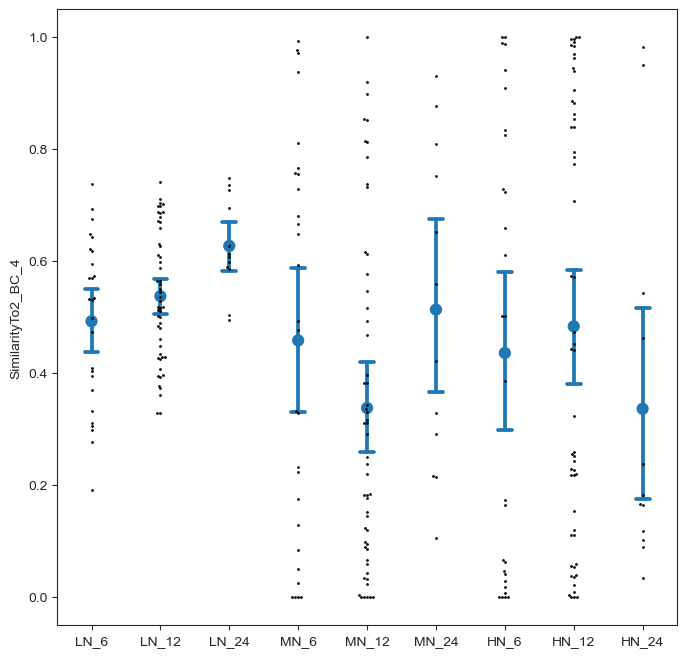

...

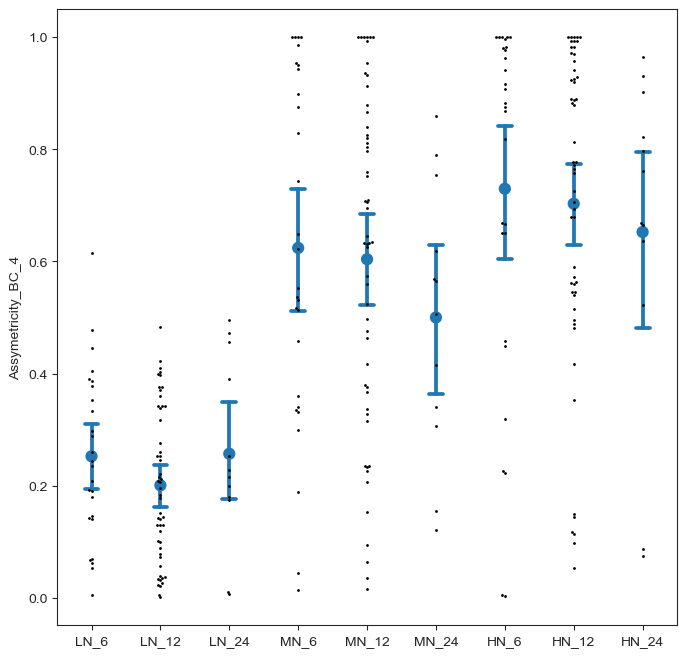

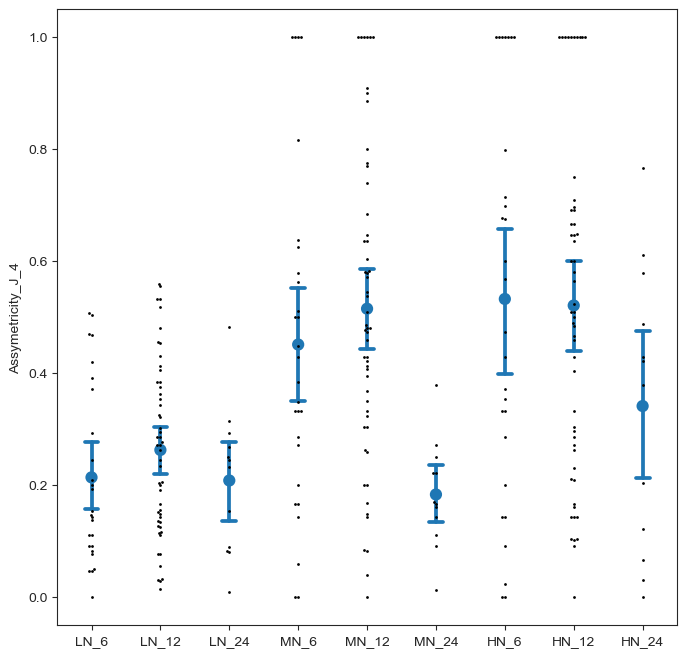

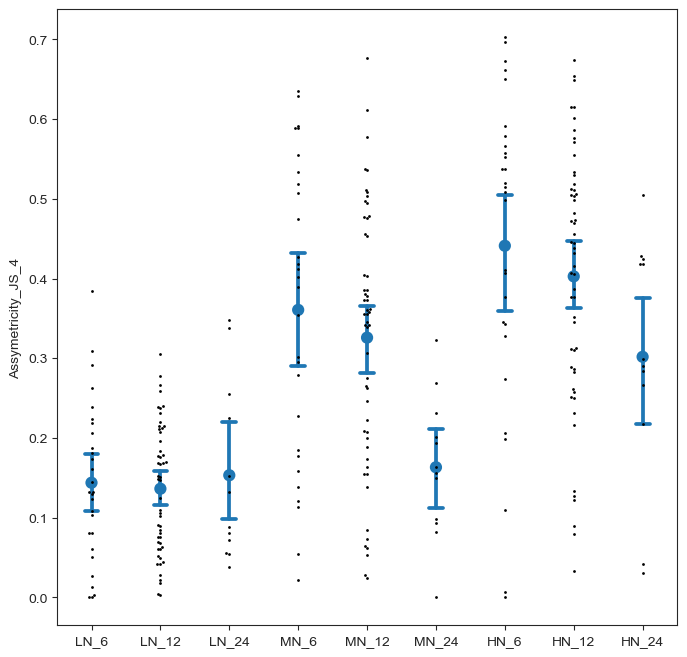

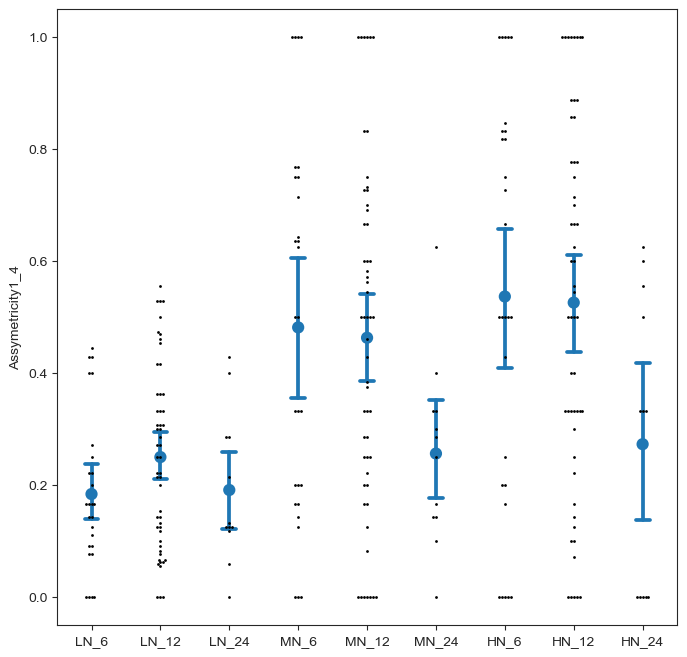

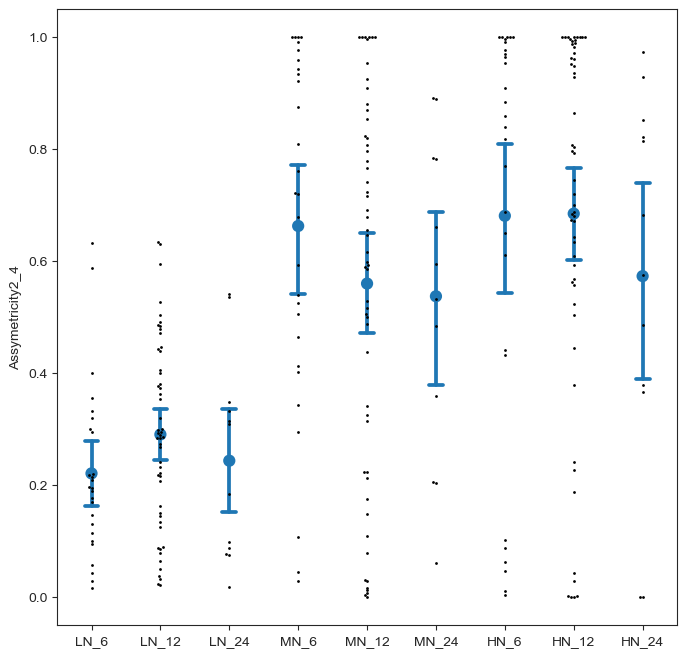

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 30.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 7.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 30.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 7.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


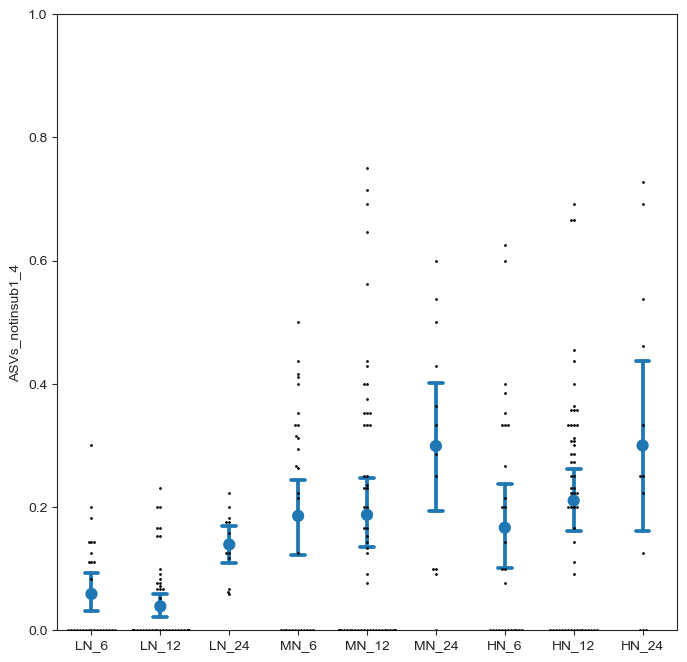

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 26.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 7.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 26.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 7.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


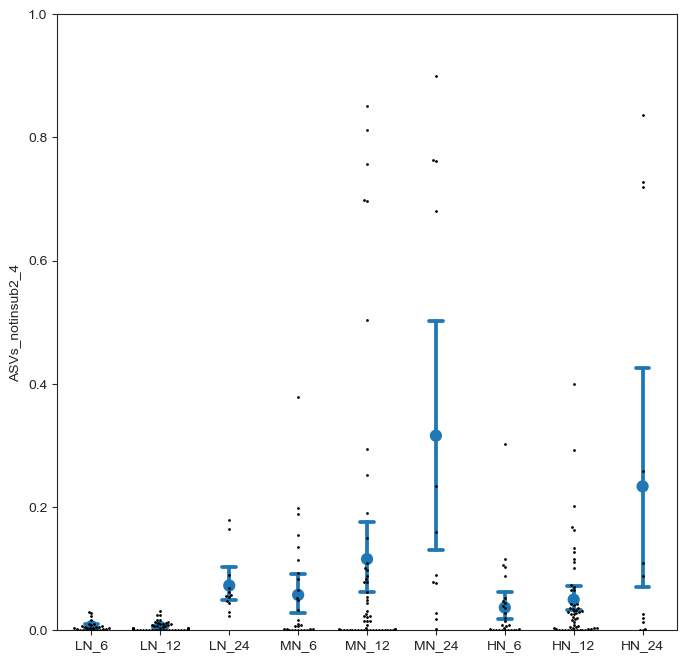

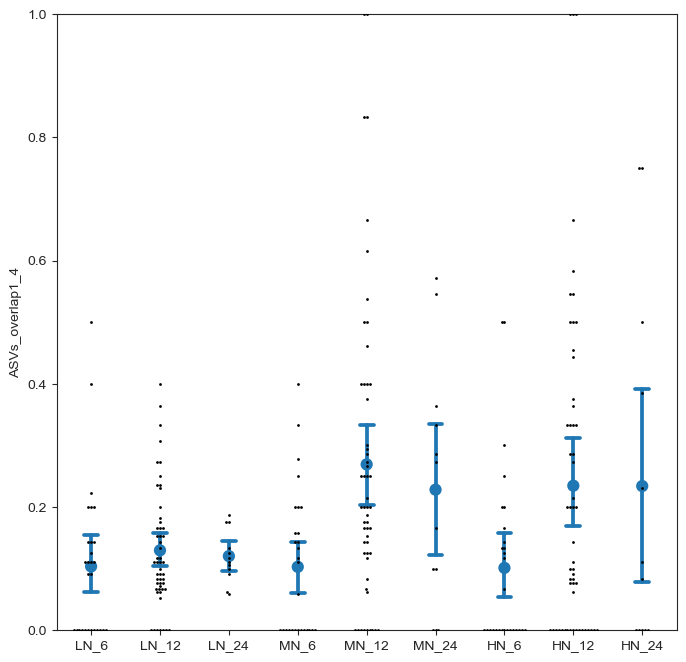

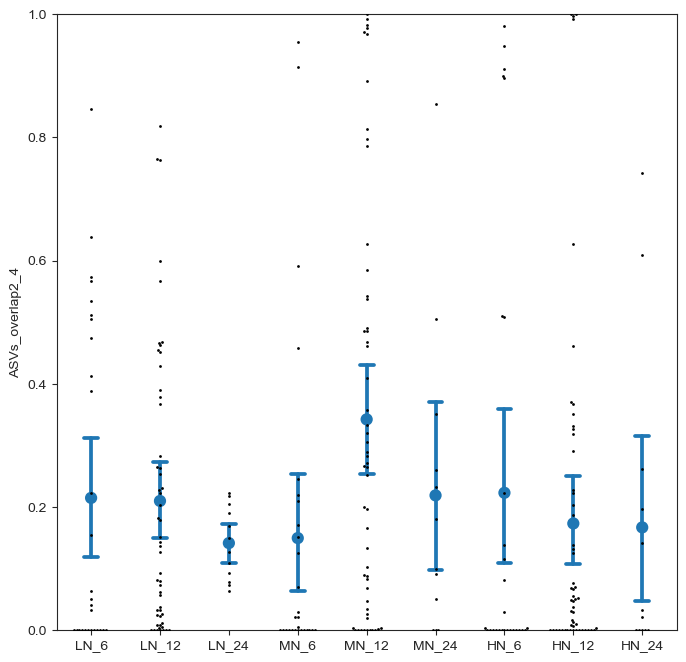

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 63.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 64.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

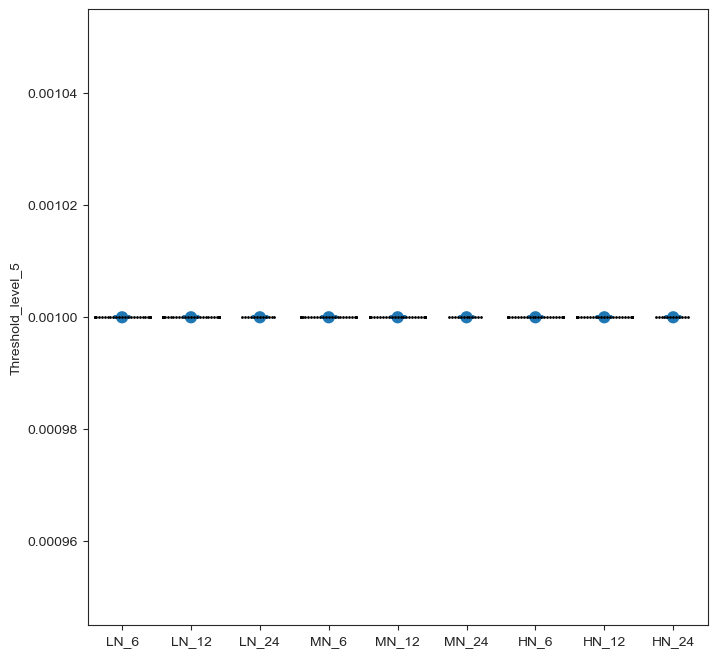

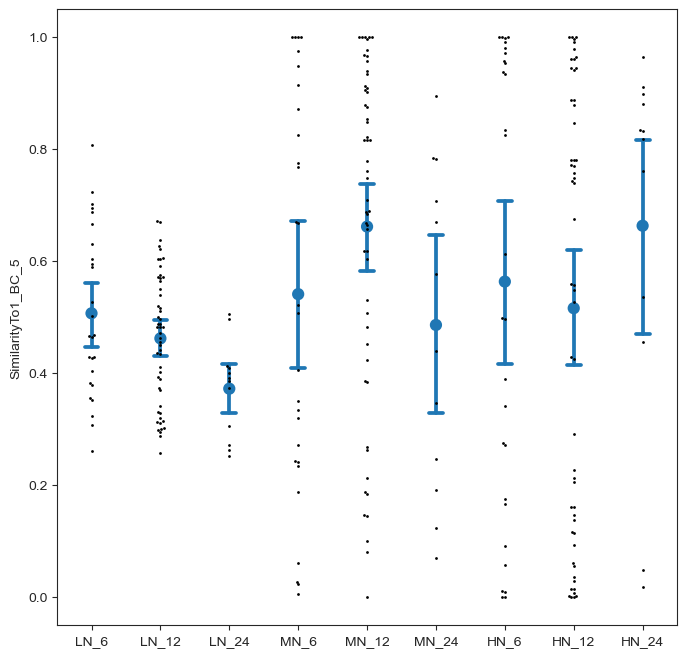

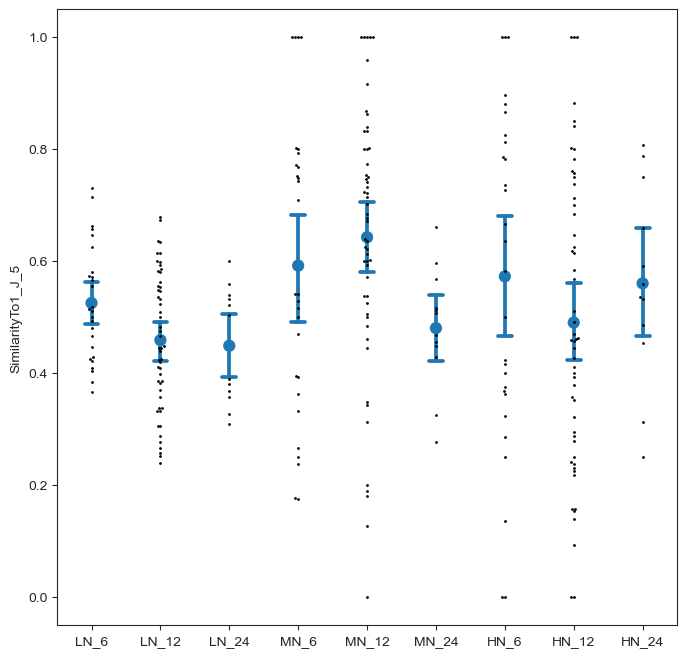

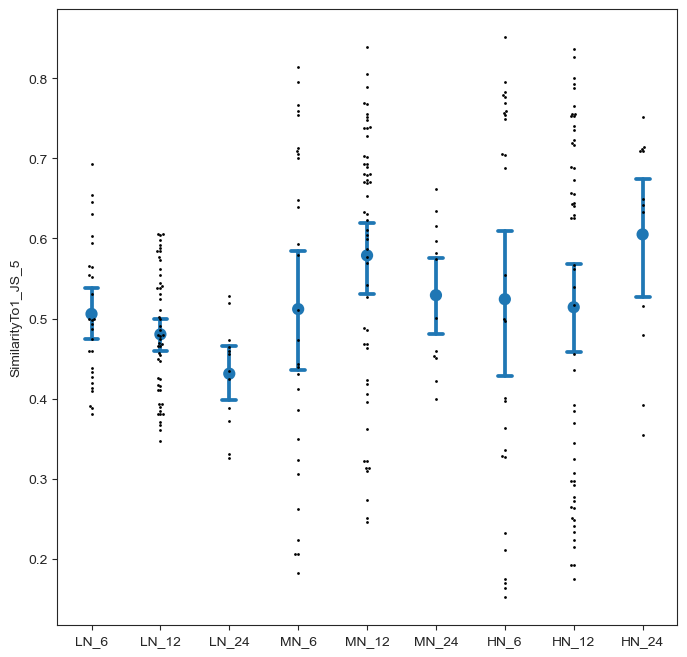

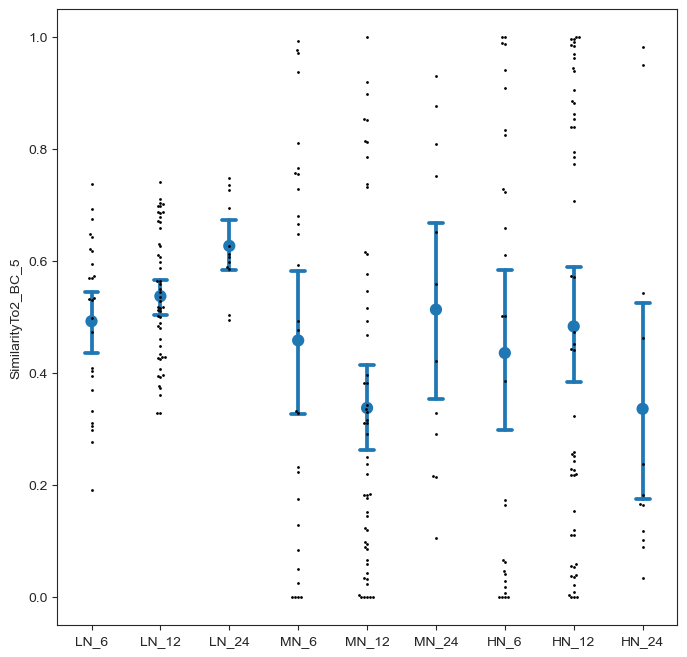

...

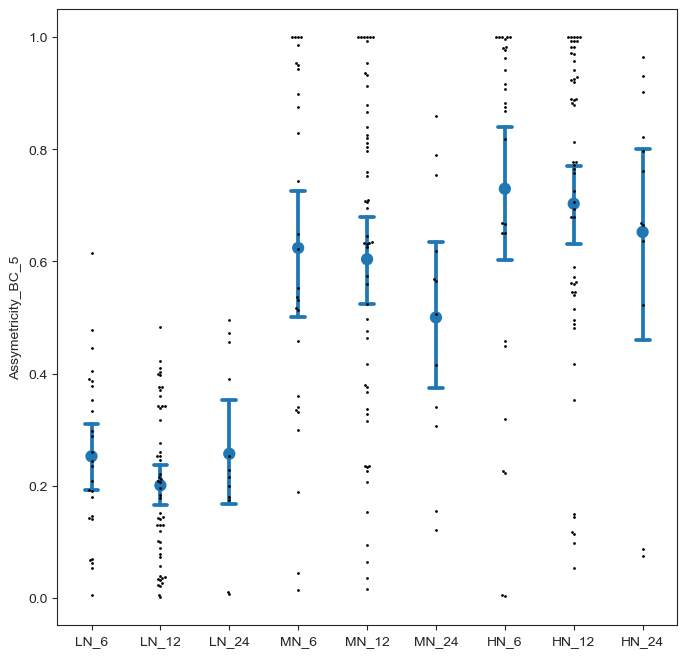

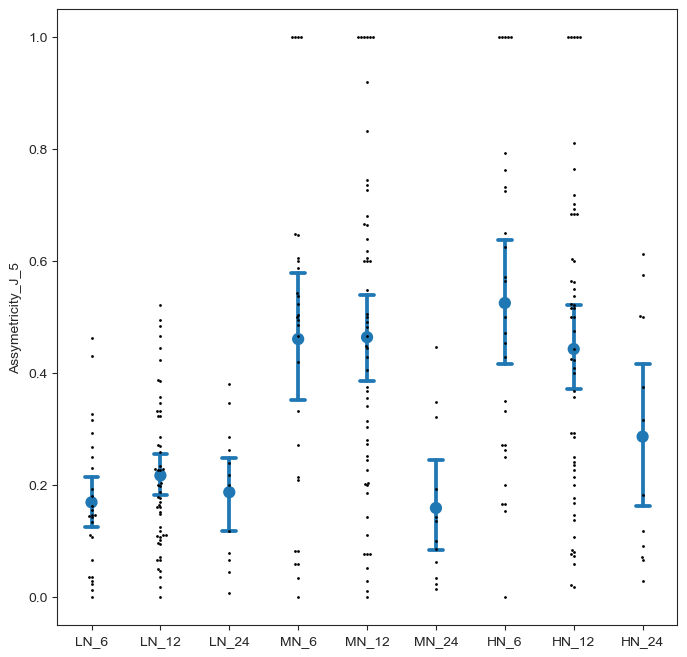

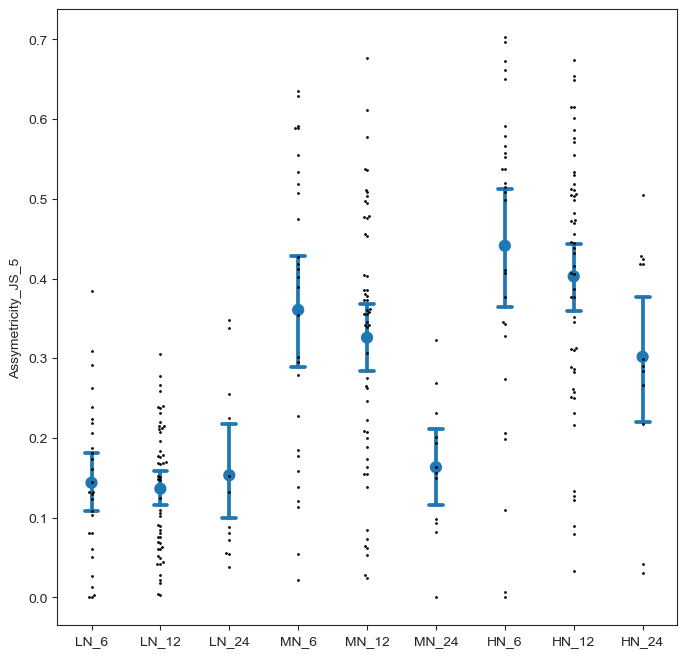

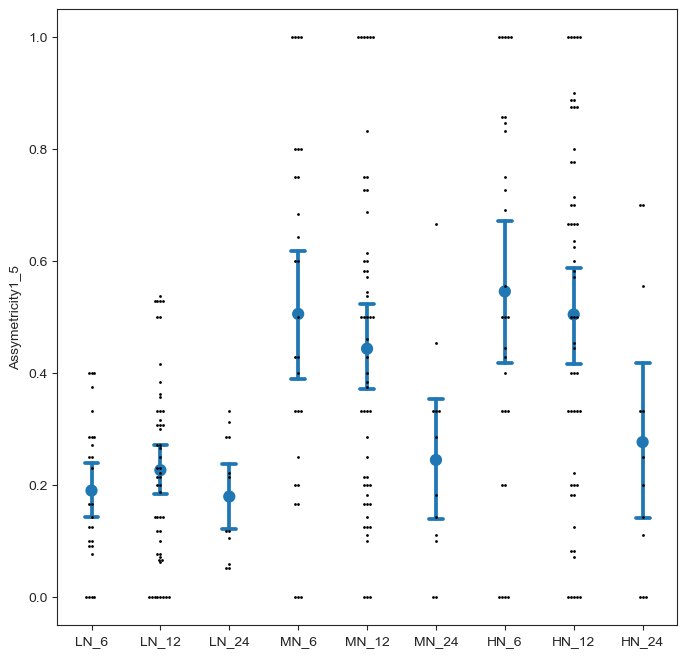

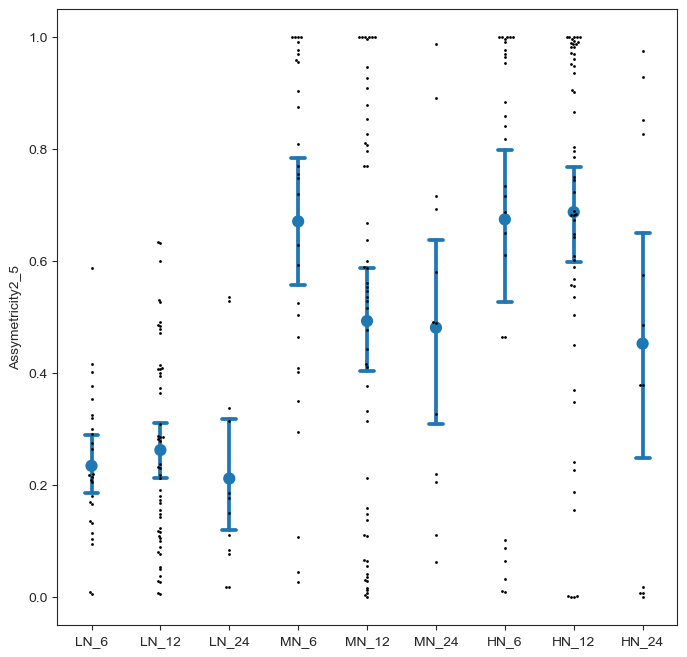

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 11.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 11.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


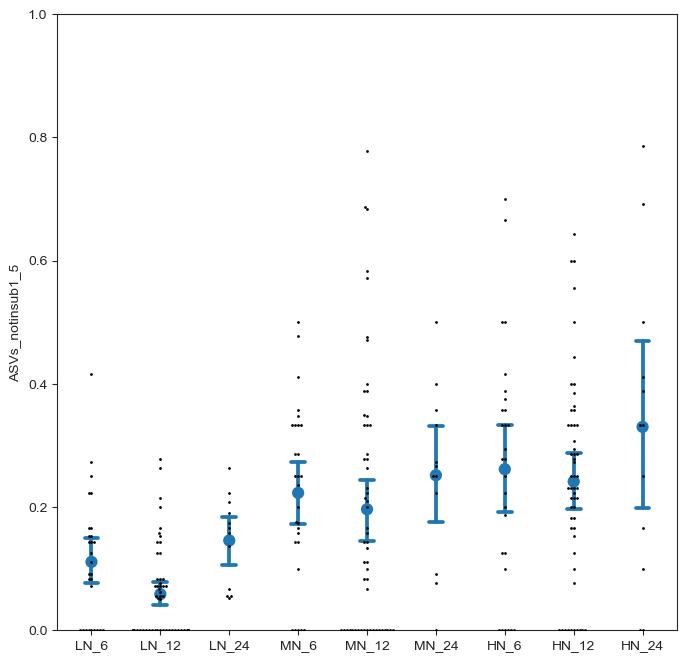

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 10.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 38.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 9.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 10.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

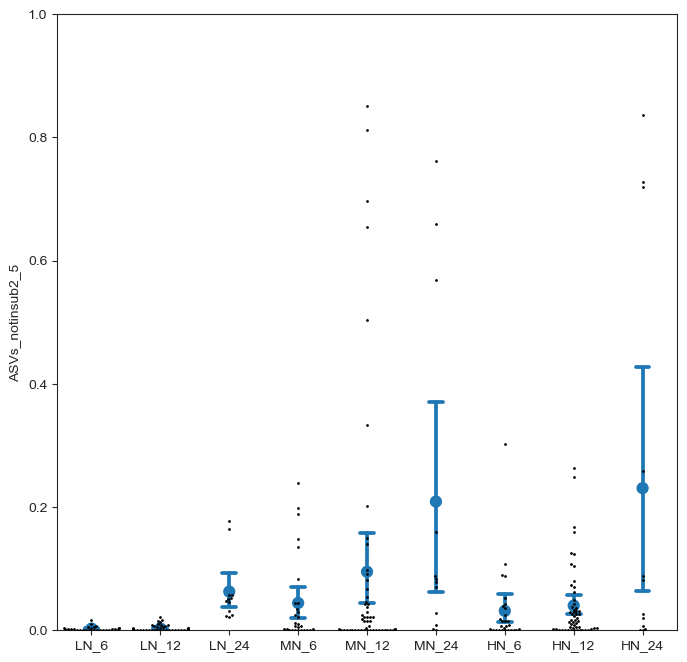

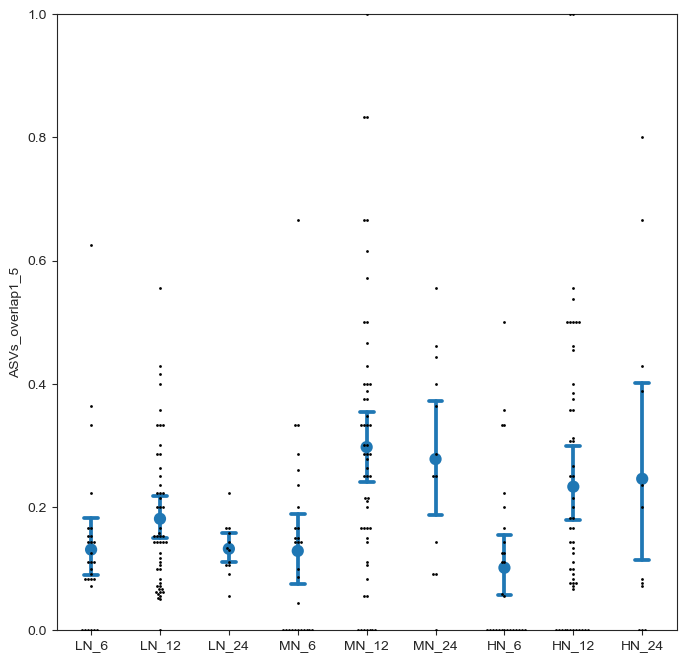

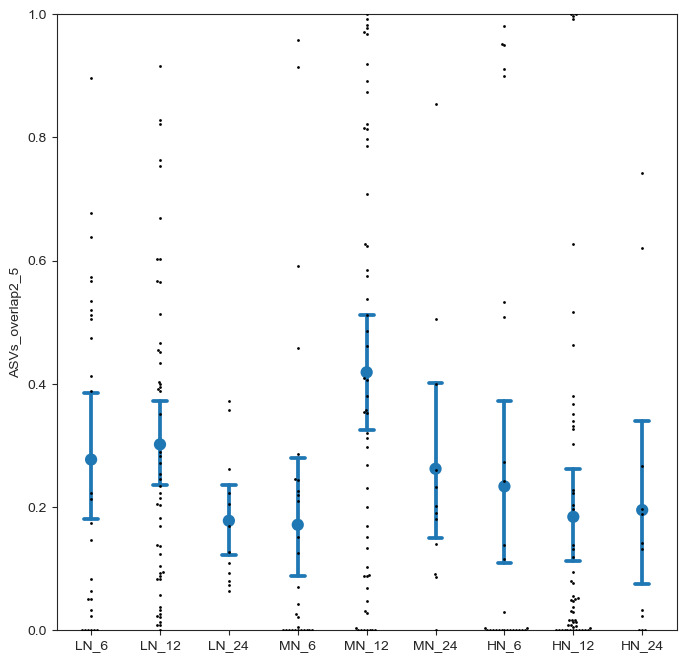

In [9]:
## Coal Figure 2. Plot every variable - swarm&box

typeofplot='swarmpoint' # choose among 'swarmbox', 'swarmpoint'
Variable2plot_list=['Threshold_num',
       'Threshold_level_1', 'SimilarityTo1_BC_1', 'SimilarityTo1_J_1',
       'SimilarityTo1_JS_1', 'SimilarityTo2_BC_1', 'SimilarityTo2_J_1',
       'SimilarityTo2_JS_1', 'Additivity1_1', 'Additivity2_1',
       'Additivity3_1', 'Assymetricity_BC_1', 'Assymetricity_J_1',
       'Assymetricity_JS_1', 'Assymetricity1_1', 'Assymetricity2_1',
       'ASVs_notinsub1_1', 'ASVs_notinsub2_1', 'ASVs_overlap1_1',
       'ASVs_overlap2_1', 'Threshold_level_2', 'SimilarityTo1_BC_2',
       'SimilarityTo1_J_2', 'SimilarityTo1_JS_2', 'SimilarityTo2_BC_2',
       'SimilarityTo2_J_2', 'SimilarityTo2_JS_2', 'Additivity1_2',
       'Additivity2_2', 'Additivity3_2', 'Assymetricity_BC_2',
       'Assymetricity_J_2', 'Assymetricity_JS_2', 'Assymetricity1_2',
       'Assymetricity2_2', 'ASVs_notinsub1_2', 'ASVs_notinsub2_2',
       'ASVs_overlap1_2', 'ASVs_overlap2_2', 'Threshold_level_3',
       'SimilarityTo1_BC_3', 'SimilarityTo1_J_3', 'SimilarityTo1_JS_3',
       'SimilarityTo2_BC_3', 'SimilarityTo2_J_3', 'SimilarityTo2_JS_3',
       'Additivity1_3', 'Additivity2_3', 'Additivity3_3',
       'Assymetricity_BC_3', 'Assymetricity_J_3', 'Assymetricity_JS_3',
       'Assymetricity1_3', 'Assymetricity2_3', 'ASVs_notinsub1_3',
       'ASVs_notinsub2_3', 'ASVs_overlap1_3', 'ASVs_overlap2_3',
       'Threshold_level_4', 'SimilarityTo1_BC_4', 'SimilarityTo1_J_4',
       'SimilarityTo1_JS_4', 'SimilarityTo2_BC_4', 'SimilarityTo2_J_4',
       'SimilarityTo2_JS_4', 'Additivity1_4', 'Additivity2_4',
       'Additivity3_4', 'Assymetricity_BC_4', 'Assymetricity_J_4',
       'Assymetricity_JS_4', 'Assymetricity1_4', 'Assymetricity2_4',
       'ASVs_notinsub1_4', 'ASVs_notinsub2_4', 'ASVs_overlap1_4',
       'ASVs_overlap2_4', 'Threshold_level_5', 'SimilarityTo1_BC_5',
       'SimilarityTo1_J_5', 'SimilarityTo1_JS_5', 'SimilarityTo2_BC_5',
       'SimilarityTo2_J_5', 'SimilarityTo2_JS_5', 'Additivity1_5',
       'Additivity2_5', 'Additivity3_5', 'Assymetricity_BC_5',
       'Assymetricity_J_5', 'Assymetricity_JS_5', 'Assymetricity1_5',
       'Assymetricity2_5', 'ASVs_notinsub1_5', 'ASVs_notinsub2_5',
       'ASVs_overlap1_5', 'ASVs_overlap2_5']


for Variable2plot in Variable2plot_list:
    data_list = []
    type_list = []
    Name2show = Variable2plot
    fig=figure(num=None, figsize=(8, 8), dpi=100, facecolor='w', edgecolor='k')
    for j in range(len(mediums)):
        for i in  range(len(species_pools)):
            M = mediums[j]
            S = species_pools[i]
            type_name = M + "_" + str(S)
            IDX_list = Syn_Coal_IDX[type_name]
            data = getCoalescence(Coalescence_data,IDX_list)
            data = data[Variable2plot]
            data_list.extend(data)
            type_list.extend([type_name] * len(data))

    x =type_list
    y = data_list
    if typeofplot == 'swarmbox':
        sns.swarmplot(x=x,y=y,color='black', size=2)
        sns.boxplot(x=x,y=y)
    elif typeofplot == 'swarmpoint':
        sns.swarmplot(x=x,y=y,color='black', size=2)
        sns.pointplot(x=x,y=y, dodge=True, join=False,  capsize=.2)
    plt.ylabel(Name2show)
    ax = plt.gca()
    if 'ASVs_' in Variable2plot:
        ax.set_ylim([0, 1])
    #plt.xlabel(("Coalescence Type, Medium, and Number of Species"))
    plt.show()
    fig.savefig("Figures/Coal_Analysis_"+typeofplot+'_'+Variable2plot+".png", bbox_inches='tight')
    plt.close(fig)
    
    


#AllAbudnaces=getAbundance(Metadata['SampleIDX'])

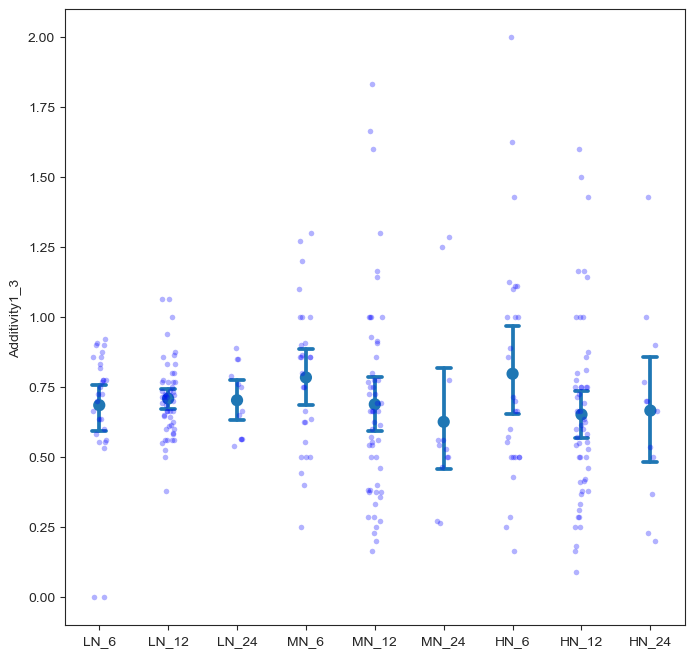

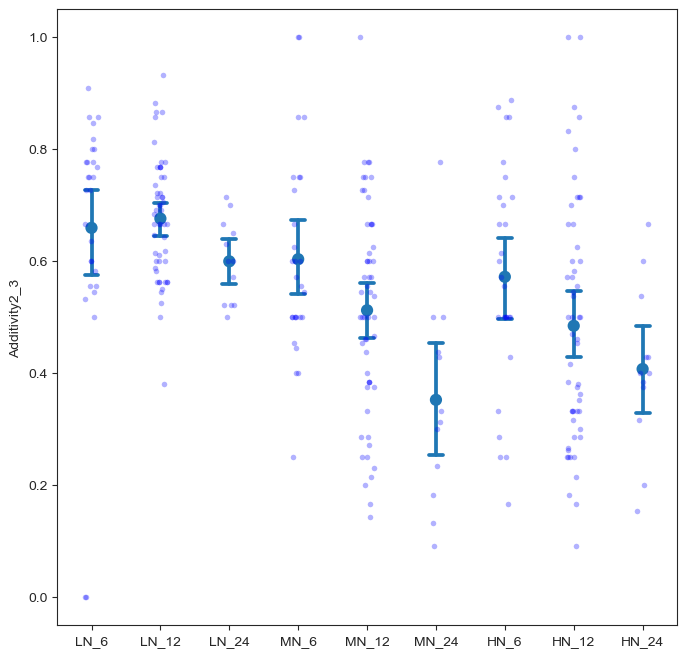

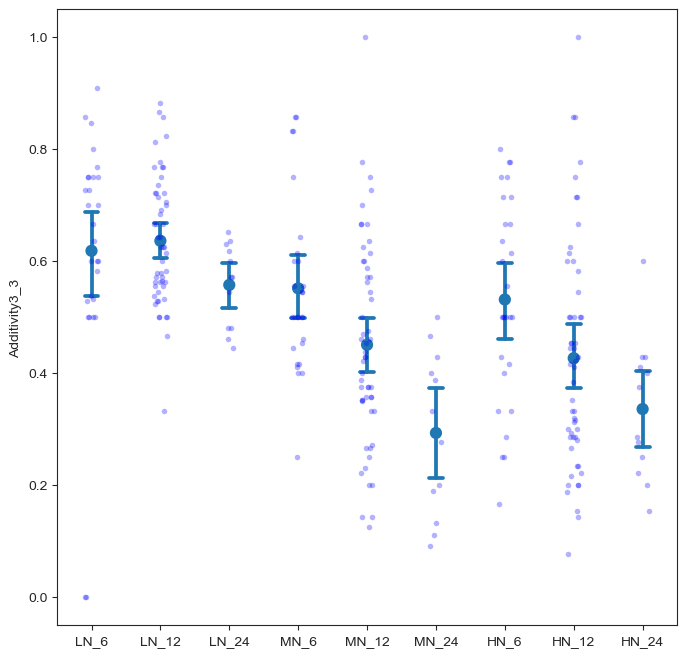

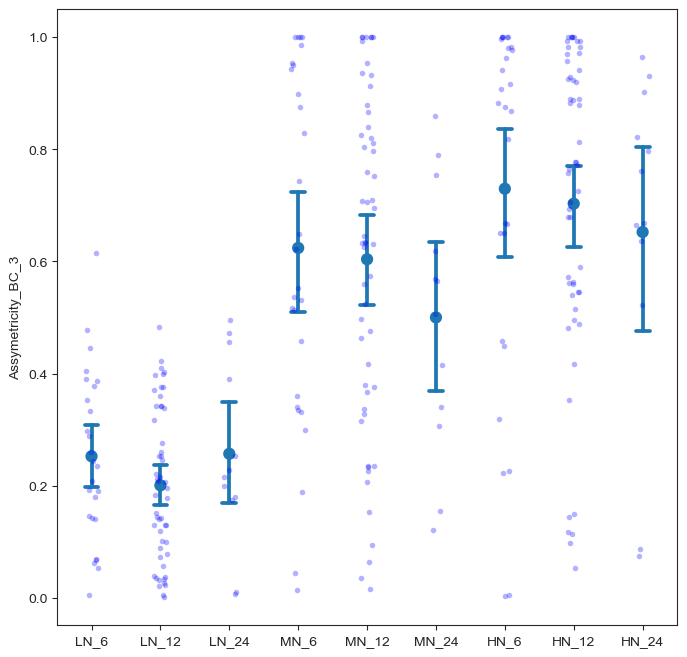

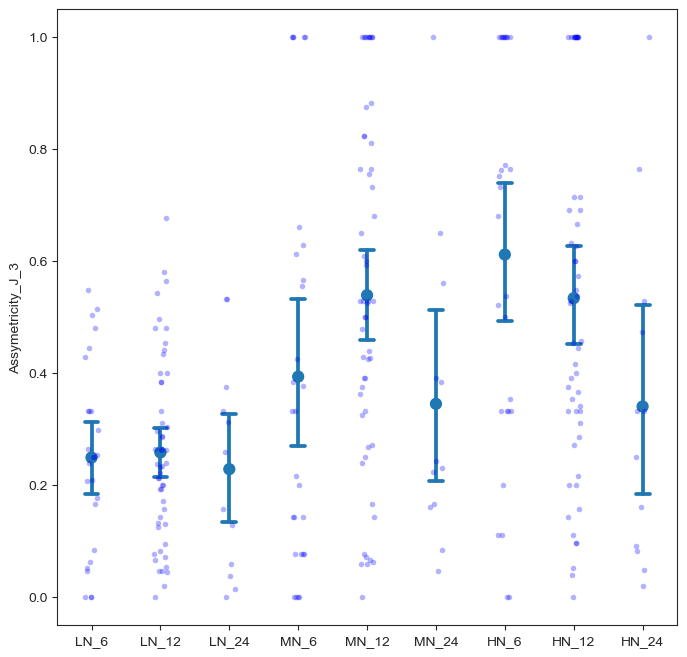

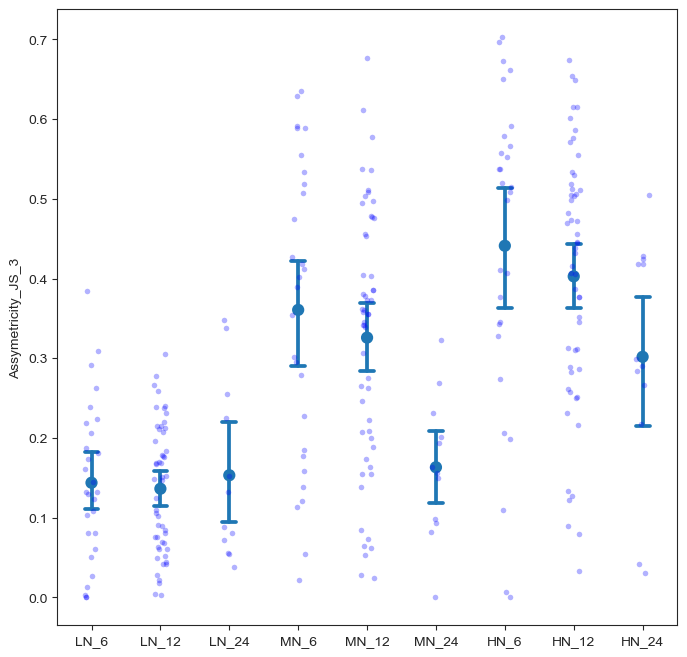

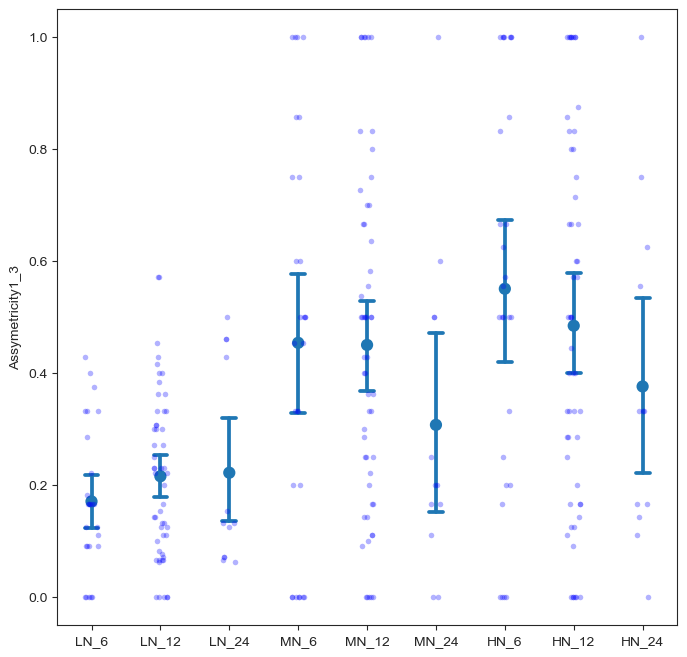

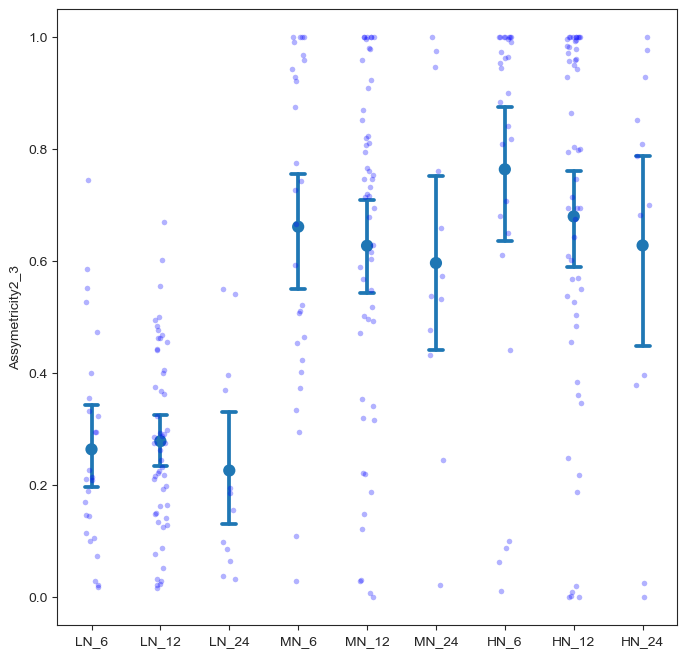

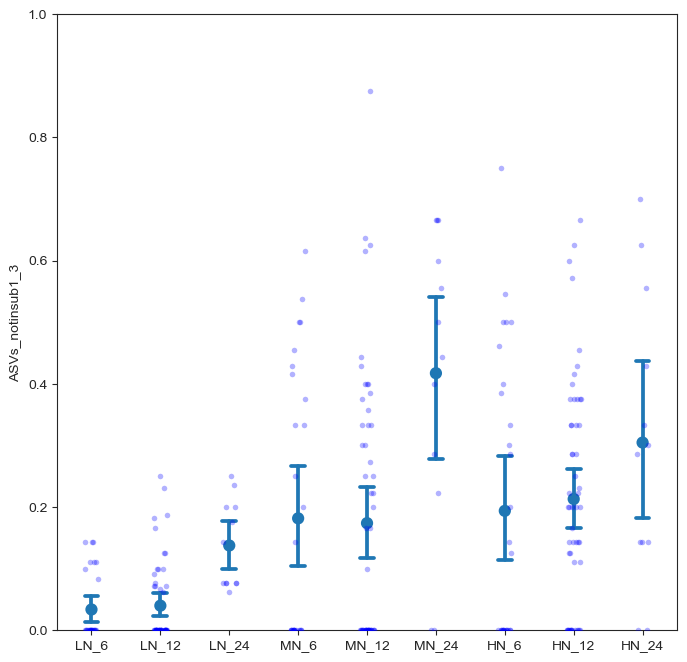

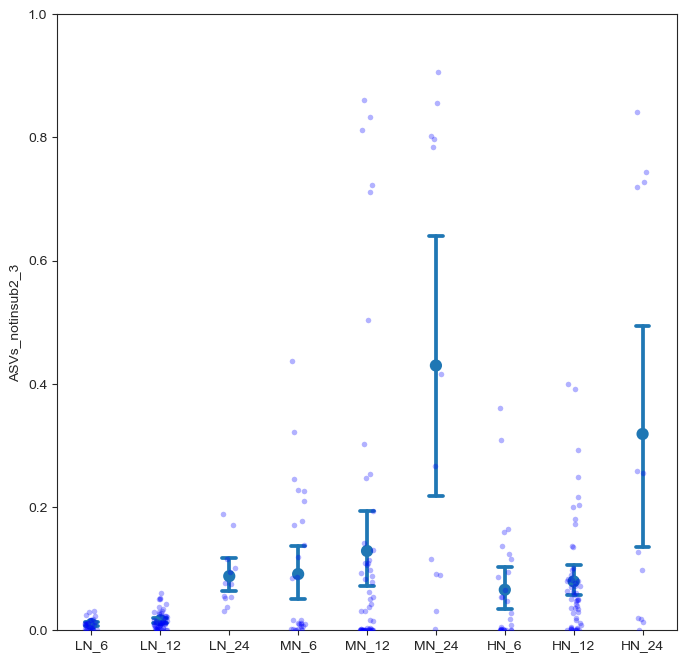

In [13]:
## Coal Figure 2. Plot every variable - swarm&box

typeofplot='swarmpoint' # choose among 'swarmbox', 'swarmpoint'
Variable2plot_list=[
       'Additivity1_3', 'Additivity2_3', 'Additivity3_3',
       'Assymetricity_BC_3', 'Assymetricity_J_3', 'Assymetricity_JS_3',
       'Assymetricity1_3', 'Assymetricity2_3', 'ASVs_notinsub1_3',
       'ASVs_notinsub2_3']


for Variable2plot in Variable2plot_list:
    data_list = []
    type_list = []
    Name2show = Variable2plot
    fig=figure(num=None, figsize=(8, 8), dpi=100, facecolor='w', edgecolor='k')
    for j in range(len(mediums)):
        for i in  range(len(species_pools)):
            M = mediums[j]
            S = species_pools[i]
            type_name = M + "_" + str(S)
            IDX_list = Syn_Coal_IDX[type_name]
            data = getCoalescence(Coalescence_data,IDX_list)
            data = data[Variable2plot]
            data_list.extend(data)
            type_list.extend([type_name] * len(data))

    x =type_list
    y = data_list
    if typeofplot == 'swarmbox':
        sns.swarmplot(x=x,y=y,color='black', size=2)
        sns.boxplot(x=x,y=y)
    elif typeofplot == 'swarmpoint':
        sns.stripplot(x=x,y=y,color='blue', size=4, alpha=0.3)
        sns.pointplot(x=x,y=y, dodge=True, join=False,  capsize=.2)
    plt.ylabel(Name2show)
    ax = plt.gca()
    if 'ASVs_' in Variable2plot:
        ax.set_ylim([0, 1])
    #plt.xlabel(("Coalescence Type, Medium, and Number of Species"))
    plt.show()
    fig.savefig("Figures/Coal_Analysis_"+typeofplot+'_'+Variable2plot+".png", bbox_inches='tight')
    plt.close(fig)
    
    


#AllAbudnaces=getAbundance(Metadata['SampleIDX'])

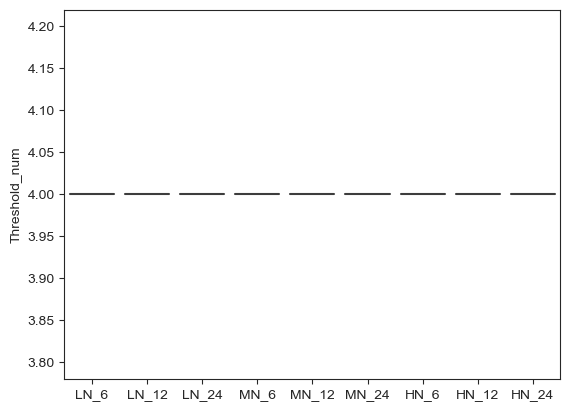

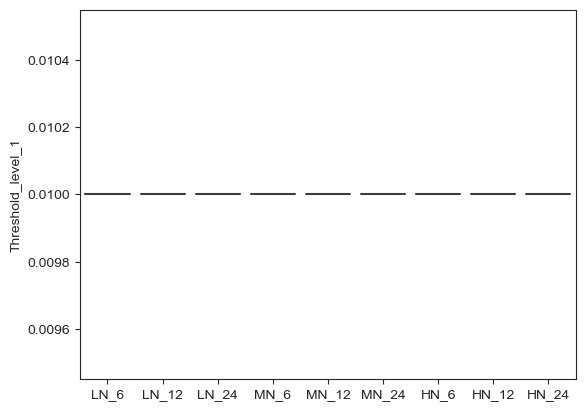

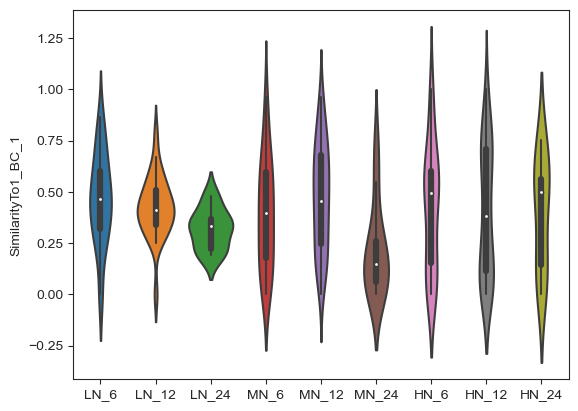

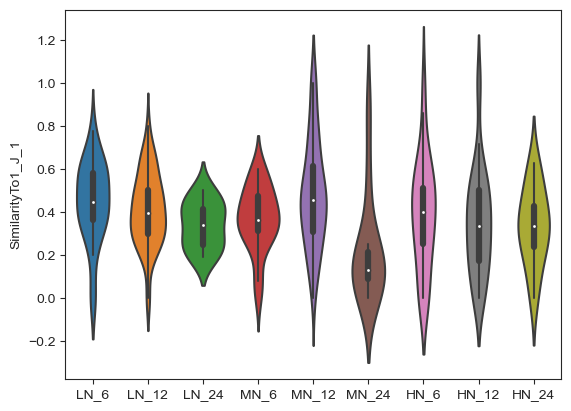

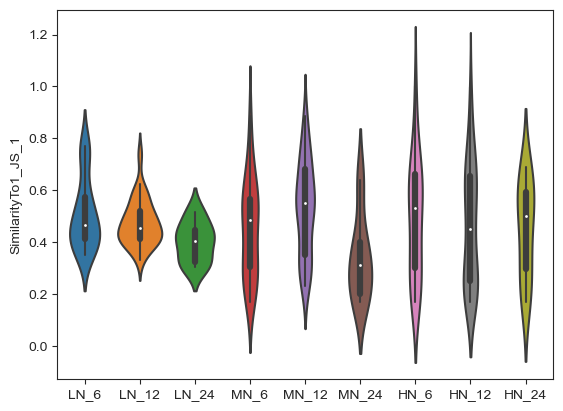

...

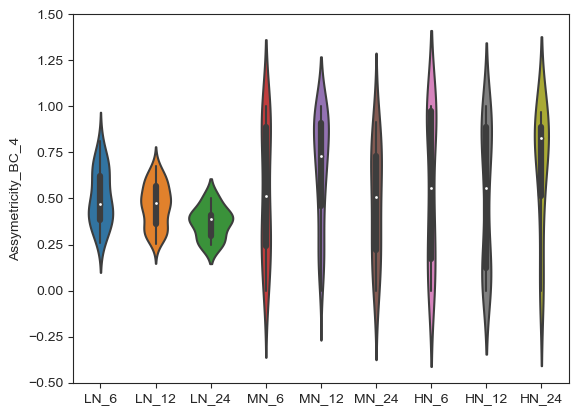

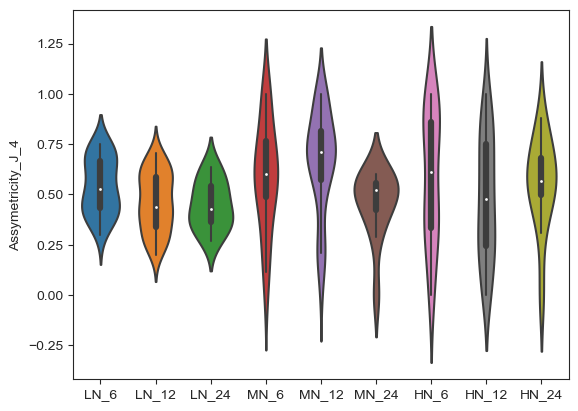

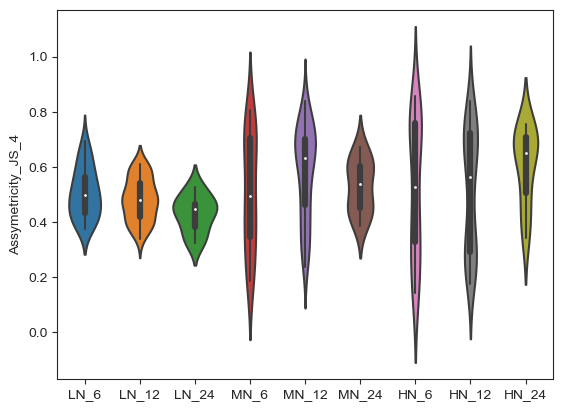

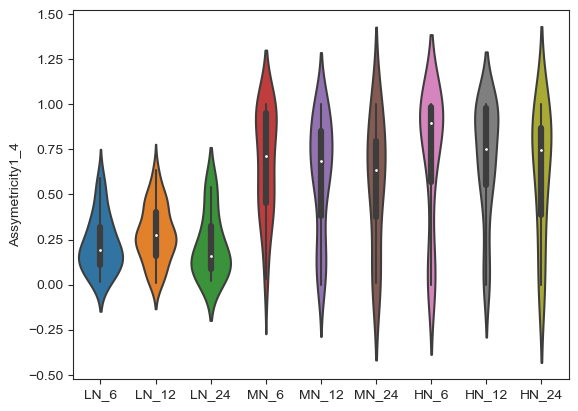

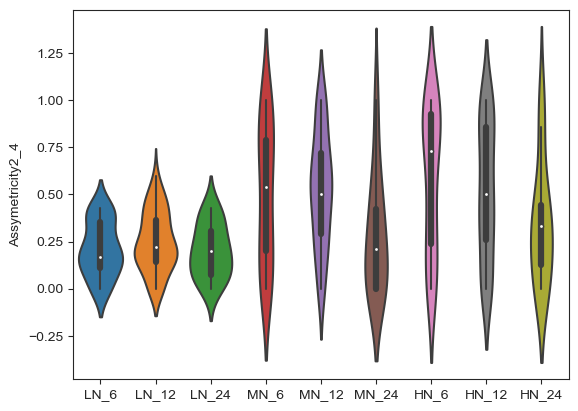

In [35]:
## Figure 1. There are a lot of fake detected ASVs
#AllAbudnaces=getAbundance(Metadata['SampleIDX'])



Variable2plot_list = [ 'Threshold_num', 'Threshold_level_1', 'SimilarityTo1_BC_1',
        'SimilarityTo1_J_1', 'SimilarityTo1_JS_1', 'SimilarityTo2_BC_1',
        'SimilarityTo2_J_1', 'SimilarityTo2_JS_1', 'Additivity1_1',
        'Additivity2_1', 'Additivity3_1', 'Overlap_1', 'Assymetricity_BC_1',
        'Assymetricity_J_1', 'Assymetricity_JS_1', 'Assymetricity1_1',
        'Assymetricity2_1', 'Threshold_level_2', 'SimilarityTo1_BC_2',
        'SimilarityTo1_J_2', 'SimilarityTo1_JS_2', 'SimilarityTo2_BC_2',
        'SimilarityTo2_J_2', 'SimilarityTo2_JS_2', 'Additivity1_2',
        'Additivity2_2', 'Additivity3_2', 'Overlap_2', 'Assymetricity_BC_2',
        'Assymetricity_J_2', 'Assymetricity_JS_2', 'Assymetricity1_2',
        'Assymetricity2_2', 'Threshold_level_3', 'SimilarityTo1_BC_3',
        'SimilarityTo1_J_3', 'SimilarityTo1_JS_3', 'SimilarityTo2_BC_3',
        'SimilarityTo2_J_3', 'SimilarityTo2_JS_3', 'Additivity1_3',
        'Additivity2_3', 'Additivity3_3', 'Overlap_3', 'Assymetricity_BC_3',
        'Assymetricity_J_3', 'Assymetricity_JS_3', 'Assymetricity1_3',
        'Assymetricity2_3', 'Threshold_level_4', 'SimilarityTo1_BC_4',
        'SimilarityTo1_J_4', 'SimilarityTo1_JS_4', 'SimilarityTo2_BC_4',
        'SimilarityTo2_J_4', 'SimilarityTo2_JS_4', 'Additivity1_4',
        'Additivity2_4', 'Additivity3_4', 'Overlap_4', 'Assymetricity_BC_4',
        'Assymetricity_J_4', 'Assymetricity_JS_4', 'Assymetricity1_4',
        'Assymetricity2_4']
for Variable2plot in Variable2plot_list:
    data_list = []
    type_list = []
    Name2show = Variable2plot
    plt.close()
    for j in range(len(mediums)):
        for i in  range(len(species_pools)):
            M = mediums[j]
            S = species_pools[i]
            type_name = M + "_" + str(S)
            IDX = [getIDX(Coalescence_data, x) for x in Synthetic_IDX[type_name]]
            data = Coalescence_data[Variable2plot][np.concatenate(IDX)]
            data_list.extend(data)
            type_list.extend([type_name] * len(data))

    daynames = ["LN_6", "LN_12", "LN_24", "MN_6", "MN_12", "MN_24", "HN_6", "HN_12", "HN_24"]
    x =type_list
    y = data_list
    sns.violinplot(x=x,y=y)
    plt.ylabel(Variable2plot)
    #plt.xlabel(("Coalescence Type, Medium, and Number of Species"))
    plt.show()
    fig.savefig("Figures/Coal_Analysis"+Variable2plot+"_violinplot.png", bbox_inches='tight')
    

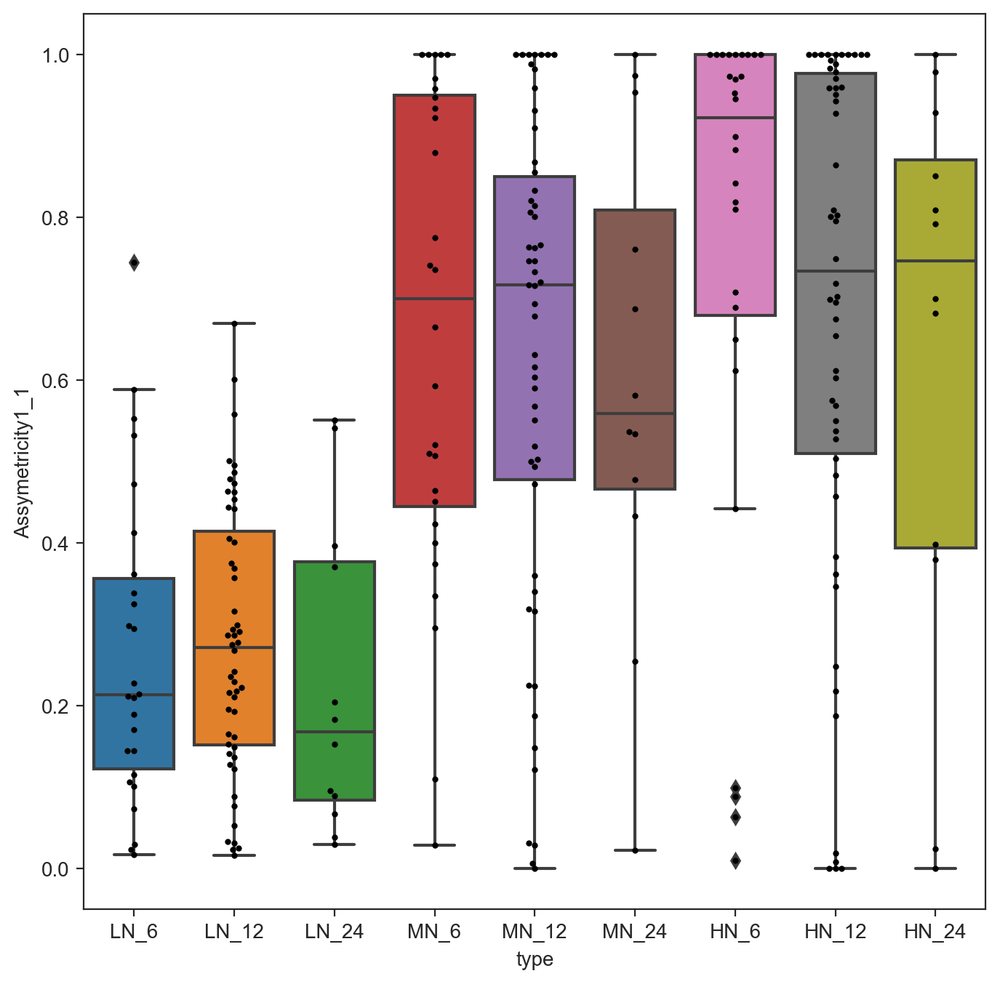

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 60.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 79.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 60.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

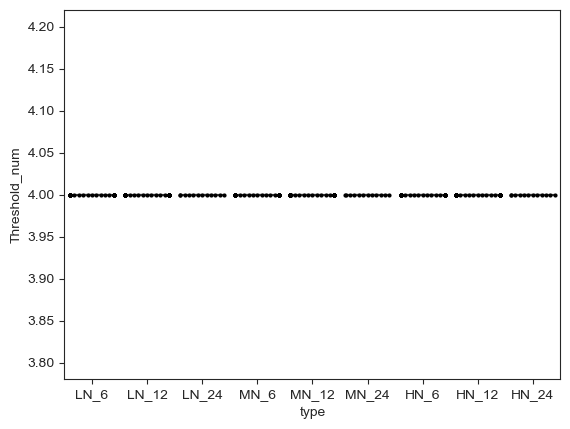

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 60.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 79.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 60.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

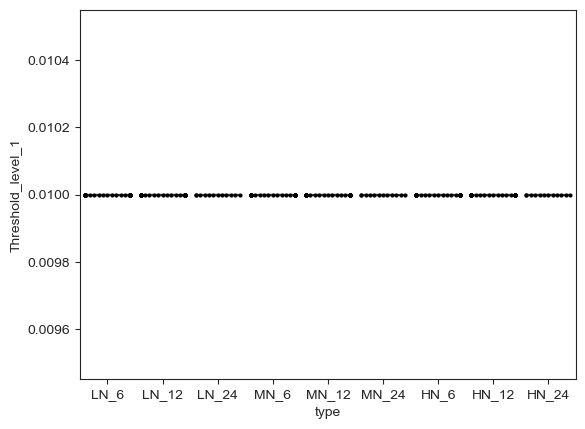

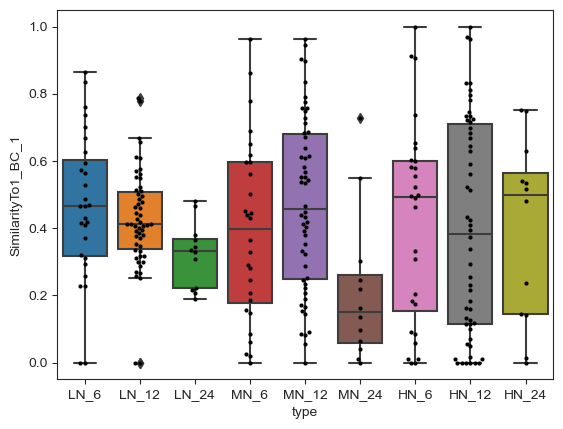

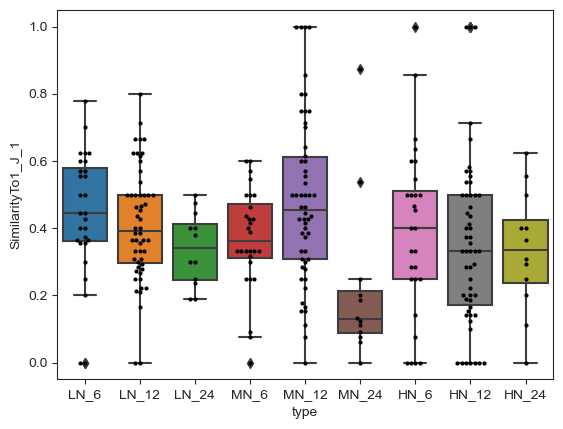

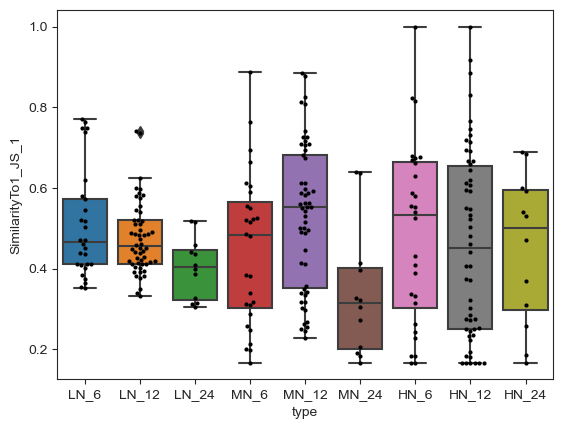

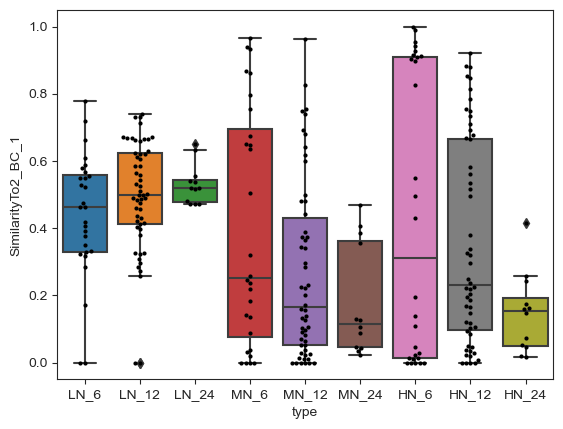

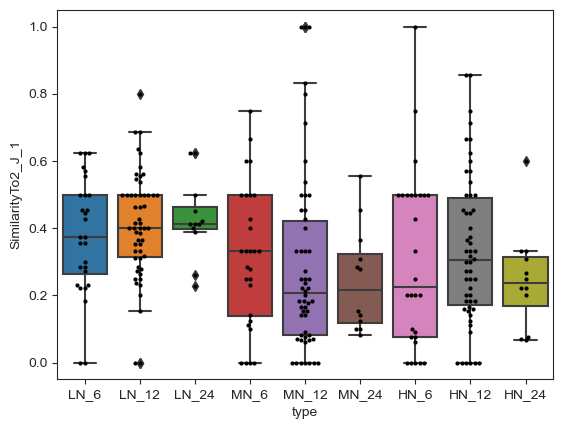

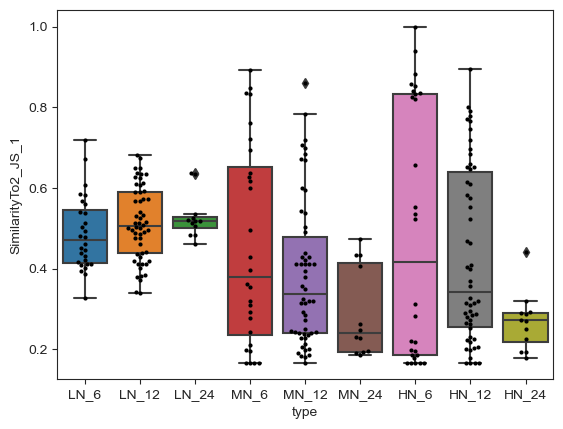

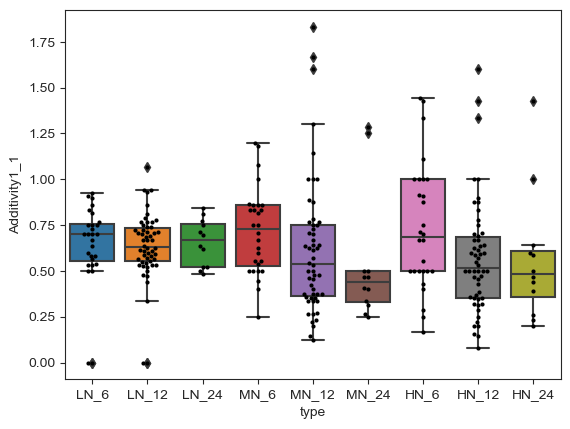

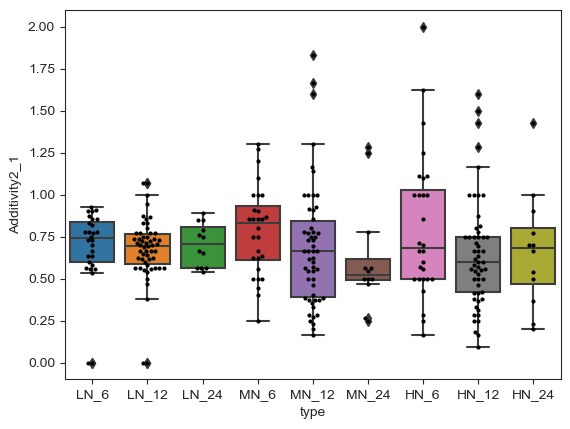

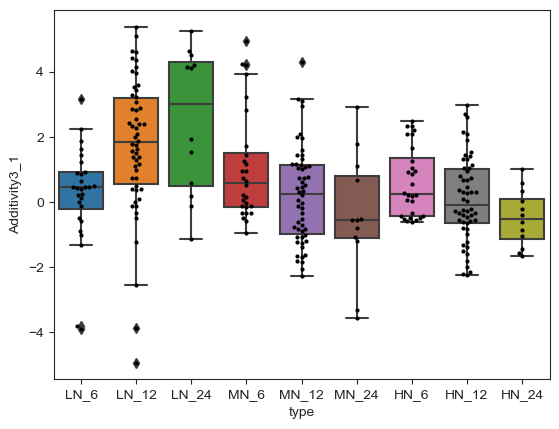

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 14.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 20.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 32.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/mi

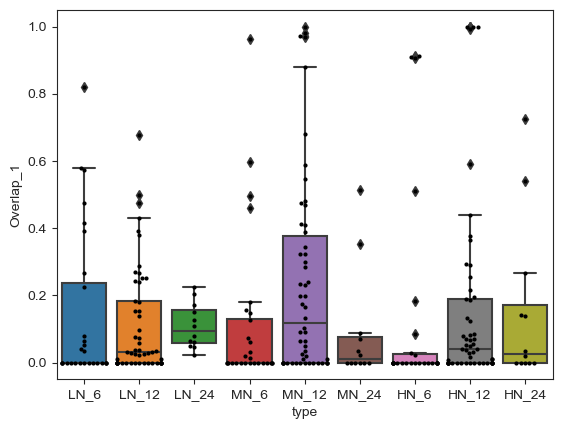

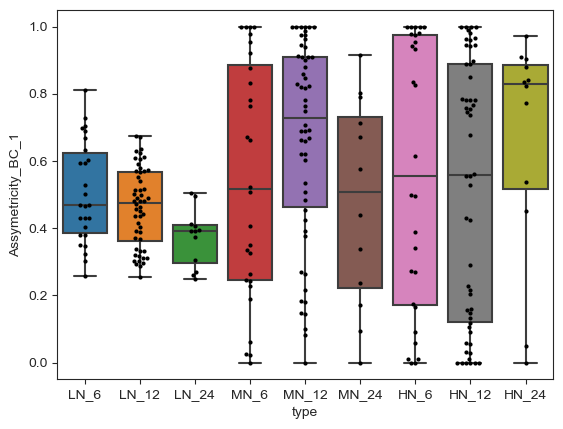

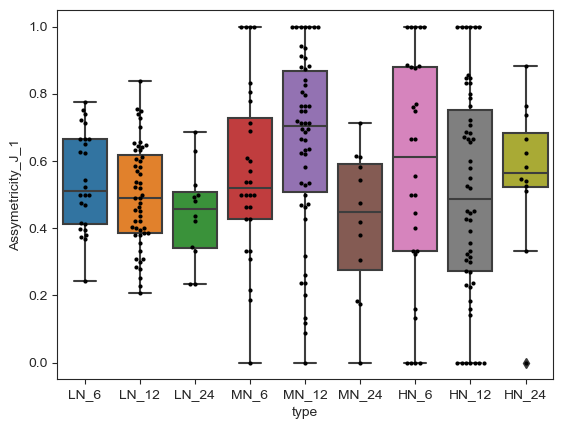

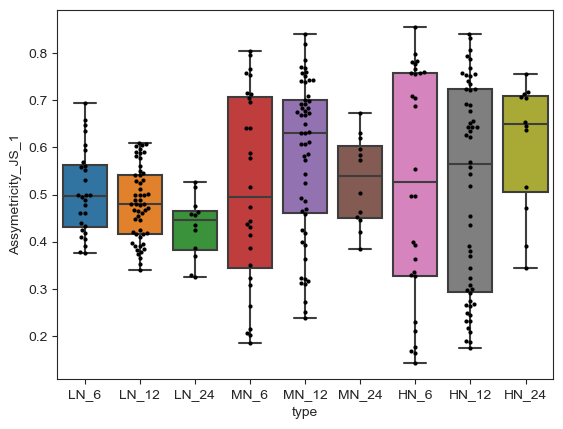

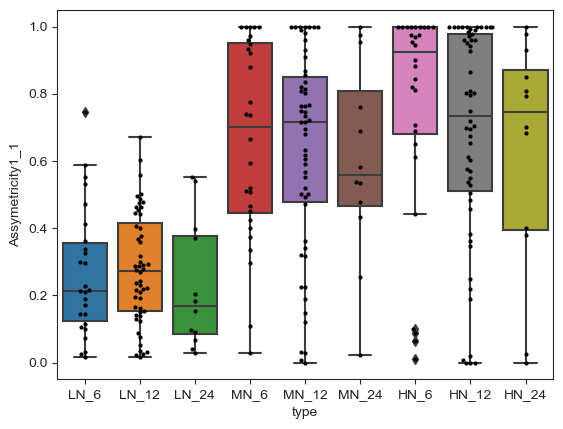

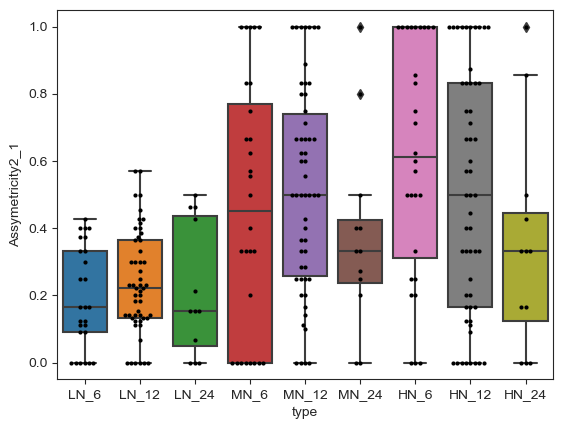

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 60.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 79.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 60.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

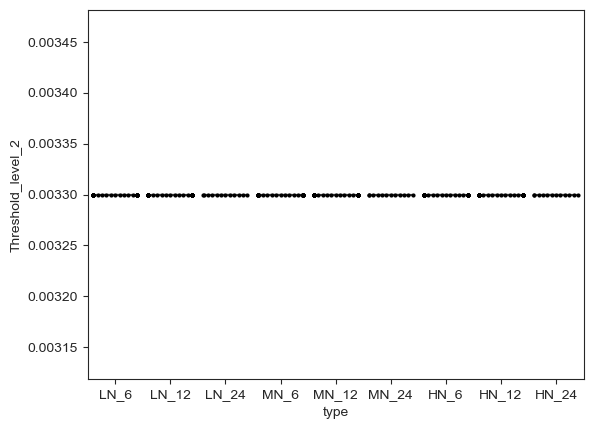

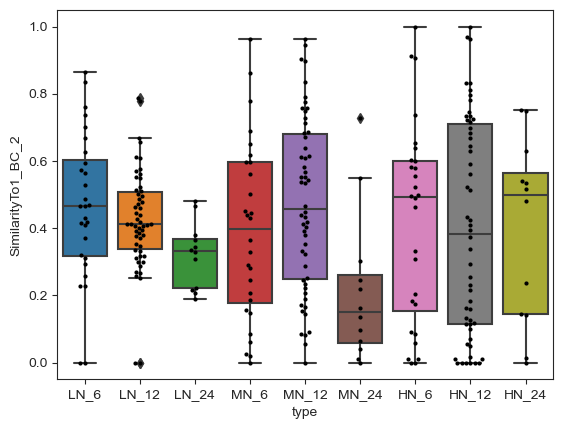

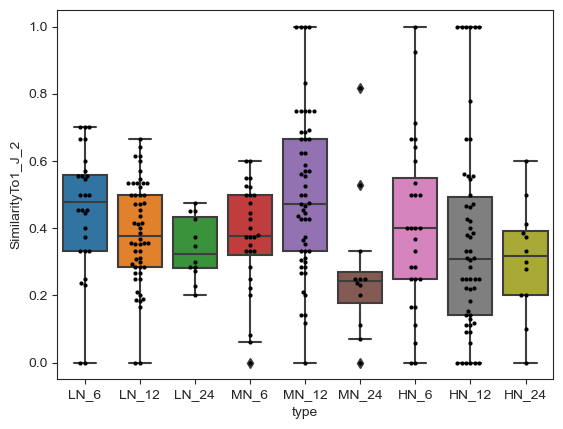

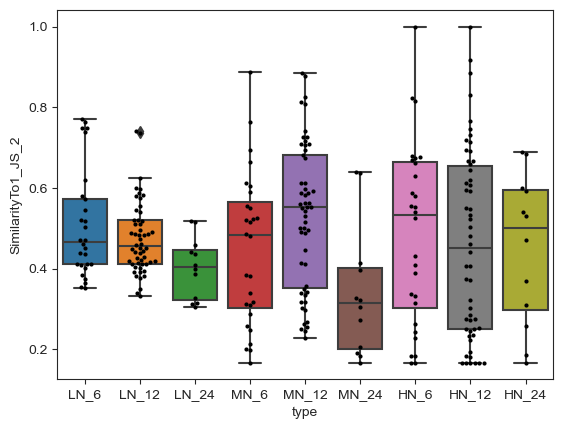

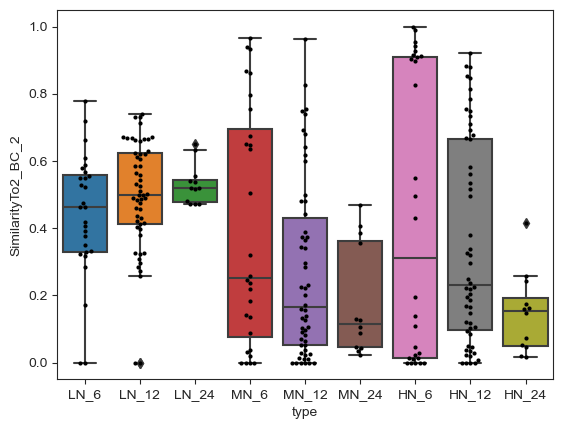

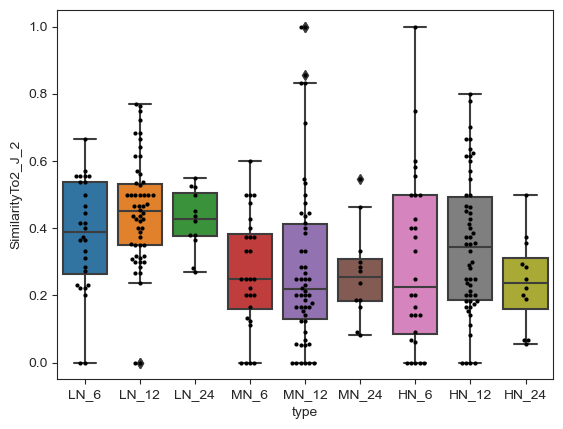

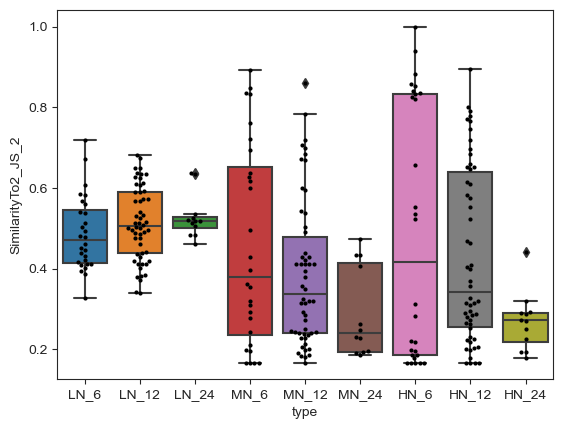

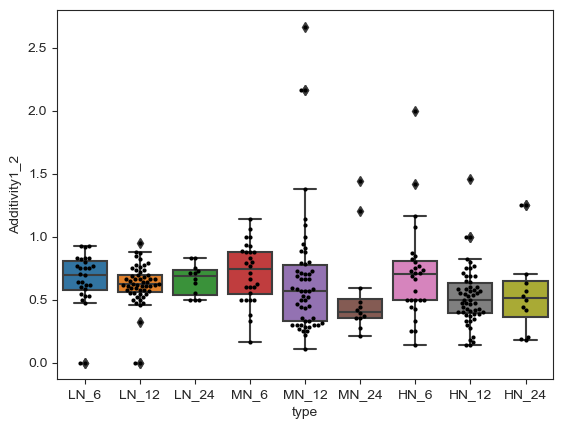

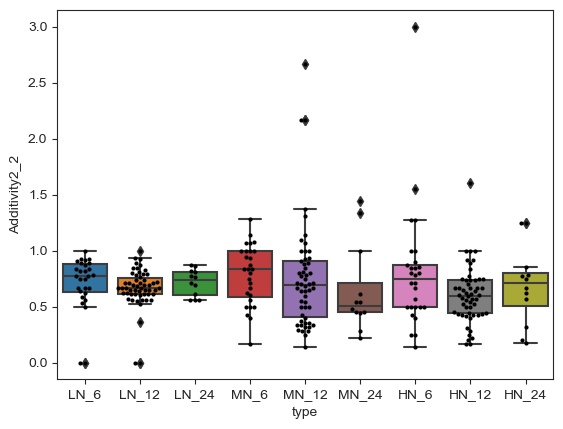

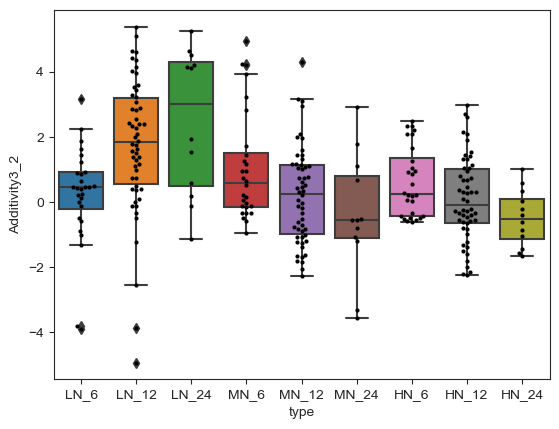

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 10.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 9.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 14.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 21.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

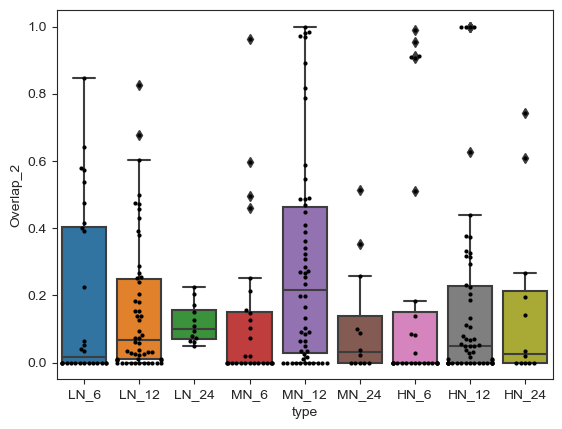

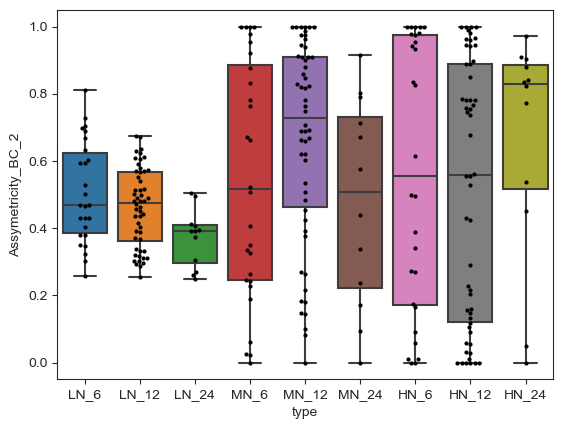

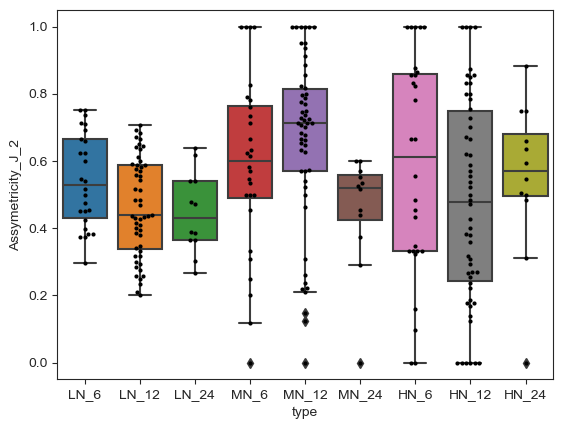

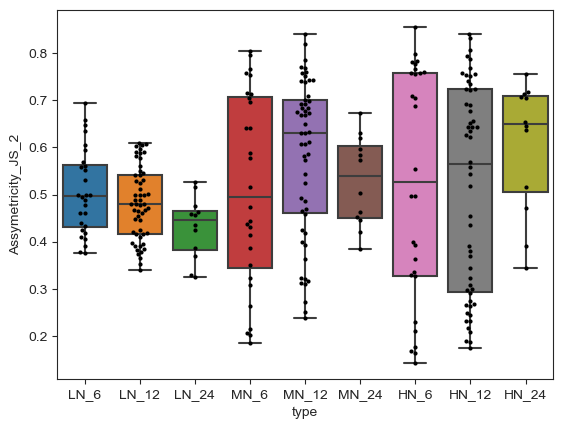

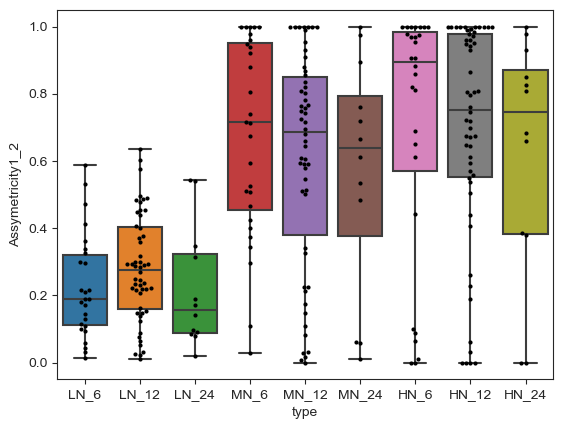

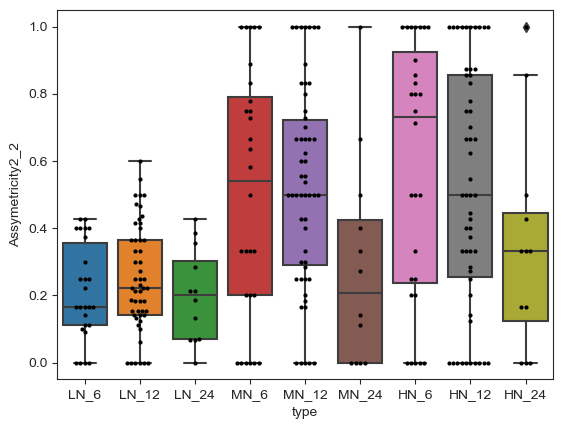

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 60.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 79.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 60.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

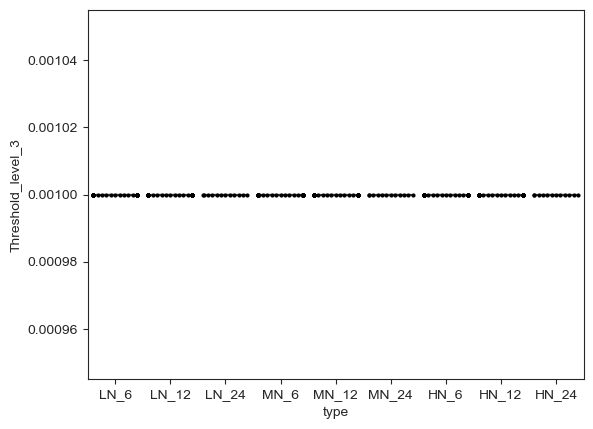

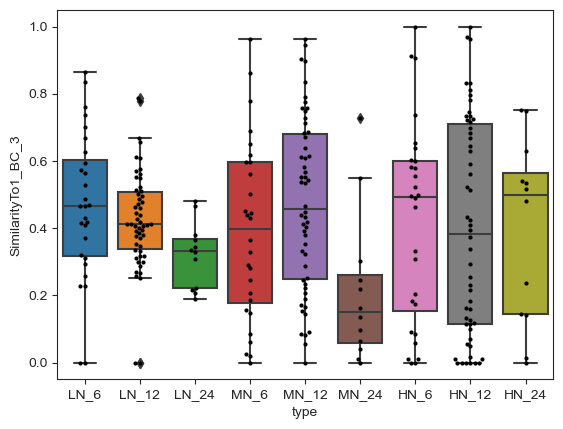

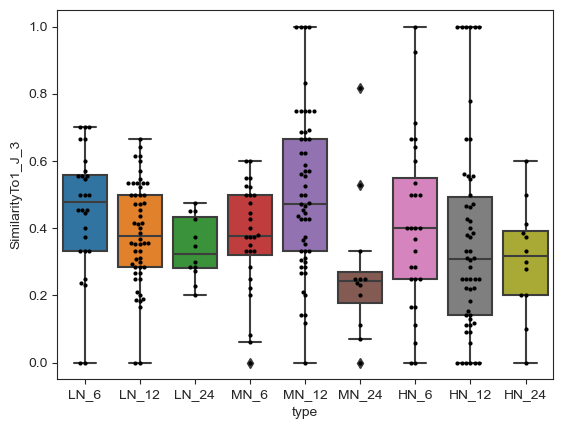

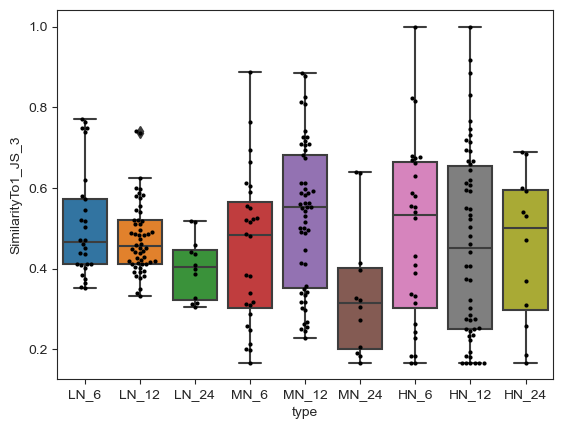

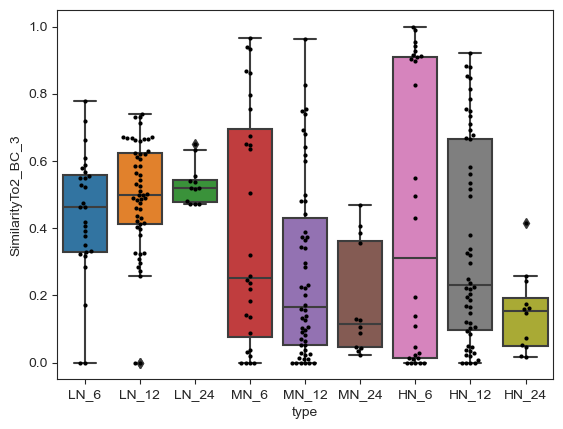

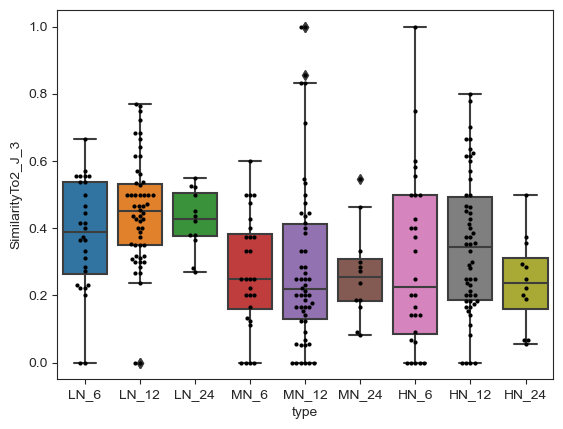

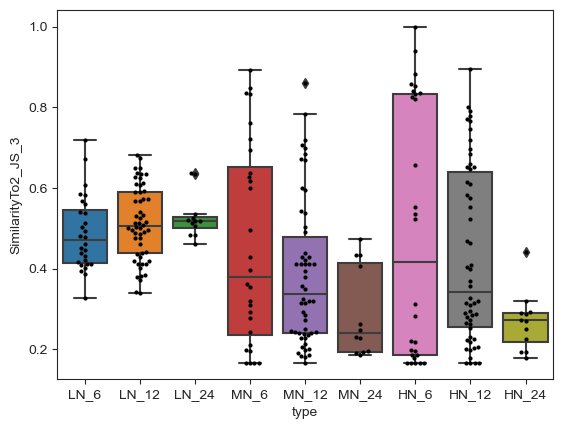

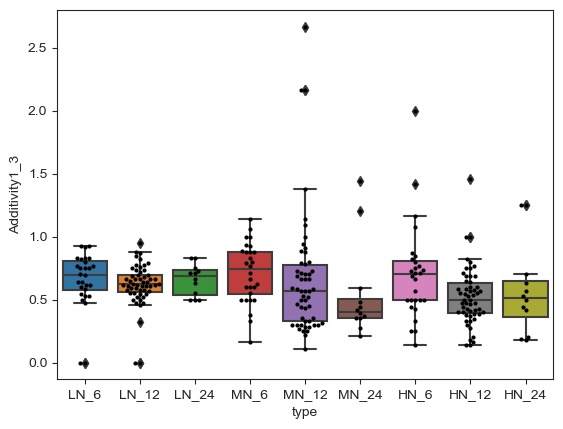

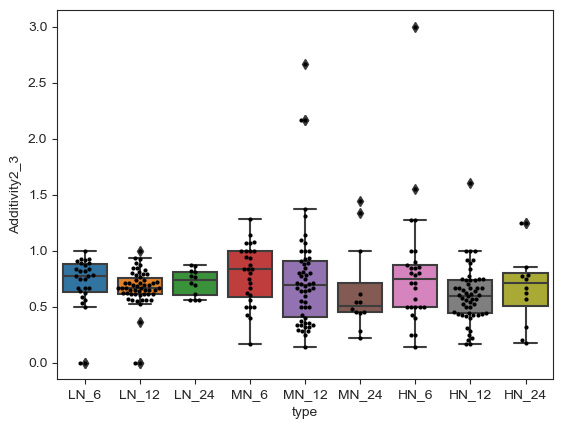

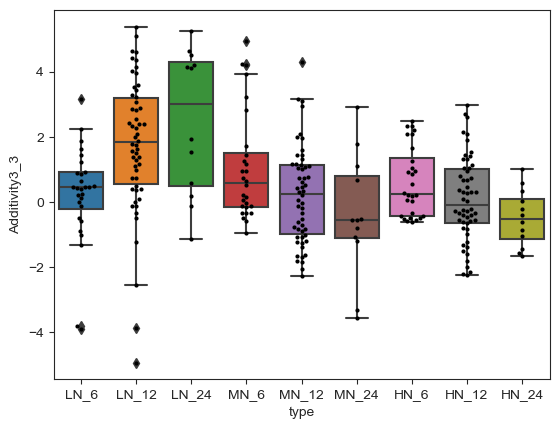

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 10.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 9.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 14.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 21.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

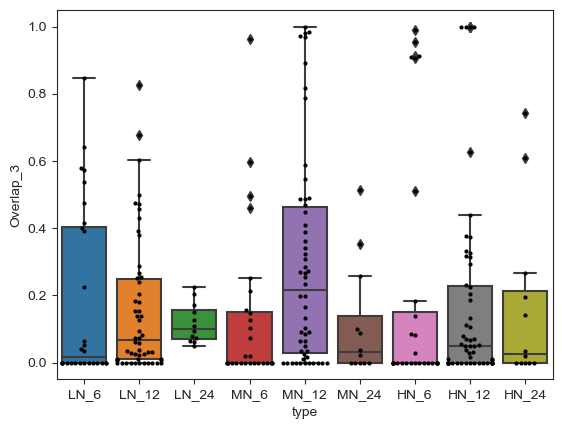

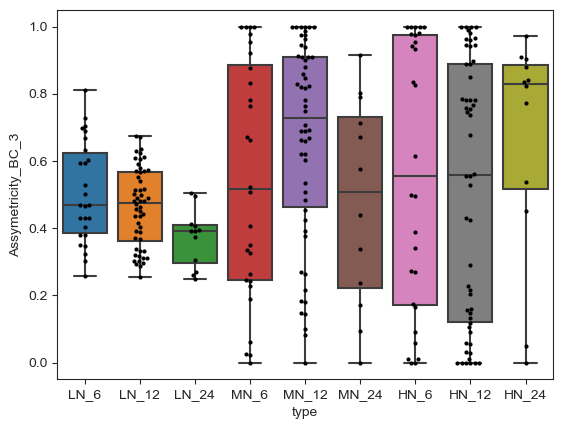

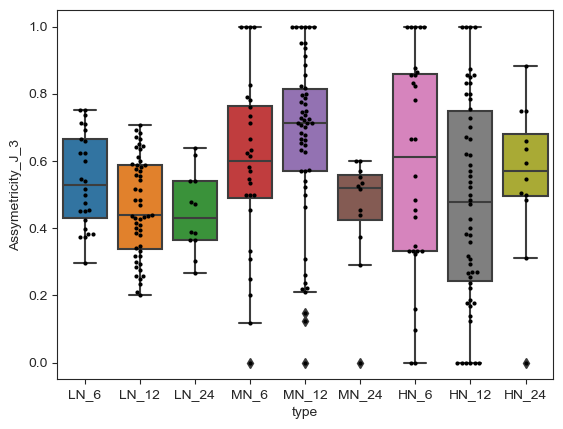

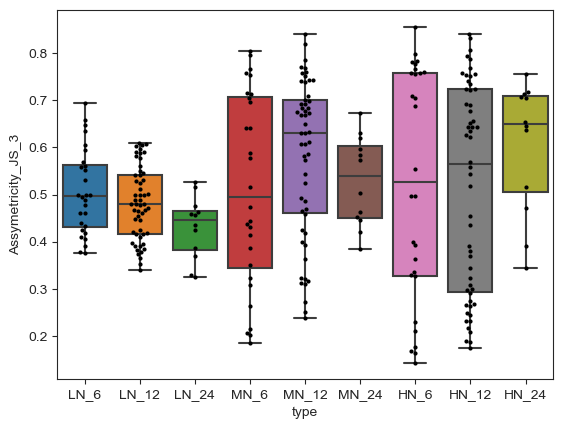

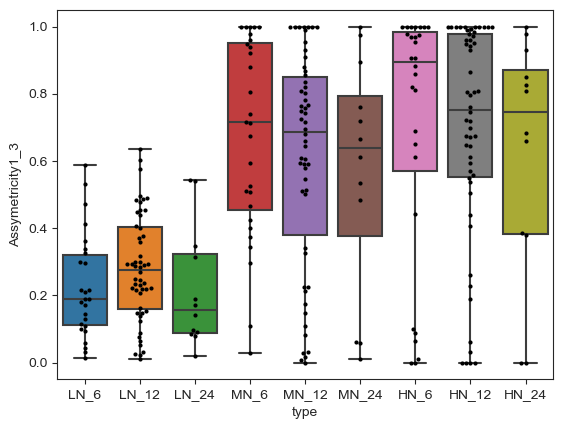

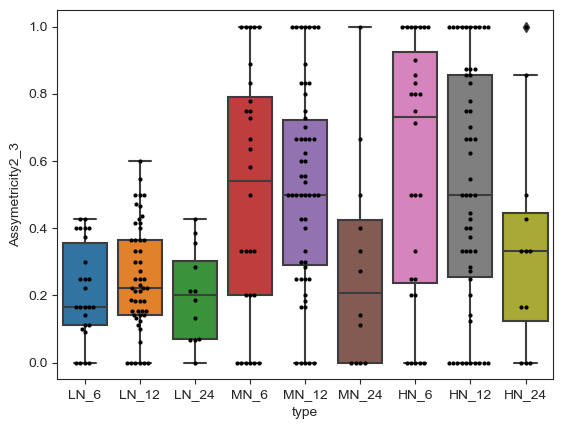

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 60.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 79.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 60.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

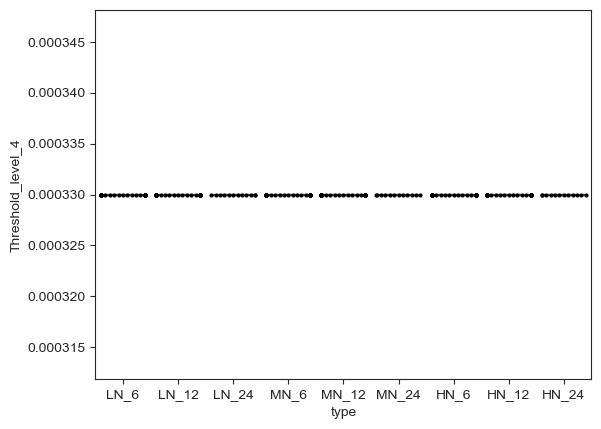

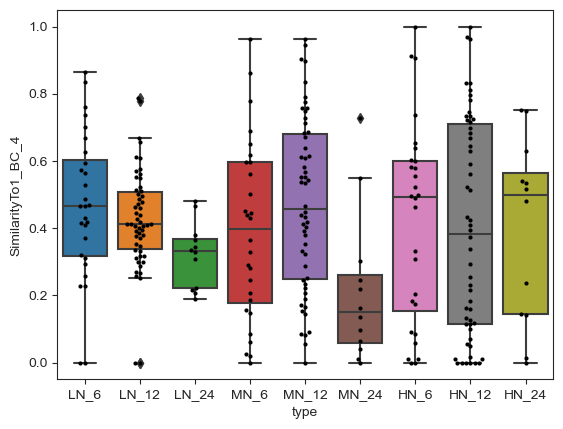

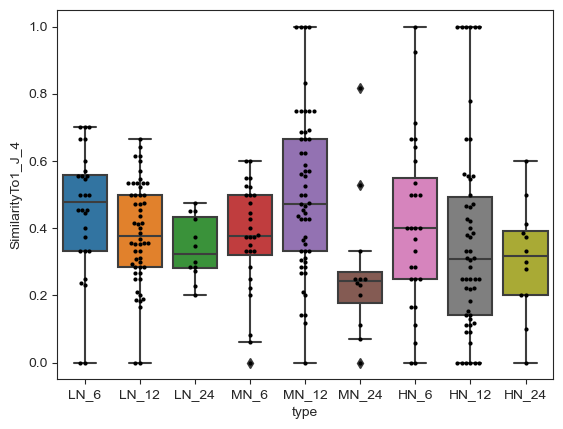

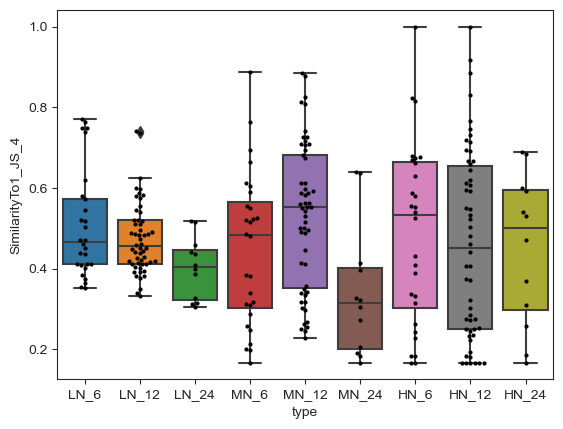

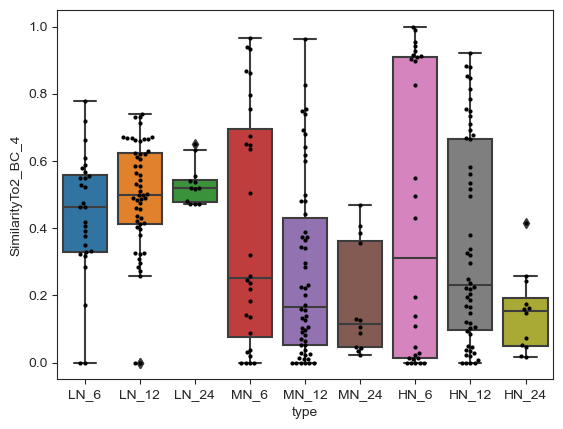

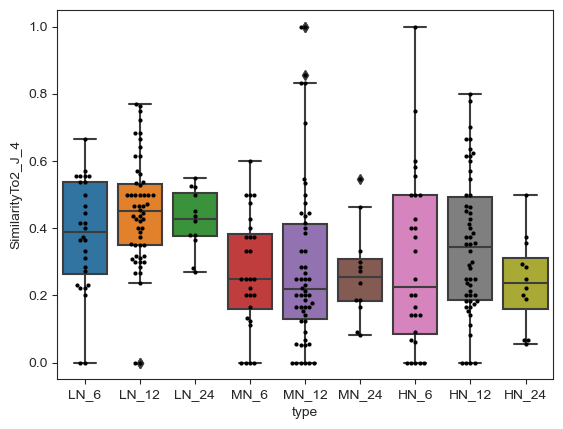

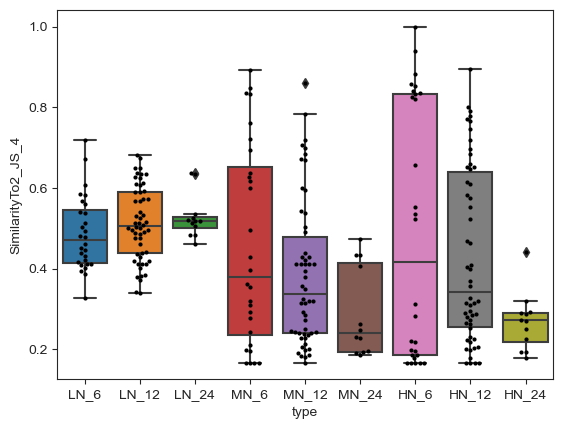

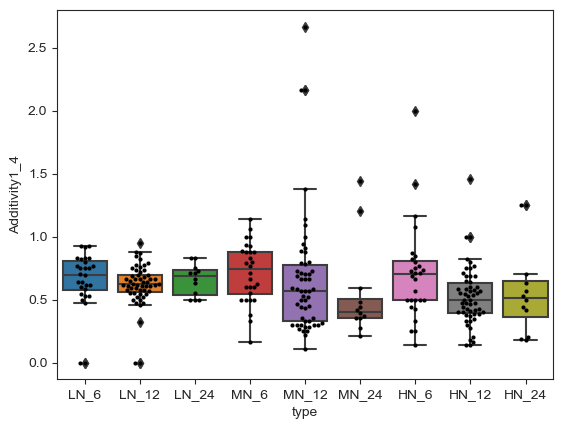

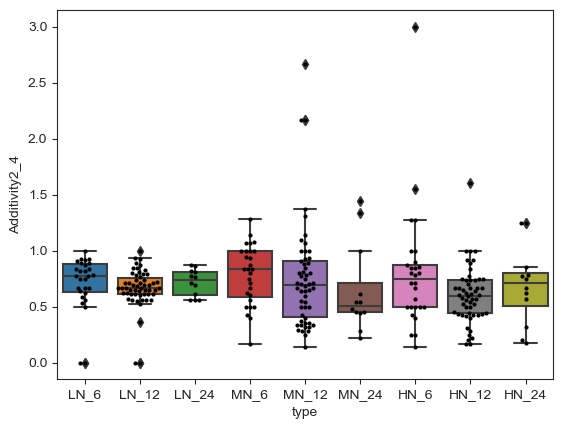

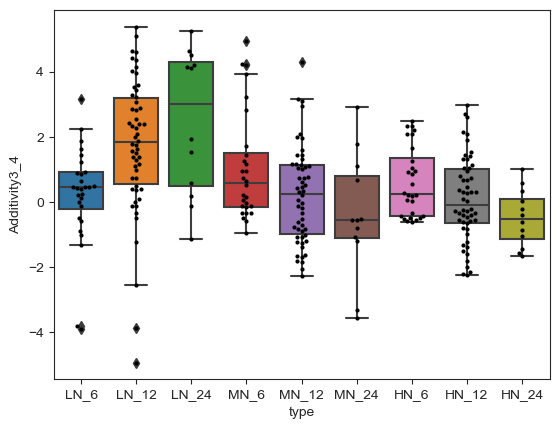

/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 10.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 9.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 14.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/miniconda3/envs/jy_env/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 21.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jysong/min

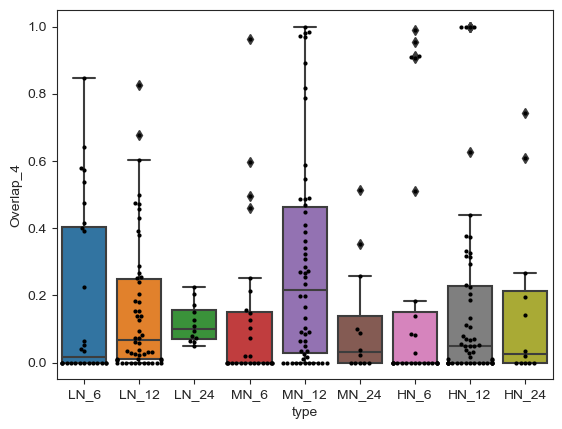

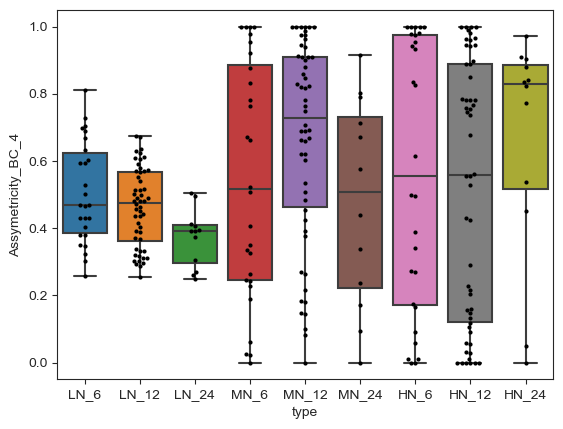

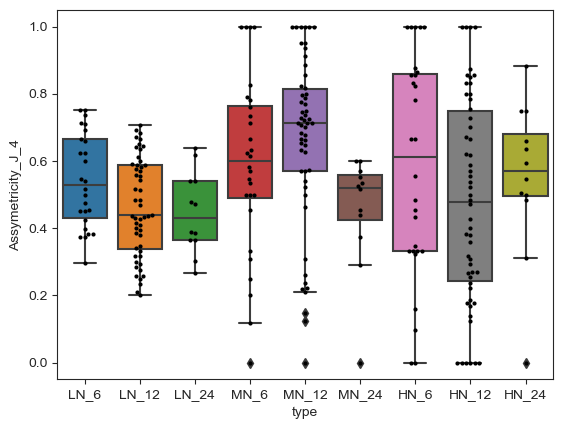

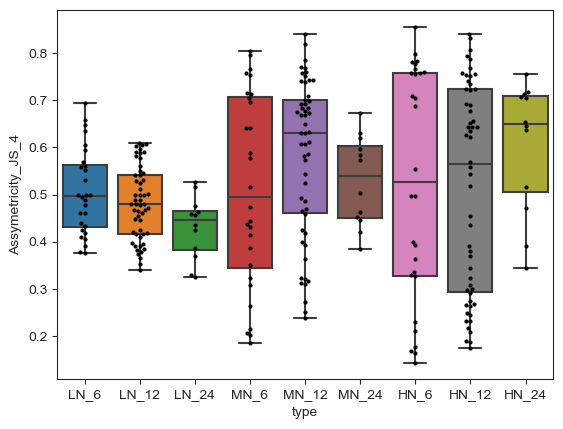

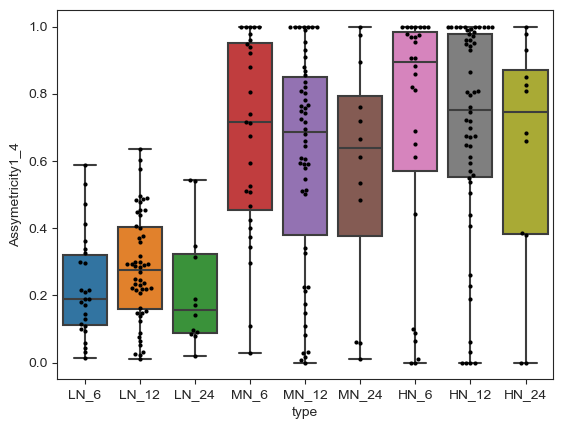

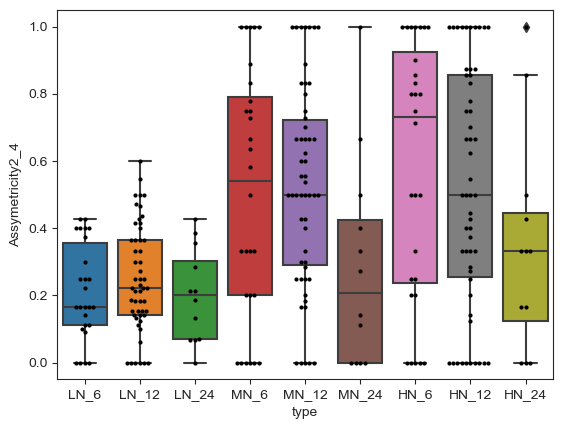